# Load Library

In [1]:
# general imports
import sys
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import multiprocessing as mp
import wandb
import pickle

In [2]:
torch.__version__

'2.2.2'

In [3]:
# get the DGD modules (once the current version is public we can switch to the repo)
# git clone https://github.com/Center-for-Health-Data-Science/DeepGenerativeDecoder.git
# for now I added them to this repo, but the imports will stay the same
from base.dgd.nn import NB_Module

# get the new stuff
from base.utils.helpers import set_seed, get_activation
from base.model.decoder import Decoder
from base.engine.cv import cross_validate

# Set seeds, device, and directory

In [4]:
torch.cuda.is_available()

True

In [5]:
# set random seeds, device and data directory
seed = 42
set_seed(seed)

num_workers = 14

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

datadir = "./data/"

cuda


# Load Data

In [6]:
tcga_mrna = pd.read_table("data/TCGA_mrna_counts_match_iso.tsv", sep='\t', index_col=[0])
tcga_mirna = pd.read_table("data/TCGA_mirna_counts_match_iso.tsv", sep='\t', index_col=[0])

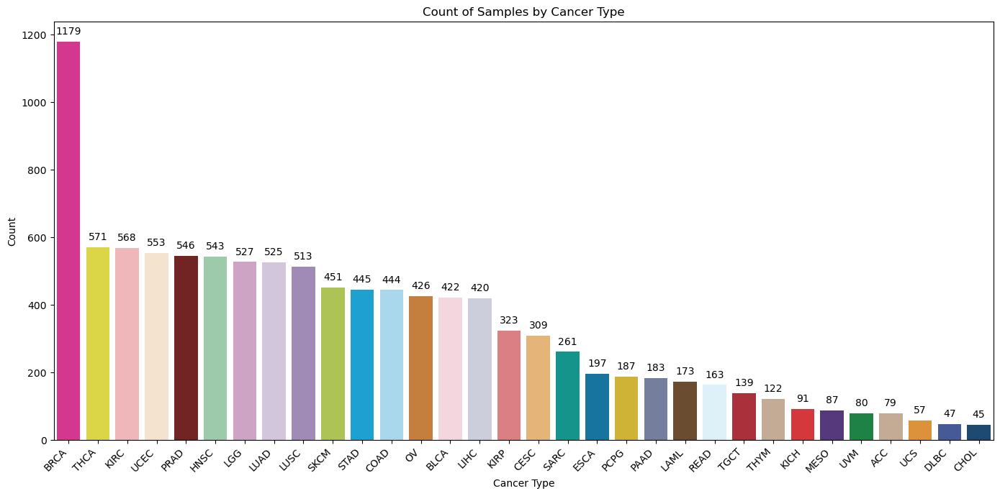

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

color_mapping = dict(zip(tcga_mrna['cancer_type'], tcga_mrna['color']))

primary_site_counts = tcga_mrna['cancer_type'].value_counts().reset_index()
primary_site_counts.columns = ['cancer_type', 'count']

# Create a bar plot
plt.figure(figsize=(14, 7))
barplot = sns.barplot(x='cancer_type', hue='cancer_type', y='count', data=primary_site_counts, palette=color_mapping)
plt.xlabel('Cancer Type')
plt.ylabel('Count')
plt.title('Count of Samples by Cancer Type')
plt.xticks(rotation=45, ha='right')  # Rotate the x labels to show them more clearly

# Annotate each bar with the count
for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'),  # Format the count as a string with no decimal places
                     (p.get_x() + p.get_width() / 2., p.get_height()),  # Position the text at the center of the bar
                     ha='center', va='center',  # Center the text horizontally and vertically
                     xytext=(0, 10),  # Offset the text by 10 points vertically
                     textcoords='offset points')  # Use offset points for the text coordinates

plt.tight_layout()  # Adjust the layout to fit the x labels
plt.show()

In [8]:
# shuffle the data
tcga_mrna = tcga_mrna.sample(frac=1, random_state=seed)
tcga_mirna = tcga_mirna.sample(frac=1, random_state=seed)

In [9]:
print(tcga_mrna.isna().sum().sum())
print(tcga_mirna.isna().sum().sum())

0
0


In [10]:
# make data split for train, validation, and test sets
is_split_data = False
train_ratio = 0.80
n_replace_with_na = False

if n_replace_with_na == False:
    is_plot = True
else:
    is_plot = False

is_subset = False

# Replace some values with NaN
if n_replace_with_na:
    # Specify the number of values to replace with NaN
    num_replace = n_replace_with_na

    # Get the number of rows and columns (excluding the last three columns)
    num_rows_mrna, num_cols_mrna = tcga_mrna.shape
    num_rows_mirna, num_cols_mirna = tcga_mirna.shape
    num_cols_mrna -= 4
    num_cols_mirna -= 4
    
    # Generate random row and column indices to replace with NaN
    row_indices_mrna = np.random.choice(num_rows_mrna, size=num_replace, replace=False)
    col_indices_mrna = np.random.choice(num_cols_mrna, size=num_replace, replace=False)
    row_indices_mirna = np.random.choice(num_rows_mirna, size=num_replace, replace=False)
    col_indices_mirna = np.random.choice(num_cols_mirna, size=num_replace, replace=False)

    # Replace the selected values with NaN
    for row, col in zip(row_indices_mrna, col_indices_mrna):
        tcga_mrna.iat[row, col] = np.nan
    for row, col in zip(row_indices_mirna, col_indices_mirna):
        tcga_mirna.iat[row, col] = np.nan

if is_split_data:
    # Calculate split indices
    total_samples = len(tcga_mrna)
    train_end = int(train_ratio * total_samples)

    # Split the data
    train_mrna = tcga_mrna.iloc[:train_end]
    test_mrna = tcga_mrna.iloc[train_end:]

    train_mirna = tcga_mirna.iloc[:train_end]
    test_mirna = tcga_mirna.iloc[train_end:]
else:
    train_mrna = tcga_mrna
    test_mrna = tcga_mrna

    train_mirna = tcga_mirna
    test_mirna = tcga_mirna

if is_subset:
    annot = train_mrna.iloc[:,-4:].columns
    selected_columns = train_mrna.iloc[:, :-4].sample(n=5000, axis=1, random_state=seed, replace=False).columns
    train_mrna = train_mrna[selected_columns.append(annot)]
    test_mrna = test_mrna[selected_columns.append(annot)]

In [11]:
print(train_mrna.isna().sum().sum())
print(train_mirna.isna().sum().sum())

0
0


In [12]:
np.where(train_mrna.isna())

(array([], dtype=int64), array([], dtype=int64))

In [13]:
print(train_mrna.shape)
print(test_mrna.shape)
print(train_mirna.shape)
print(test_mirna.shape)

(10676, 19788)
(10676, 19788)
(10676, 2454)
(10676, 2454)


In [14]:
# make data split for train and validation sets
mrna_out_dim = train_mrna.shape[1]-4
mirna_out_dim = train_mirna.shape[1]-4
print(mrna_out_dim)
print(mirna_out_dim)

19784
2450


In [15]:
n_tissues = len(np.unique(train_mrna['cancer_type']))
# n_tissues = 40

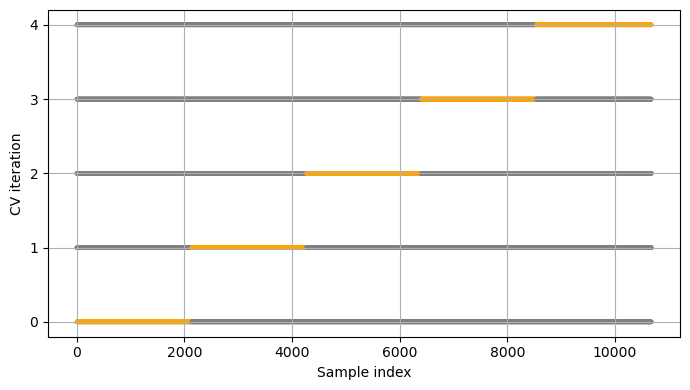

In [16]:
from base.plotting.kfold import plot_kfold

plot_kfold(train_mrna, n_splits=5, figsize=(7,4))

# Model Setup

In [17]:
# hyperparameters
latent_dim = 20
hidden_dims = [128, 256]
reduction_type = "sum" # output loss reduction

In [18]:
# decoder setup
activation = "relu"

# set up an output module for the mRNA expression data
mrna_out_fc = nn.Sequential(
    nn.Linear(hidden_dims[-1], 512),
    get_activation(activation),
    nn.Linear(512, mrna_out_dim)
    )
output_mrna_layer = NB_Module(mrna_out_fc, mrna_out_dim, scaling_type="mean")
output_mrna_layer.n_features = mrna_out_dim

# set up an output module for the miRNA expression data
mirna_out_fc = nn.Sequential(
    nn.Linear(hidden_dims[-1], 256),
    get_activation(activation),
    nn.Linear(256, mirna_out_dim)
    )
output_mirna_layer = NB_Module(mirna_out_fc, mirna_out_dim, scaling_type="mean")
output_mirna_layer.n_features = mirna_out_dim

# set up the decoder
decoder = Decoder(latent_dim, hidden_dims, [output_mirna_layer, output_mrna_layer], activation=activation).to(device)

# setup gmm init
gmm_mean_scale = 5.0 # usually between 2 and 10
sd_mean_init = 0.2 * gmm_mean_scale / n_tissues # empirically good for single-cell data at dimensionality 20
gmm_spec = {"mean_init": (gmm_mean_scale, 5.0), 
            "sd_init": (sd_mean_init, 1.0), 
            "weight_alpha": 1}

In [19]:
decoder.out_modules[0].n_features

2450

# Training

In [20]:
learning_rates={'dec':0.001,'rep':0.01,'gmm':0.01}
weight_decay=0.0001
betas=(0.9, 0.999)
nepochs = 401
pr = 10 # how often to print epoch
plot = 200 # how often to print plot
batch_size = 64
n_splits=5

sample_mirna = ['MIMAT0000421', 'MIMAT0000422', 'MIMAT0000435', 'MIMAT0000728'] # miR-122-5p and miR-124-3p and others
sample_index = [tcga_mirna.columns.get_loc(a) for a in sample_mirna]
subset = sample_index[0]
sample_index = [0, 10, 20, 300, 1382, 1310, 34, 360, 765, 999, 2000, 93]

In [21]:
is_plot

True

Fold: 1...


  0%|                                                                                              | 0/401 [00:00<?, ?it/s]

0 train_recon: 7.881661796531211 train_gmm: 5.95670550093997 train_mse: 483852.8125 train_mae: 223.54478454589844 train_r2: -0.0028029680252075195 train_spearman: 0.07659309357404709 train_pearson: 0.037441667169332504 train_expl_var: -0.0028029680252075195 train_msle: 20.221940994262695
0 test_recon: 6.8879951736534695 test_gmm: 2.941584394933579 test_mse: 6863975.5 test_mae: 891.4193725585938 test_r2: -0.0076950788497924805 test_spearman: 0.11465940624475479 test_pearson: 0.017045019194483757 test_expl_var: -0.007695198059082031 test_msle: 32.87718200683594


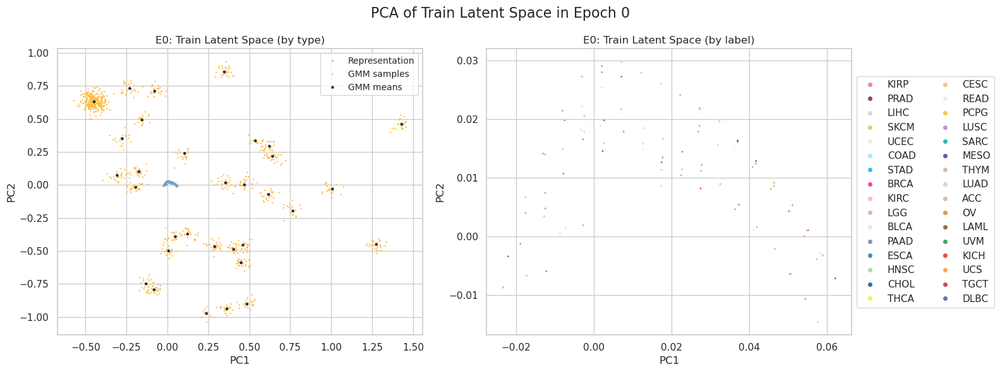

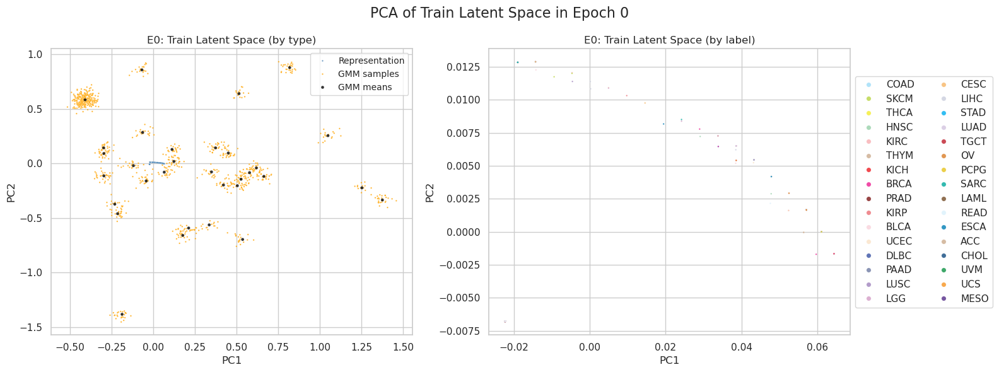

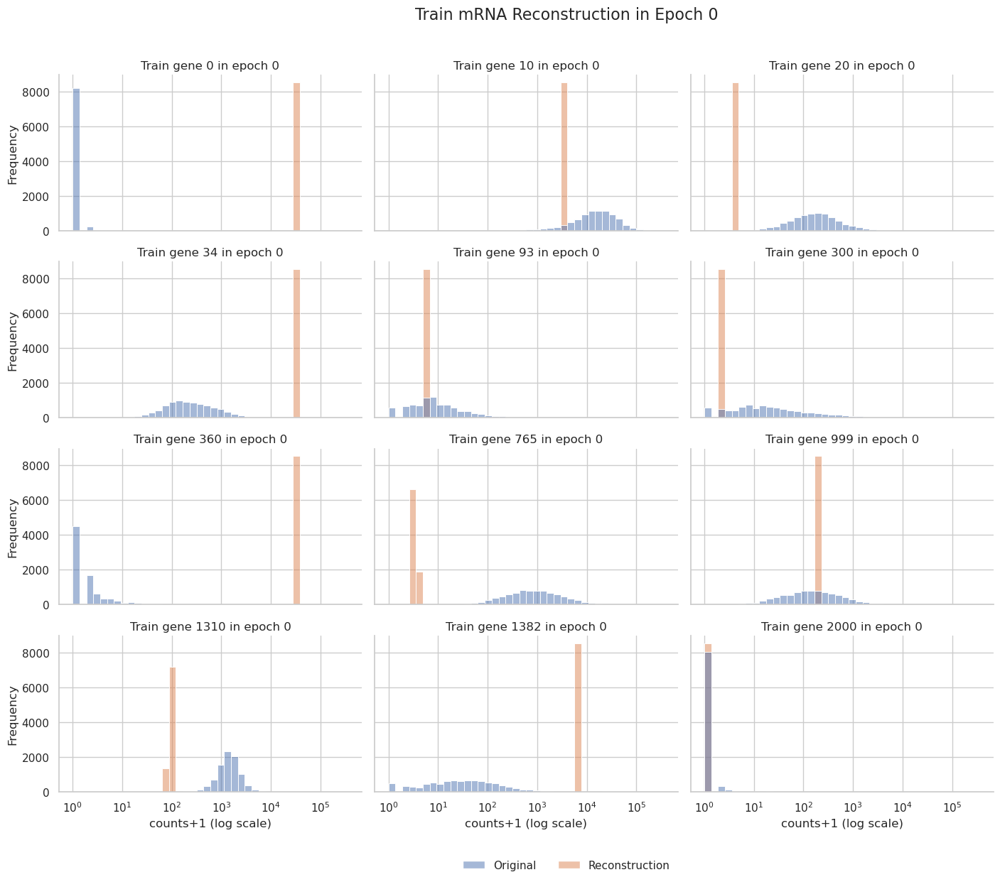

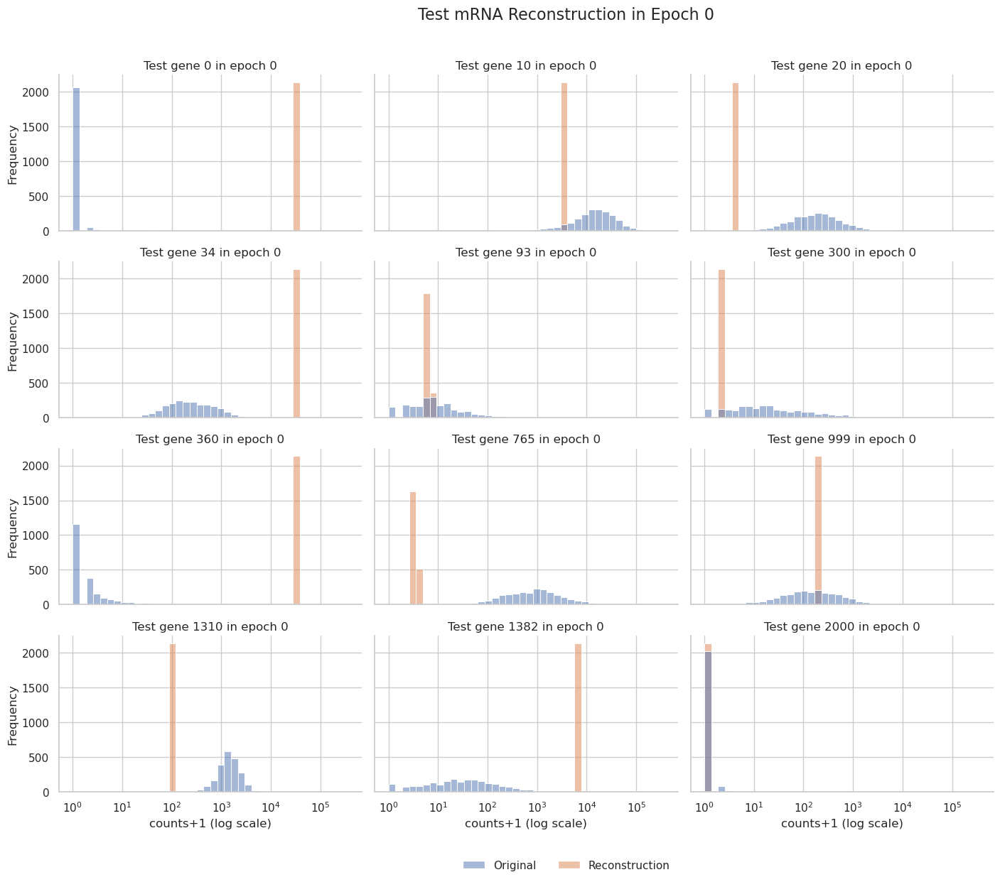

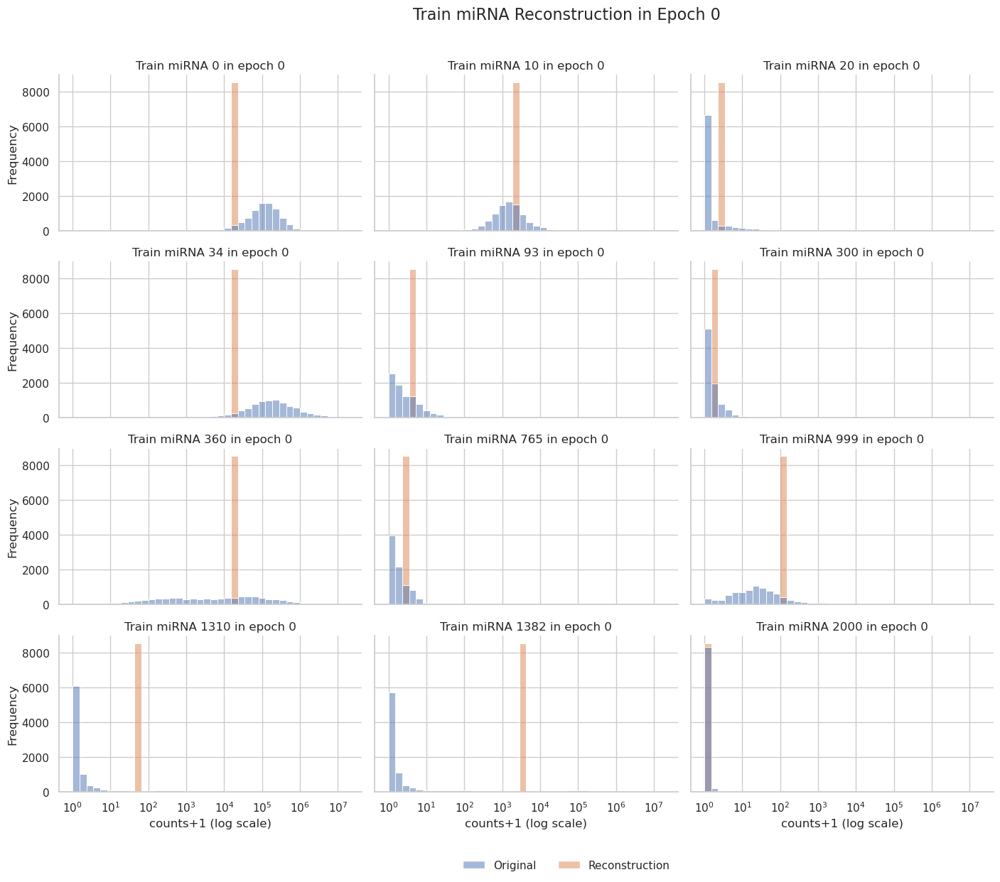

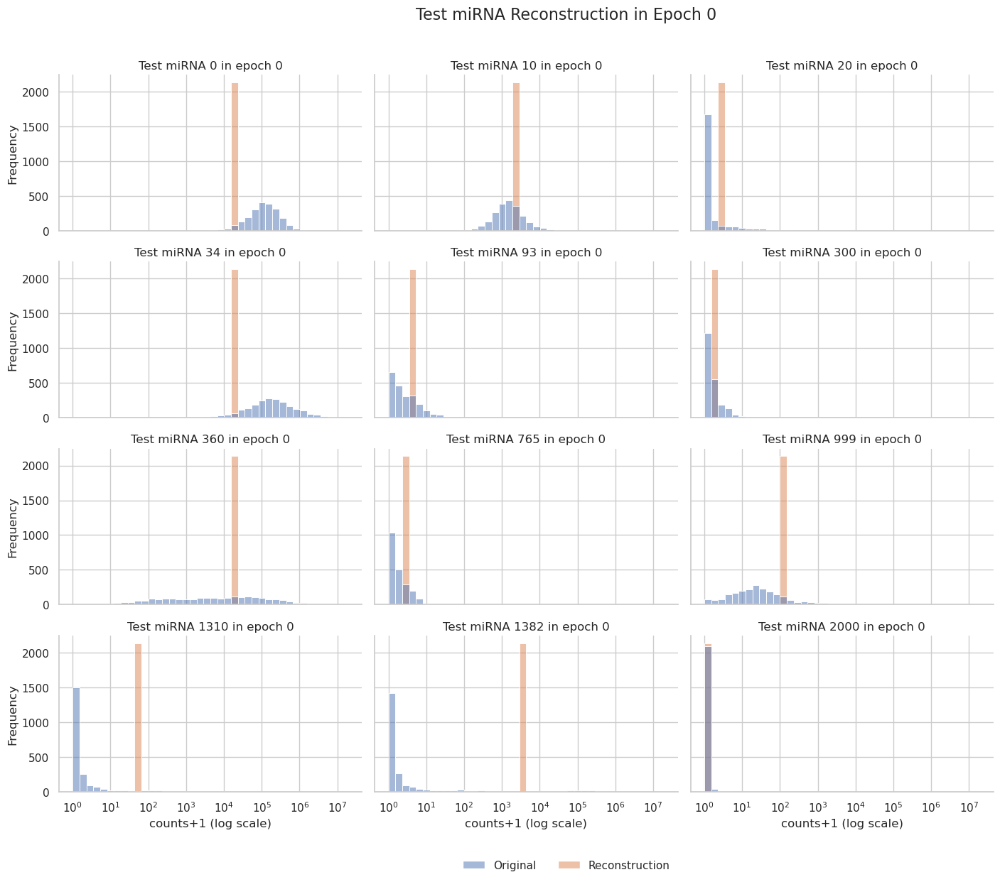

  3%|██▎                                                                                  | 11/401 [01:47<28:18,  4.36s/it]

10 train_recon: 6.58779619225698 train_gmm: 2.1525259721027883 train_mse: 462524.78125 train_mae: 216.3819122314453 train_r2: 0.04140019416809082 train_spearman: 0.06425092369318008 train_pearson: 0.2154613882303238 train_expl_var: 0.041400253772735596 train_msle: 18.31188201904297
10 test_recon: 6.362719391447252 test_gmm: 2.1528136206923354 test_mse: 6512137.0 test_mae: 859.7363891601562 test_r2: 0.04395800828933716 test_spearman: 0.07718417793512344 test_pearson: 0.22179271280765533 test_expl_var: 0.04395800828933716 test_msle: 30.28122901916504


  5%|████▍                                                                                | 21/401 [02:24<23:41,  3.74s/it]

20 train_recon: 6.279466940045196 train_gmm: 2.157015546669167 train_mse: 115716.578125 train_mae: 64.16993713378906 train_r2: 0.7601730823516846 train_spearman: 0.33714333176612854 train_pearson: 0.8782622814178467 train_expl_var: 0.7601730823516846 train_msle: 3.2692205905914307
20 test_recon: 6.0930291074943765 test_gmm: 2.1569171891230323 test_mse: 1391410.375 test_mae: 250.62535095214844 test_r2: 0.7957280874252319 test_spearman: 0.3608104884624481 test_pearson: 0.89809250831604 test_expl_var: 0.7957280874252319 test_msle: 6.104817867279053


  8%|██████▌                                                                              | 31/401 [03:01<23:05,  3.75s/it]

30 train_recon: 6.100615703390318 train_gmm: 2.161582807411355 train_mse: 92911.234375 train_mae: 47.32451248168945 train_r2: 0.8074380159378052 train_spearman: 0.39643678069114685 train_pearson: 0.898979127407074 train_expl_var: 0.8074380159378052 train_msle: 1.2508316040039062
30 test_recon: 5.927680162379108 test_gmm: 2.16161374438568 test_mse: 1221846.0 test_mae: 192.0194854736328 test_r2: 0.8206217288970947 test_spearman: 0.41147634387016296 test_pearson: 0.9059721231460571 test_expl_var: 0.8206217288970947 test_msle: 2.839097261428833


 10%|████████▋                                                                            | 41/401 [03:38<21:53,  3.65s/it]

40 train_recon: 5.96296234863204 train_gmm: 2.1688470894949776 train_mse: 102147.2890625 train_mae: 49.136898040771484 train_r2: 0.7882959842681885 train_spearman: 0.42219218611717224 train_pearson: 0.8880098462104797 train_expl_var: 0.7882959842681885 train_msle: 0.8097279667854309
40 test_recon: 5.803218097077089 test_gmm: 2.1691479515047107 test_mse: 1350253.5 test_mae: 200.95730590820312 test_r2: 0.8017702698707581 test_spearman: 0.4411059617996216 test_pearson: 0.8954171538352966 test_expl_var: 0.8017702698707581 test_msle: 2.0284719467163086


 13%|██████████▊                                                                          | 51/401 [04:15<21:44,  3.73s/it]

50 train_recon: 5.8835442951476935 train_gmm: 2.178689450837968 train_mse: 97719.8984375 train_mae: 47.834835052490234 train_r2: 0.7974718809127808 train_spearman: 0.40714380145072937 train_pearson: 0.8931310772895813 train_expl_var: 0.7974718809127808 train_msle: 0.6231507658958435
50 test_recon: 5.73333437877644 test_gmm: 2.1792343882585734 test_mse: 1373796.75 test_mae: 202.59457397460938 test_r2: 0.7983139157295227 test_spearman: 0.4244965612888336 test_pearson: 0.8935204148292542 test_expl_var: 0.7983139157295227 test_msle: 1.8492120504379272


 15%|████████████▉                                                                        | 61/401 [04:52<21:07,  3.73s/it]

60 train_recon: 5.830633858171095 train_gmm: 2.1881308505127524 train_mse: 100024.65625 train_mae: 47.35331344604492 train_r2: 0.792695164680481 train_spearman: 0.427240788936615 train_pearson: 0.8903378248214722 train_expl_var: 0.792695164680481 train_msle: 0.4077061116695404
60 test_recon: 5.690619273751204 test_gmm: 2.1884493338481317 test_mse: 1371373.5 test_mae: 200.05638122558594 test_r2: 0.798669695854187 test_spearman: 0.44582533836364746 test_pearson: 0.8938753008842468 test_expl_var: 0.798669695854187 test_msle: 1.3302233219146729


 18%|███████████████                                                                      | 71/401 [05:29<20:15,  3.68s/it]

70 train_recon: 5.795960299267383 train_gmm: 2.195760086381184 train_mse: 99522.0234375 train_mae: 47.12933349609375 train_r2: 0.7937369346618652 train_spearman: 0.4324151873588562 train_pearson: 0.890931248664856 train_expl_var: 0.7937369346618652 train_msle: 0.3241840600967407
70 test_recon: 5.66386655311449 test_gmm: 2.1958072476619193 test_mse: 1360259.875 test_mae: 197.21119689941406 test_r2: 0.8003012537956238 test_spearman: 0.4524167776107788 test_pearson: 0.8947567939758301 test_expl_var: 0.8003012537956238 test_msle: 1.1433508396148682


 20%|█████████████████▏                                                                   | 81/401 [06:07<20:09,  3.78s/it]

80 train_recon: 5.770216816703073 train_gmm: 2.201519901177364 train_mse: 98232.3046875 train_mae: 46.76108932495117 train_r2: 0.7964099049568176 train_spearman: 0.4371025562286377 train_pearson: 0.8924224972724915 train_expl_var: 0.7964099049568176 train_msle: 0.28164300322532654
80 test_recon: 5.6449906724997545 test_gmm: 2.201107482338666 test_mse: 1336454.75 test_mae: 195.22372436523438 test_r2: 0.8037960529327393 test_spearman: 0.4566764235496521 test_pearson: 0.8966451287269592 test_expl_var: 0.8037960529327393 test_msle: 0.9833220839500427


 23%|███████████████████▎                                                                 | 91/401 [06:43<19:18,  3.74s/it]

90 train_recon: 5.749638423778254 train_gmm: 2.2057153877776456 train_mse: 99950.8671875 train_mae: 47.60355758666992 train_r2: 0.7928481101989746 train_spearman: 0.4479590058326721 train_pearson: 0.8904202580451965 train_expl_var: 0.7928481101989746 train_msle: 0.22653739154338837
90 test_recon: 5.629099563537505 test_gmm: 2.2049956818198444 test_mse: 1355962.375 test_mae: 195.8378448486328 test_r2: 0.8009321689605713 test_spearman: 0.46354538202285767 test_pearson: 0.8950470089912415 test_expl_var: 0.8009321689605713 test_msle: 0.7135448455810547


 25%|█████████████████████▏                                                              | 101/401 [07:20<18:39,  3.73s/it]

100 train_recon: 5.73343931346363 train_gmm: 2.209170823108396 train_mse: 102616.1171875 train_mae: 48.19773864746094 train_r2: 0.7873243093490601 train_spearman: 0.45759209990501404 train_pearson: 0.8873158097267151 train_expl_var: 0.7873243093490601 train_msle: 0.21412110328674316
100 test_recon: 5.618952927560752 test_gmm: 2.2082399318280737 test_mse: 1395145.75 test_mae: 200.85122680664062 test_r2: 0.7951797246932983 test_spearman: 0.47060343623161316 test_pearson: 0.8917797207832336 test_expl_var: 0.7951796650886536 test_msle: 0.6539008617401123


 28%|███████████████████████▎                                                            | 111/401 [07:57<17:57,  3.72s/it]

110 train_recon: 5.719491680094562 train_gmm: 2.2119797353275485 train_mse: 102742.7265625 train_mae: 48.07929611206055 train_r2: 0.787061870098114 train_spearman: 0.46415841579437256 train_pearson: 0.8871660828590393 train_expl_var: 0.787061870098114 train_msle: 0.183395117521286
110 test_recon: 5.607947875406933 test_gmm: 2.211005450187997 test_mse: 1375209.0 test_mae: 198.2439727783203 test_r2: 0.7981066107749939 test_spearman: 0.4763735830783844 test_pearson: 0.8934465646743774 test_expl_var: 0.7981065511703491 test_msle: 0.5416330695152283


 30%|█████████████████████████▎                                                          | 121/401 [08:35<17:38,  3.78s/it]

120 train_recon: 5.70847674137274 train_gmm: 2.2145006731019925 train_mse: 103144.71875 train_mae: 48.4404182434082 train_r2: 0.7862287163734436 train_spearman: 0.4672369062900543 train_pearson: 0.8866999745368958 train_expl_var: 0.7862287759780884 train_msle: 0.19650454819202423
120 test_recon: 5.6000527322345 test_gmm: 2.2127076138271375 test_mse: 1409430.0 test_mae: 201.1238250732422 test_r2: 0.7930826544761658 test_spearman: 0.4806515574455261 test_pearson: 0.8906391263008118 test_expl_var: 0.793082594871521 test_msle: 0.5735385417938232


 33%|███████████████████████████▍                                                        | 131/401 [09:12<16:47,  3.73s/it]

130 train_recon: 5.69866952453139 train_gmm: 2.215919546801815 train_mse: 101995.90625 train_mae: 48.02048873901367 train_r2: 0.7886096835136414 train_spearman: 0.4702293276786804 train_pearson: 0.8880400657653809 train_expl_var: 0.7886096835136414 train_msle: 0.18883417546749115
130 test_recon: 5.5938841704626885 test_gmm: 2.2142467370193994 test_mse: 1406738.25 test_mae: 201.2522735595703 test_r2: 0.7934778332710266 test_spearman: 0.48617616295814514 test_pearson: 0.8908500671386719 test_expl_var: 0.7934777736663818 test_msle: 0.5432521104812622


 35%|█████████████████████████████▌                                                      | 141/401 [09:49<16:05,  3.71s/it]

140 train_recon: 5.690462632234658 train_gmm: 2.217674793538221 train_mse: 100297.234375 train_mae: 47.522674560546875 train_r2: 0.7921302318572998 train_spearman: 0.4665350615978241 train_pearson: 0.8900191187858582 train_expl_var: 0.7921302318572998 train_msle: 0.17196357250213623
140 test_recon: 5.588513961897947 test_gmm: 2.2156130987160214 test_mse: 1380308.375 test_mae: 197.6018829345703 test_r2: 0.797357976436615 test_spearman: 0.48035699129104614 test_pearson: 0.8930665850639343 test_expl_var: 0.7973579168319702 test_msle: 0.48381564021110535


 38%|███████████████████████████████▋                                                    | 151/401 [10:27<15:39,  3.76s/it]

150 train_recon: 5.683725095108258 train_gmm: 2.218648445075792 train_mse: 101541.3671875 train_mae: 48.10515213012695 train_r2: 0.7895517349243164 train_spearman: 0.47238627076148987 train_pearson: 0.8885790109634399 train_expl_var: 0.7895517349243164 train_msle: 0.1804017871618271
150 test_recon: 5.58438126634176 test_gmm: 2.2165389071689563 test_mse: 1391810.125 test_mae: 199.44610595703125 test_r2: 0.7956693768501282 test_spearman: 0.48639529943466187 test_pearson: 0.8920968174934387 test_expl_var: 0.7956693768501282 test_msle: 0.4817003607749939


 40%|█████████████████████████████████▋                                                  | 161/401 [11:03<14:46,  3.70s/it]

160 train_recon: 5.677965751336803 train_gmm: 2.219490475799775 train_mse: 101479.46875 train_mae: 48.01602554321289 train_r2: 0.789680004119873 train_spearman: 0.4673098921775818 train_pearson: 0.8886479735374451 train_expl_var: 0.789680004119873 train_msle: 0.1763521134853363
160 test_recon: 5.58087146747617 test_gmm: 2.217235733775164 test_mse: 1382592.75 test_mae: 198.2378387451172 test_r2: 0.7970225811004639 test_spearman: 0.48599591851234436 test_pearson: 0.8928812146186829 test_expl_var: 0.7970225811004639 test_msle: 0.4868296682834625


 43%|███████████████████████████████████▊                                                | 171/401 [11:40<14:06,  3.68s/it]

170 train_recon: 5.672926332942838 train_gmm: 2.2198888402577026 train_mse: 100824.2421875 train_mae: 47.952919006347656 train_r2: 0.7910380363464355 train_spearman: 0.46783509850502014 train_pearson: 0.8894182443618774 train_expl_var: 0.7910380363464355 train_msle: 0.22037523984909058
170 test_recon: 5.577222871035654 test_gmm: 2.2172523870003804 test_mse: 1381105.25 test_mae: 199.9385223388672 test_r2: 0.7972409725189209 test_spearman: 0.48524266481399536 test_pearson: 0.8929360508918762 test_expl_var: 0.7972409725189209 test_msle: 0.6136100888252258


 45%|█████████████████████████████████████▉                                              | 181/401 [12:17<13:32,  3.69s/it]

180 train_recon: 5.668733153688498 train_gmm: 2.2202139475194853 train_mse: 100488.421875 train_mae: 47.6281623840332 train_r2: 0.791733980178833 train_spearman: 0.47213447093963623 train_pearson: 0.8898008465766907 train_expl_var: 0.791733980178833 train_msle: 0.16900037229061127
180 test_recon: 5.576493724477713 test_gmm: 2.2176116114698545 test_mse: 1354222.25 test_mae: 196.01393127441406 test_r2: 0.8011876344680786 test_spearman: 0.49011746048927307 test_pearson: 0.8951807022094727 test_expl_var: 0.8011876344680786 test_msle: 0.44303253293037415


 48%|████████████████████████████████████████                                            | 191/401 [12:54<13:04,  3.74s/it]

190 train_recon: 5.664838781523076 train_gmm: 2.220355501197261 train_mse: 100172.703125 train_mae: 47.42124557495117 train_r2: 0.7923883199691772 train_spearman: 0.4610274136066437 train_pearson: 0.8901652097702026 train_expl_var: 0.7923883199691772 train_msle: 0.15231312811374664
190 test_recon: 5.574440097310223 test_gmm: 2.21764640950978 test_mse: 1364424.375 test_mae: 196.19891357421875 test_r2: 0.7996898889541626 test_spearman: 0.4783797860145569 test_pearson: 0.8943555951118469 test_expl_var: 0.7996898889541626 test_msle: 0.3876517713069916


 50%|█████████████████████████████████████████▉                                          | 200/401 [13:27<12:29,  3.73s/it]

200 train_recon: 5.661646928854873 train_gmm: 2.220341510996048 train_mse: 98829.4140625 train_mae: 47.141639709472656 train_r2: 0.7951723337173462 train_spearman: 0.4729182720184326 train_pearson: 0.8917280435562134 train_expl_var: 0.795172393321991 train_msle: 0.15025649964809418
200 test_recon: 5.57216094711376 test_gmm: 2.2172367138809035 test_mse: 1379904.75 test_mae: 197.6614227294922 test_r2: 0.7974172234535217 test_spearman: 0.48686569929122925 test_pearson: 0.8930749893188477 test_expl_var: 0.7974172234535217 test_msle: 0.3829907476902008


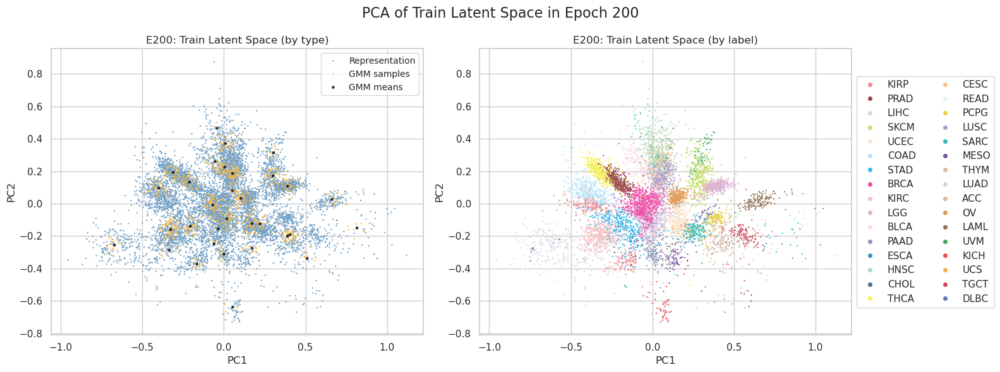

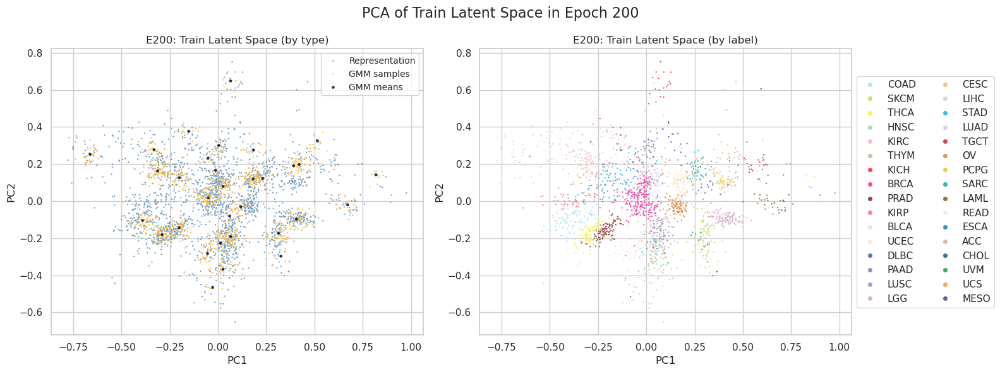

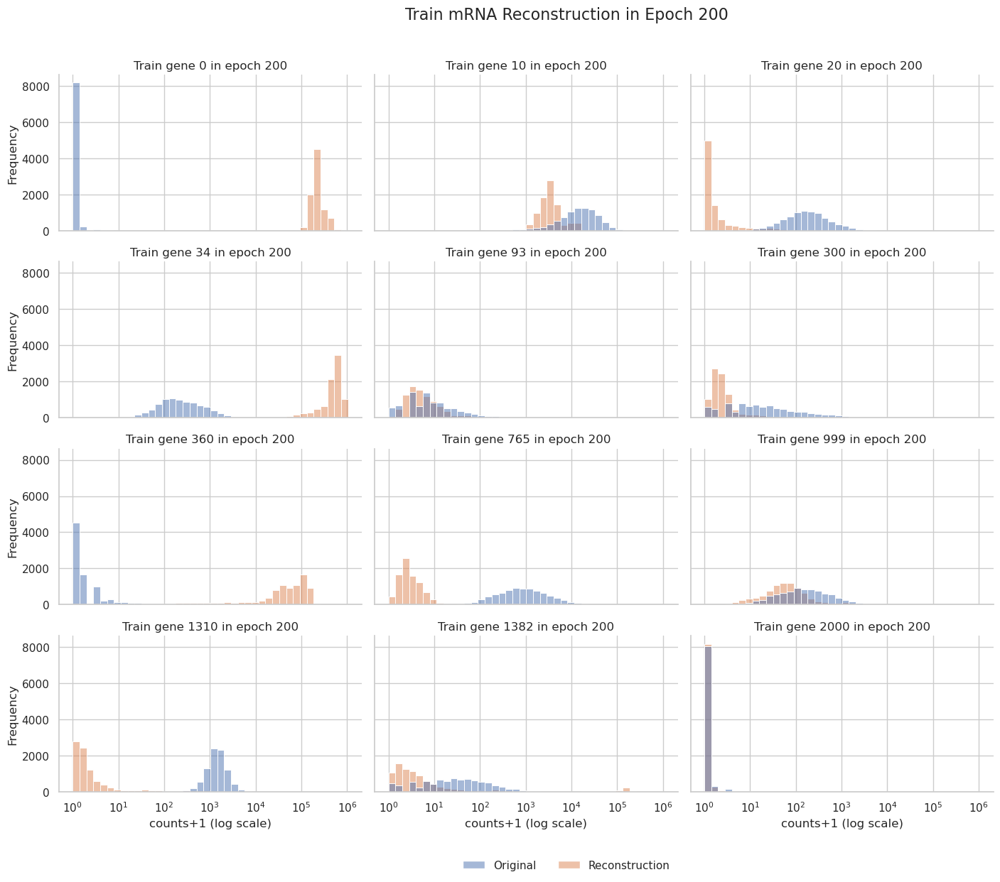

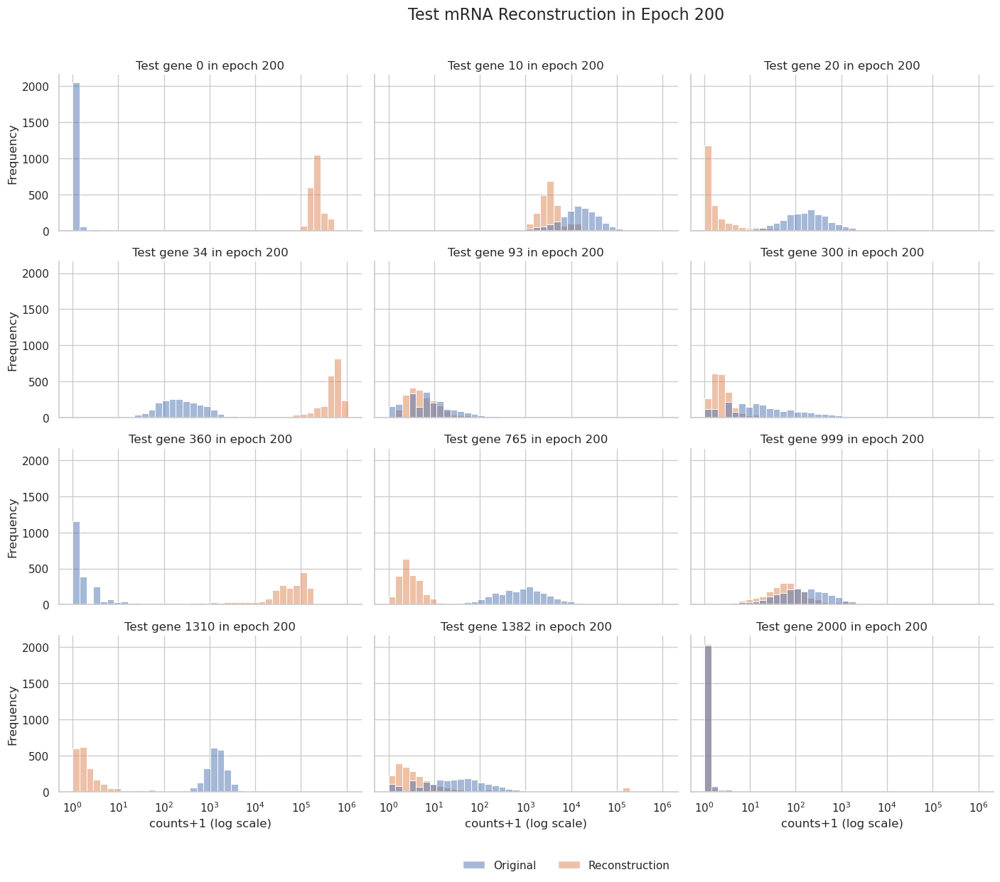

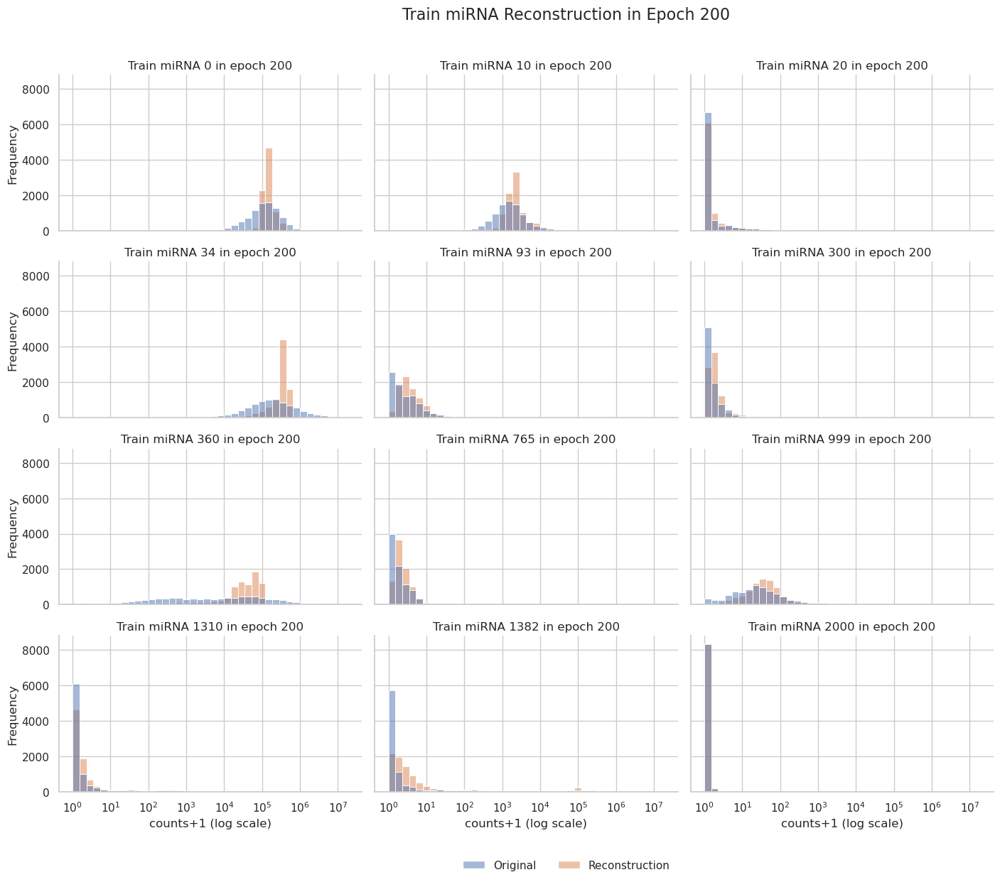

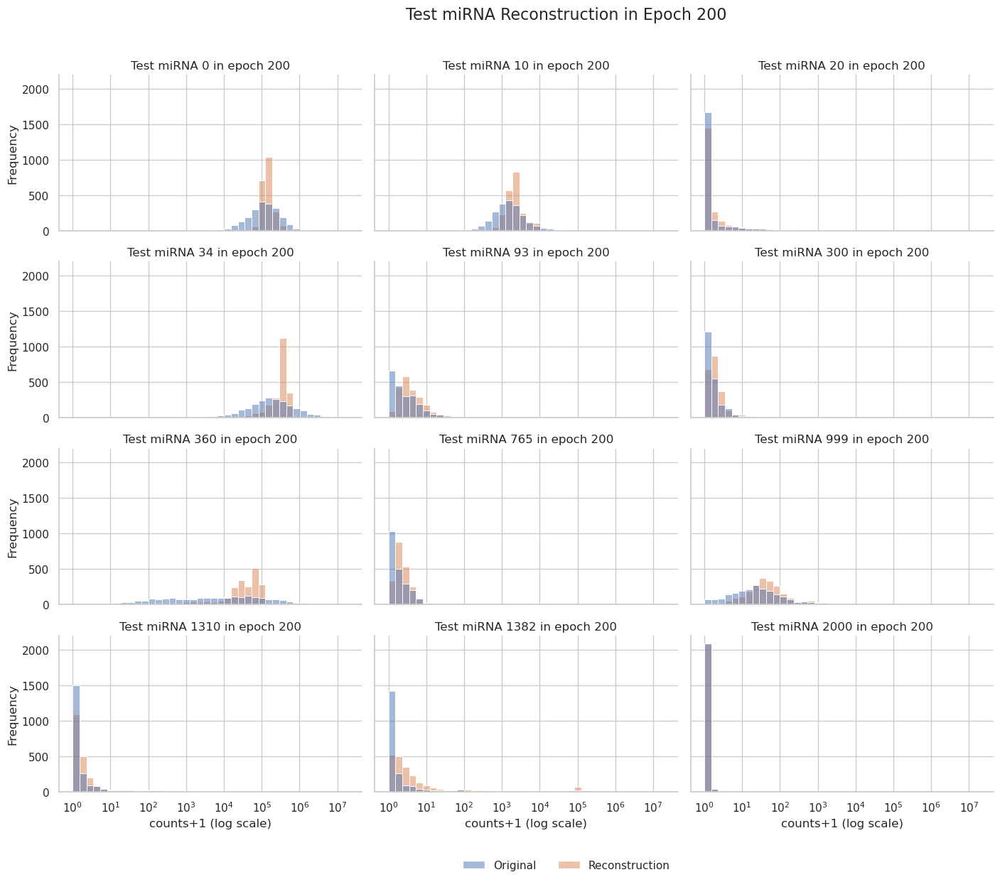

 53%|████████████████████████████████████████████▏                                       | 211/401 [15:16<13:35,  4.29s/it]

210 train_recon: 5.658471881682567 train_gmm: 2.220415475027902 train_mse: 98702.1015625 train_mae: 47.17621994018555 train_r2: 0.7954362630844116 train_spearman: 0.4629502296447754 train_pearson: 0.891880214214325 train_expl_var: 0.7954362630844116 train_msle: 0.156234011054039
210 test_recon: 5.570678218212887 test_gmm: 2.2173937251058855 test_mse: 1397190.5 test_mae: 199.62269592285156 test_r2: 0.7948794960975647 test_spearman: 0.47874465584754944 test_pearson: 0.8916715979576111 test_expl_var: 0.7948794960975647 test_msle: 0.4139861464500427


 55%|██████████████████████████████████████████████▎                                     | 221/401 [15:53<11:18,  3.77s/it]

220 train_recon: 5.655824363029047 train_gmm: 2.2202186916806936 train_mse: 96865.2265625 train_mae: 46.38651657104492 train_r2: 0.7992432117462158 train_spearman: 0.467220276594162 train_pearson: 0.8940061330795288 train_expl_var: 0.7992432117462158 train_msle: 0.13399313390254974
220 test_recon: 5.569387269690884 test_gmm: 2.2166786765337885 test_mse: 1377578.125 test_mae: 195.11753845214844 test_r2: 0.7977588176727295 test_spearman: 0.4809865951538086 test_pearson: 0.8933649063110352 test_expl_var: 0.7977587580680847 test_msle: 0.3629809319972992


 58%|████████████████████████████████████████████████▍                                   | 231/401 [16:31<10:42,  3.78s/it]

230 train_recon: 5.653247851677253 train_gmm: 2.220310979838673 train_mse: 98431.671875 train_mae: 47.227195739746094 train_r2: 0.7959967255592346 train_spearman: 0.4764798879623413 train_pearson: 0.8922073841094971 train_expl_var: 0.7959967255592346 train_msle: 0.16178826987743378
230 test_recon: 5.569323258672903 test_gmm: 2.2161659412169725 test_mse: 1417753.5 test_mae: 200.86097717285156 test_r2: 0.7918606996536255 test_spearman: 0.4902685880661011 test_pearson: 0.890002965927124 test_expl_var: 0.7918606400489807 test_msle: 0.41944730281829834


 60%|██████████████████████████████████████████████████▍                                 | 241/401 [17:08<09:58,  3.74s/it]

240 train_recon: 5.650999279222761 train_gmm: 2.2201771434632063 train_mse: 100987.578125 train_mae: 48.000553131103516 train_r2: 0.7906994819641113 train_spearman: 0.47964879870414734 train_pearson: 0.8892318606376648 train_expl_var: 0.7906994819641113 train_msle: 0.15032705664634705
240 test_recon: 5.5689947284399945 test_gmm: 2.2150684142380617 test_mse: 1433729.375 test_mae: 202.5548095703125 test_r2: 0.7895152568817139 test_spearman: 0.48755183815956116 test_pearson: 0.8886666297912598 test_expl_var: 0.7895152568817139 test_msle: 0.38787683844566345


 63%|████████████████████████████████████████████████████▌                               | 251/401 [17:45<09:15,  3.71s/it]

250 train_recon: 5.648731965822751 train_gmm: 2.2199984955620153 train_mse: 97029.6875 train_mae: 46.821144104003906 train_r2: 0.7989023923873901 train_spearman: 0.47532016038894653 train_pearson: 0.8938311338424683 train_expl_var: 0.7989023923873901 train_msle: 0.18165181577205658
250 test_recon: 5.567253344491465 test_gmm: 2.214678240715341 test_mse: 1369196.125 test_mae: 196.98153686523438 test_r2: 0.7989893555641174 test_spearman: 0.48278987407684326 test_pearson: 0.8939325213432312 test_expl_var: 0.7989892959594727 test_msle: 0.5157942771911621


 65%|██████████████████████████████████████████████████████▋                             | 261/401 [18:23<08:33,  3.67s/it]

260 train_recon: 5.646921369818025 train_gmm: 2.219911597651676 train_mse: 98343.71875 train_mae: 47.171512603759766 train_r2: 0.7961789965629578 train_spearman: 0.471872478723526 train_pearson: 0.8922991156578064 train_expl_var: 0.7961789965629578 train_msle: 0.13745950162410736
260 test_recon: 5.567773507709453 test_gmm: 2.214720876743731 test_mse: 1400033.75 test_mae: 200.27833557128906 test_r2: 0.7944620847702026 test_spearman: 0.4810515344142914 test_pearson: 0.8914130330085754 test_expl_var: 0.7944620847702026 test_msle: 0.3819524049758911


 68%|████████████████████████████████████████████████████████▊                           | 271/401 [19:00<08:00,  3.70s/it]

270 train_recon: 5.6450900065705225 train_gmm: 2.219917576809957 train_mse: 98122.953125 train_mae: 46.96699905395508 train_r2: 0.7966365218162537 train_spearman: 0.48034951090812683 train_pearson: 0.8925576210021973 train_expl_var: 0.7966365218162537 train_msle: 0.14231285452842712
270 test_recon: 5.567008186503849 test_gmm: 2.2142398277025546 test_mse: 1397829.125 test_mae: 200.11227416992188 test_r2: 0.794785737991333 test_spearman: 0.4870828092098236 test_pearson: 0.8916084170341492 test_expl_var: 0.794785737991333 test_msle: 0.3889884948730469


 70%|██████████████████████████████████████████████████████████▊                         | 281/401 [19:37<07:31,  3.76s/it]

280 train_recon: 5.643282482269175 train_gmm: 2.219836219233707 train_mse: 98335.625 train_mae: 47.19792175292969 train_r2: 0.7961957454681396 train_spearman: 0.4860861599445343 train_pearson: 0.892315685749054 train_expl_var: 0.7961957454681396 train_msle: 0.14528146386146545
280 test_recon: 5.565485329643266 test_gmm: 2.213993418261353 test_mse: 1383542.625 test_mae: 199.5633087158203 test_r2: 0.7968831062316895 test_spearman: 0.4887414276599884 test_pearson: 0.8927440643310547 test_expl_var: 0.7968831062316895 test_msle: 0.39461496472358704


 73%|████████████████████████████████████████████████████████████▉                       | 291/401 [20:15<06:55,  3.78s/it]

290 train_recon: 5.641938367805579 train_gmm: 2.219790622255562 train_mse: 98451.34375 train_mae: 47.05675506591797 train_r2: 0.7959559559822083 train_spearman: 0.4770358204841614 train_pearson: 0.8921756148338318 train_expl_var: 0.7959559559822083 train_msle: 0.1490248143672943
290 test_recon: 5.5649081987249005 test_gmm: 2.213570264037629 test_mse: 1391516.5 test_mae: 199.02256774902344 test_r2: 0.7957124710083008 test_spearman: 0.4804941415786743 test_pearson: 0.8921290636062622 test_expl_var: 0.7957124710083008 test_msle: 0.42803898453712463


 75%|███████████████████████████████████████████████████████████████                     | 301/401 [20:52<06:17,  3.77s/it]

300 train_recon: 5.640516440367402 train_gmm: 2.2197014709043836 train_mse: 97373.8828125 train_mae: 46.99188232421875 train_r2: 0.7981889843940735 train_spearman: 0.47901496291160583 train_pearson: 0.8934403657913208 train_expl_var: 0.7981890439987183 train_msle: 0.1366342455148697
300 test_recon: 5.564121968657173 test_gmm: 2.213415447335118 test_mse: 1374928.125 test_mae: 200.0352783203125 test_r2: 0.7981478571891785 test_spearman: 0.4798095226287842 test_pearson: 0.8934271335601807 test_expl_var: 0.7981477975845337 test_msle: 0.37206289172172546


 78%|█████████████████████████████████████████████████████████████████▏                  | 311/401 [21:30<05:36,  3.74s/it]

310 train_recon: 5.6390100970431805 train_gmm: 2.2196878259020054 train_mse: 98201.2421875 train_mae: 47.263450622558594 train_r2: 0.796474277973175 train_spearman: 0.47040078043937683 train_pearson: 0.8924756646156311 train_expl_var: 0.796474277973175 train_msle: 0.15821541845798492
310 test_recon: 5.563671012088312 test_gmm: 2.2125826260570283 test_mse: 1390741.875 test_mae: 200.0982666015625 test_r2: 0.795826256275177 test_spearman: 0.46990954875946045 test_pearson: 0.8921505212783813 test_expl_var: 0.7958261966705322 test_msle: 0.4455487132072449


 80%|███████████████████████████████████████████████████████████████████▏                | 321/401 [22:06<04:49,  3.62s/it]

320 train_recon: 5.637611796573343 train_gmm: 2.219790362820413 train_mse: 97610.6171875 train_mae: 46.99593734741211 train_r2: 0.7976983785629272 train_spearman: 0.4712603688240051 train_pearson: 0.8931480646133423 train_expl_var: 0.7976983785629272 train_msle: 0.13135942816734314
320 test_recon: 5.563035850128645 test_gmm: 2.2134194877710236 test_mse: 1380396.625 test_mae: 199.89053344726562 test_r2: 0.7973450422286987 test_spearman: 0.46984538435935974 test_pearson: 0.8930166363716125 test_expl_var: 0.797344982624054 test_msle: 0.3633599281311035


 83%|█████████████████████████████████████████████████████████████████████▎              | 331/401 [22:43<04:14,  3.64s/it]

330 train_recon: 5.636654948462795 train_gmm: 2.219847630806773 train_mse: 98337.3359375 train_mae: 47.326385498046875 train_r2: 0.7961922287940979 train_spearman: 0.4759643077850342 train_pearson: 0.892314076423645 train_expl_var: 0.7961922287940979 train_msle: 0.13981084525585175
330 test_recon: 5.563324089215862 test_gmm: 2.2122229415379215 test_mse: 1407684.75 test_mae: 202.5978240966797 test_r2: 0.7933388352394104 test_spearman: 0.4734440743923187 test_pearson: 0.8907722234725952 test_expl_var: 0.7933388352394104 test_msle: 0.3852268159389496


 85%|███████████████████████████████████████████████████████████████████████▍            | 341/401 [23:20<03:38,  3.65s/it]

340 train_recon: 5.635566951915953 train_gmm: 2.220040687721842 train_mse: 99496.703125 train_mae: 47.53011703491211 train_r2: 0.7937893867492676 train_spearman: 0.4763520359992981 train_pearson: 0.8909638524055481 train_expl_var: 0.7937893867492676 train_msle: 0.1361362189054489
340 test_recon: 5.562452649744512 test_gmm: 2.212525134140186 test_mse: 1406596.75 test_mae: 201.72927856445312 test_r2: 0.7934985756874084 test_spearman: 0.47091493010520935 test_pearson: 0.89085453748703 test_expl_var: 0.7934985756874084 test_msle: 0.3798261880874634


 88%|█████████████████████████████████████████████████████████████████████████▌          | 351/401 [23:57<03:02,  3.66s/it]

350 train_recon: 5.63454442359835 train_gmm: 2.219985240069709 train_mse: 97940.953125 train_mae: 47.17367935180664 train_r2: 0.7970137596130371 train_spearman: 0.48026371002197266 train_pearson: 0.8927722573280334 train_expl_var: 0.7970137596130371 train_msle: 0.14250904321670532
350 test_recon: 5.562424544906929 test_gmm: 2.2121723017889017 test_mse: 1414346.0 test_mae: 203.051025390625 test_r2: 0.7923609018325806 test_spearman: 0.47648313641548157 test_pearson: 0.8902319073677063 test_expl_var: 0.7923609018325806 test_msle: 0.38475027680397034


 90%|███████████████████████████████████████████████████████████████████████████▌        | 361/401 [24:34<02:28,  3.71s/it]

360 train_recon: 5.633423767984935 train_gmm: 2.220056944943144 train_mse: 98608.0546875 train_mae: 47.43037796020508 train_r2: 0.7956311702728271 train_spearman: 0.48318541049957275 train_pearson: 0.8919973969459534 train_expl_var: 0.7956311702728271 train_msle: 0.14375416934490204
360 test_recon: 5.562663343905259 test_gmm: 2.2124394448955407 test_mse: 1388674.625 test_mae: 200.19383239746094 test_r2: 0.7961297035217285 test_spearman: 0.4820837080478668 test_pearson: 0.8923346400260925 test_expl_var: 0.7961297035217285 test_msle: 0.39350029826164246


 93%|█████████████████████████████████████████████████████████████████████████████▋      | 371/401 [25:10<01:50,  3.67s/it]

370 train_recon: 5.632299020278035 train_gmm: 2.220001447976892 train_mse: 96887.59375 train_mae: 46.91639709472656 train_r2: 0.7991968393325806 train_spearman: 0.4839598536491394 train_pearson: 0.8939909934997559 train_expl_var: 0.7991968393325806 train_msle: 0.15253493189811707
370 test_recon: 5.562712520790947 test_gmm: 2.21203968176681 test_mse: 1373725.75 test_mae: 197.9009552001953 test_r2: 0.7983243465423584 test_spearman: 0.4809993505477905 test_pearson: 0.8935966491699219 test_expl_var: 0.7983243465423584 test_msle: 0.40538012981414795


 95%|███████████████████████████████████████████████████████████████████████████████▊    | 381/401 [25:47<01:12,  3.62s/it]

380 train_recon: 5.631527692255189 train_gmm: 2.2201914481312666 train_mse: 97538.3359375 train_mae: 47.092491149902344 train_r2: 0.7978481650352478 train_spearman: 0.48332148790359497 train_pearson: 0.8932409286499023 train_expl_var: 0.7978481650352478 train_msle: 0.141013041138649
380 test_recon: 5.562210092204502 test_gmm: 2.212804564286707 test_mse: 1412136.0 test_mae: 201.7937774658203 test_r2: 0.7926853895187378 test_spearman: 0.48082131147384644 test_pearson: 0.8904227614402771 test_expl_var: 0.7926853895187378 test_msle: 0.35340920090675354


 98%|█████████████████████████████████████████████████████████████████████████████████▉  | 391/401 [26:24<00:37,  3.74s/it]

390 train_recon: 5.630627493570094 train_gmm: 2.220033226281195 train_mse: 97582.9453125 train_mae: 47.139225006103516 train_r2: 0.7977557182312012 train_spearman: 0.47802993655204773 train_pearson: 0.8931930065155029 train_expl_var: 0.7977557182312012 train_msle: 0.14347103238105774
390 test_recon: 5.561735220992986 test_gmm: 2.2120650930797563 test_mse: 1393133.125 test_mae: 200.6809539794922 test_r2: 0.79547518491745 test_spearman: 0.47642165422439575 test_pearson: 0.891960859298706 test_expl_var: 0.7954751253128052 test_msle: 0.3779335618019104


100%|███████████████████████████████████████████████████████████████████████████████████▊| 400/401 [26:57<00:03,  3.63s/it]

400 train_recon: 5.629928510547489 train_gmm: 2.2203023269974933 train_mse: 99600.703125 train_mae: 47.82422637939453 train_r2: 0.7935738563537598 train_spearman: 0.4835488200187683 train_pearson: 0.8908473253250122 train_expl_var: 0.7935738563537598 train_msle: 0.15660403668880463
400 test_recon: 5.561273373075753 test_gmm: 2.2123565388083013 test_mse: 1416639.625 test_mae: 202.7753448486328 test_r2: 0.7920241951942444 test_spearman: 0.48160630464553833 test_pearson: 0.8900089859962463 test_expl_var: 0.7920241951942444 test_msle: 0.4354005753993988


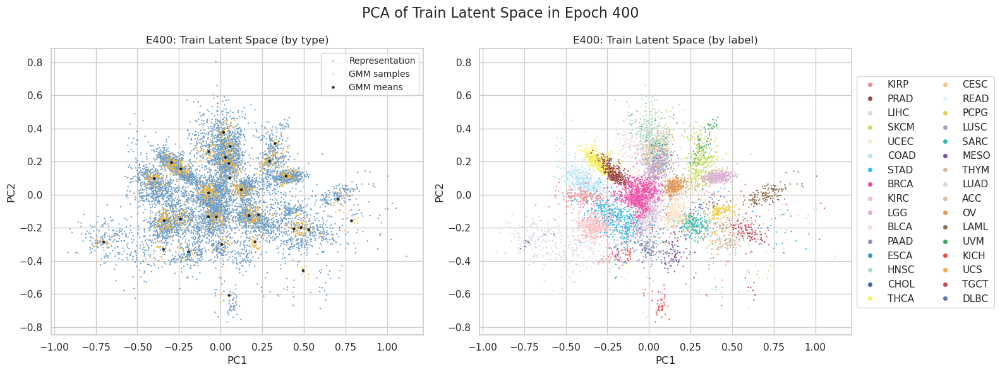

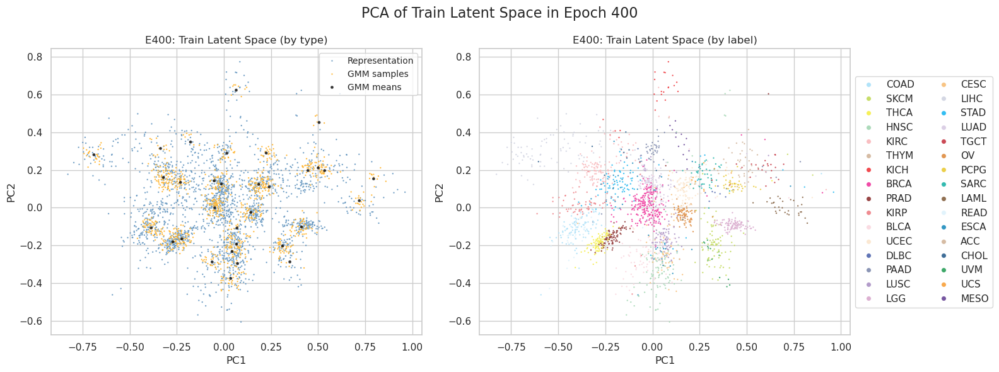

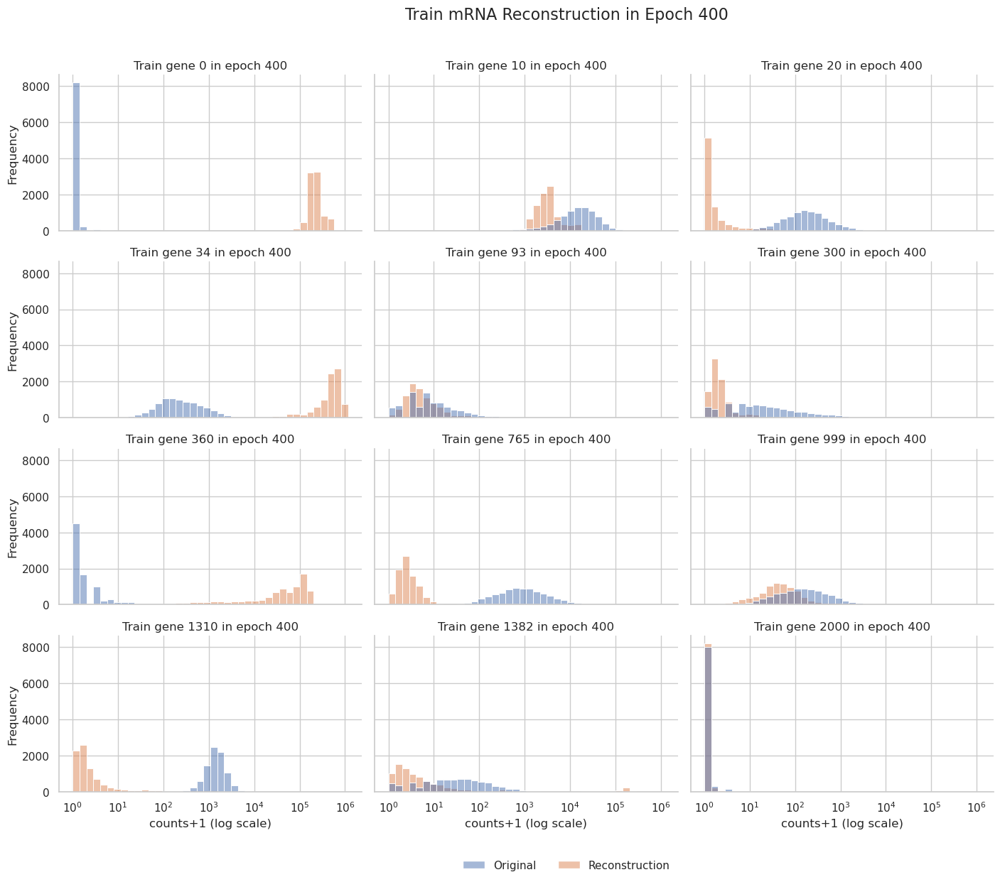

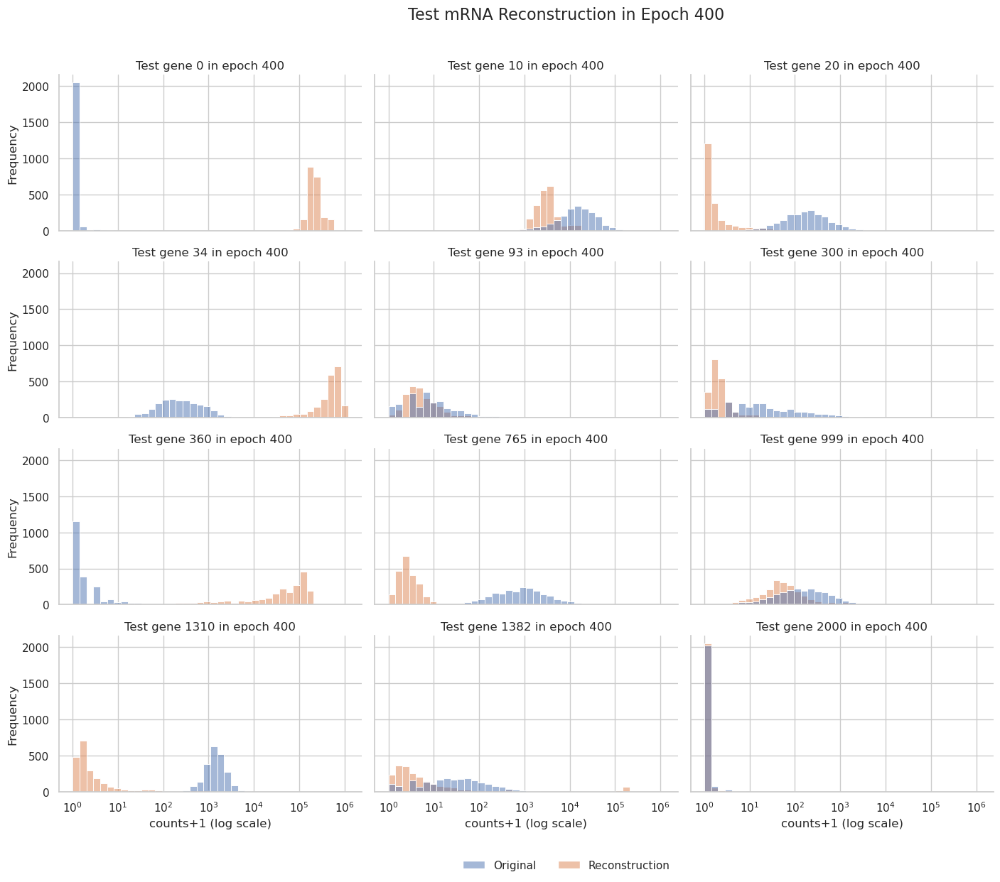

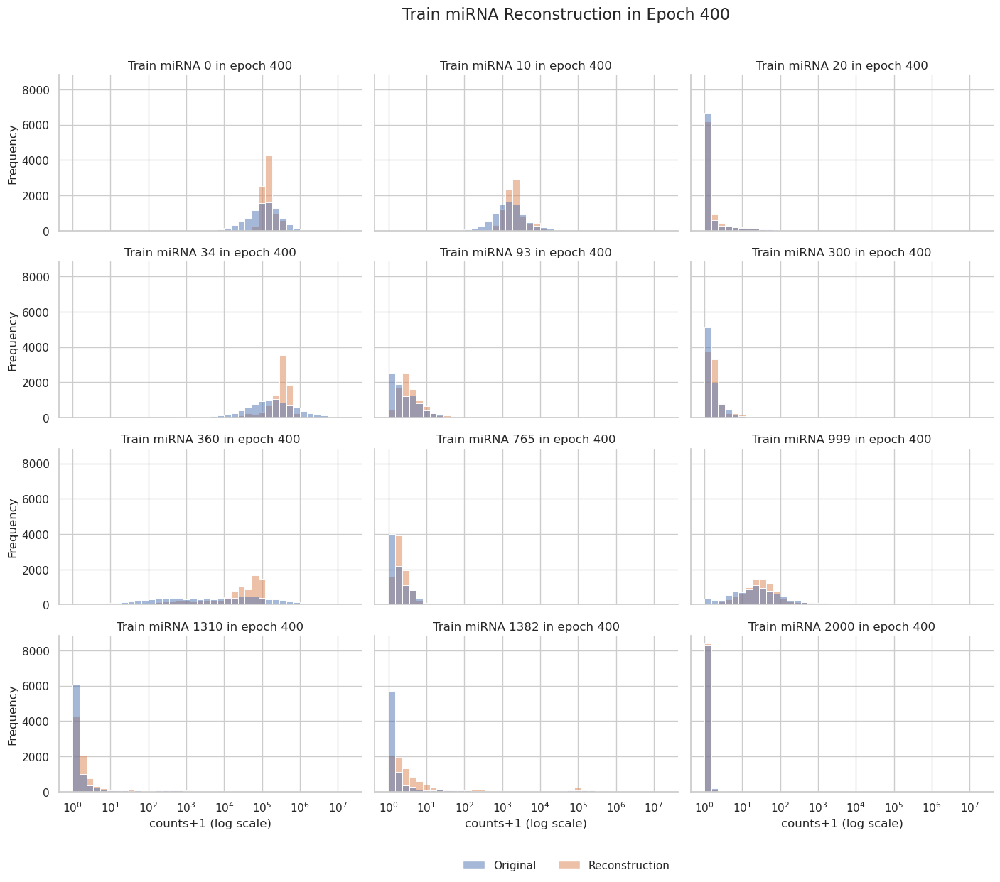

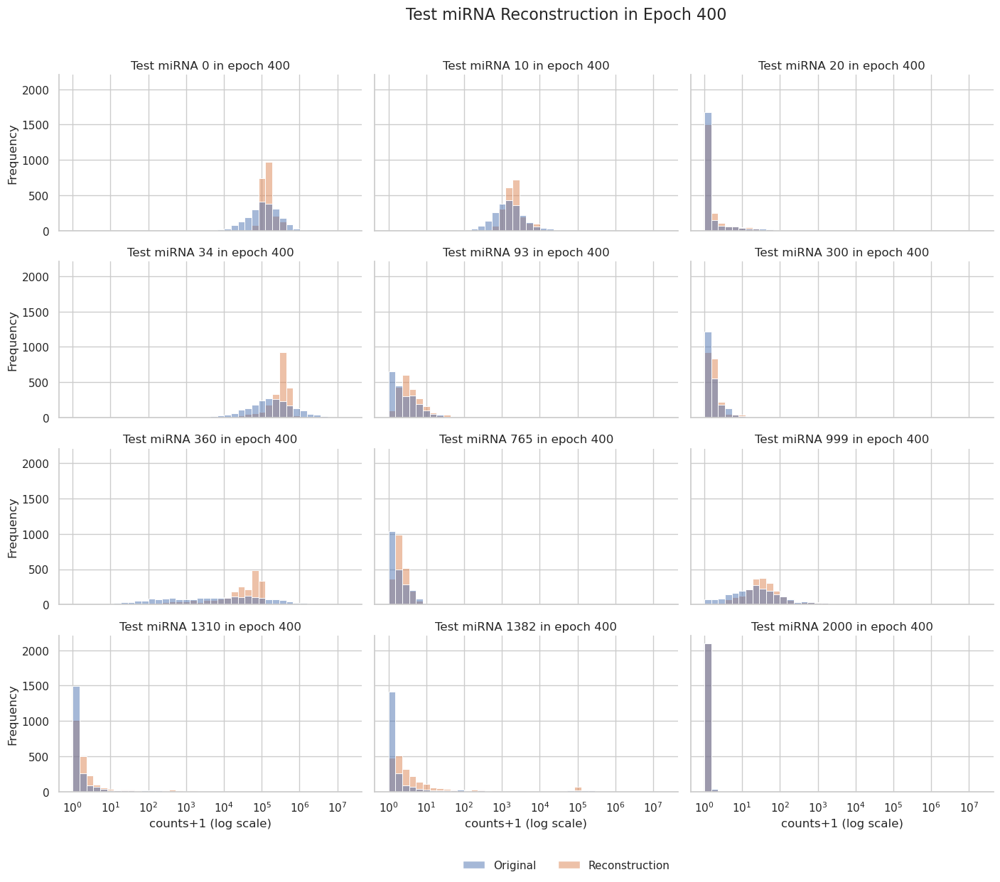

100%|████████████████████████████████████████████████████████████████████████████████████| 401/401 [28:10<00:00,  4.22s/it]


Fold 1 done...
Fold: 2...


  0%|                                                                                              | 0/401 [00:00<?, ?it/s]

0 train_recon: 7.4179580817951525 train_gmm: 6.407166739328588 train_mse: 473265.28125 train_mae: 223.3100128173828 train_r2: -0.0031747817993164062 train_spearman: 0.09326069056987762 train_pearson: 0.04340316727757454 train_expl_var: -0.0031747817993164062 train_msle: 19.971839904785156
0 test_recon: 6.974848034288899 test_gmm: 3.066637992054852 test_mse: 7414276.5 test_mae: 886.5349731445312 test_r2: 0.0007324814796447754 test_spearman: 0.07284604758024216 test_pearson: 0.05904886871576309 test_expl_var: 0.000732421875 test_msle: 32.65869140625


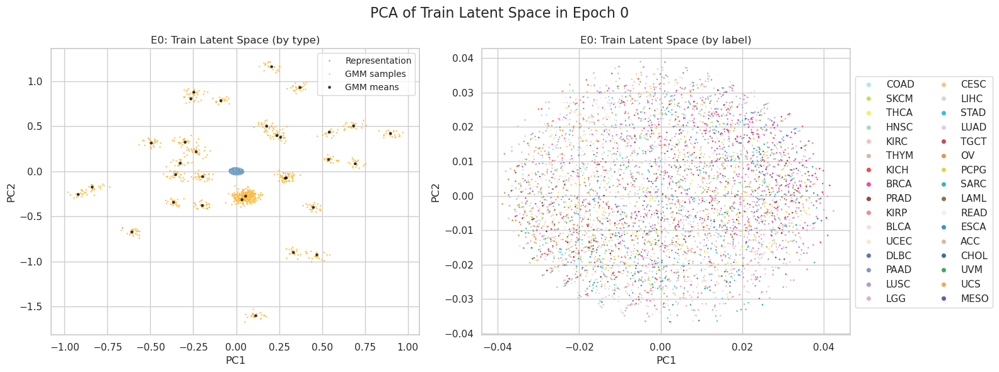

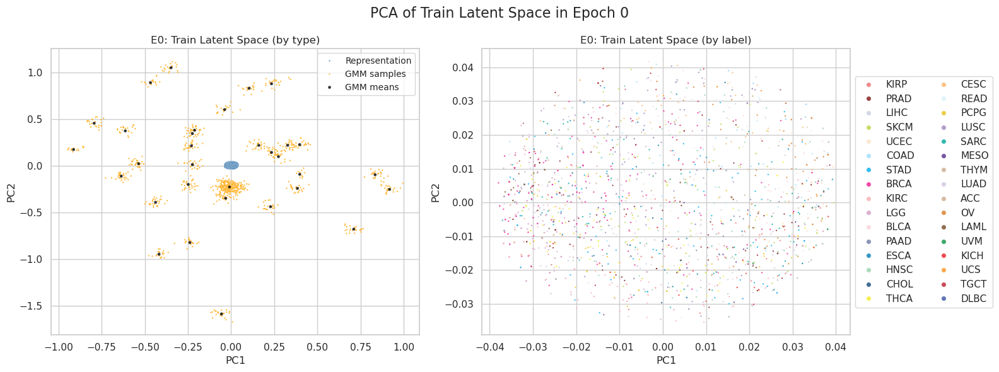

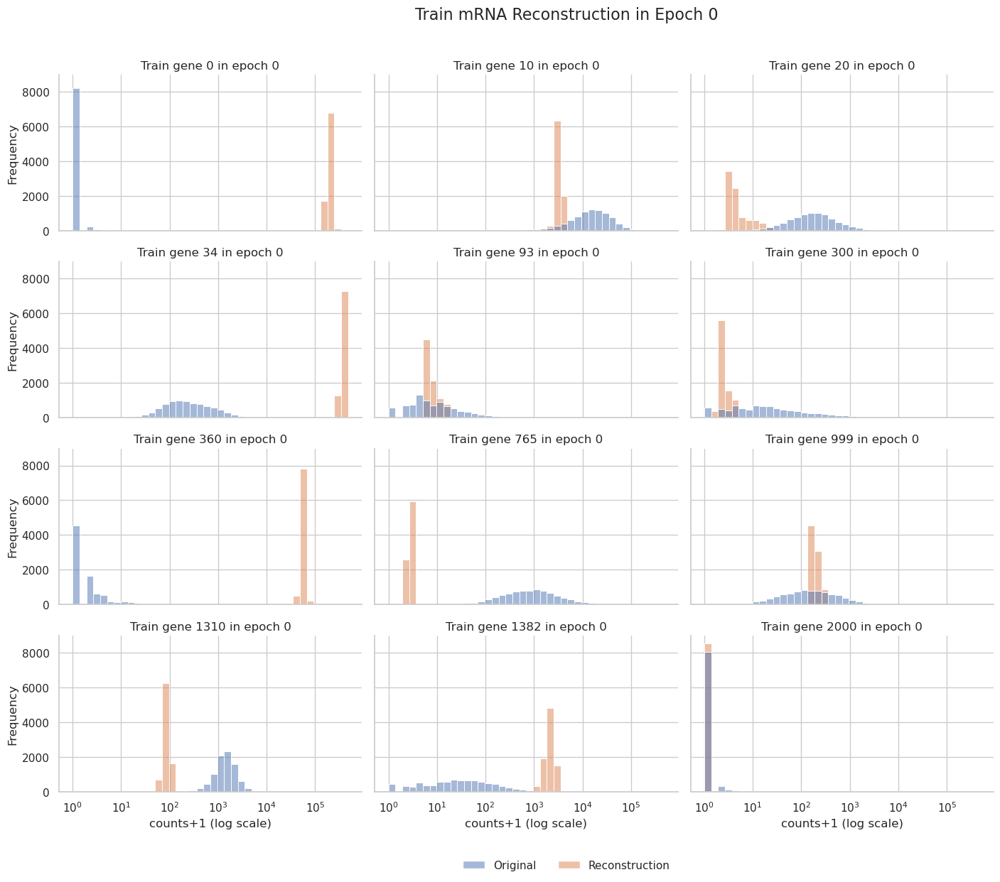

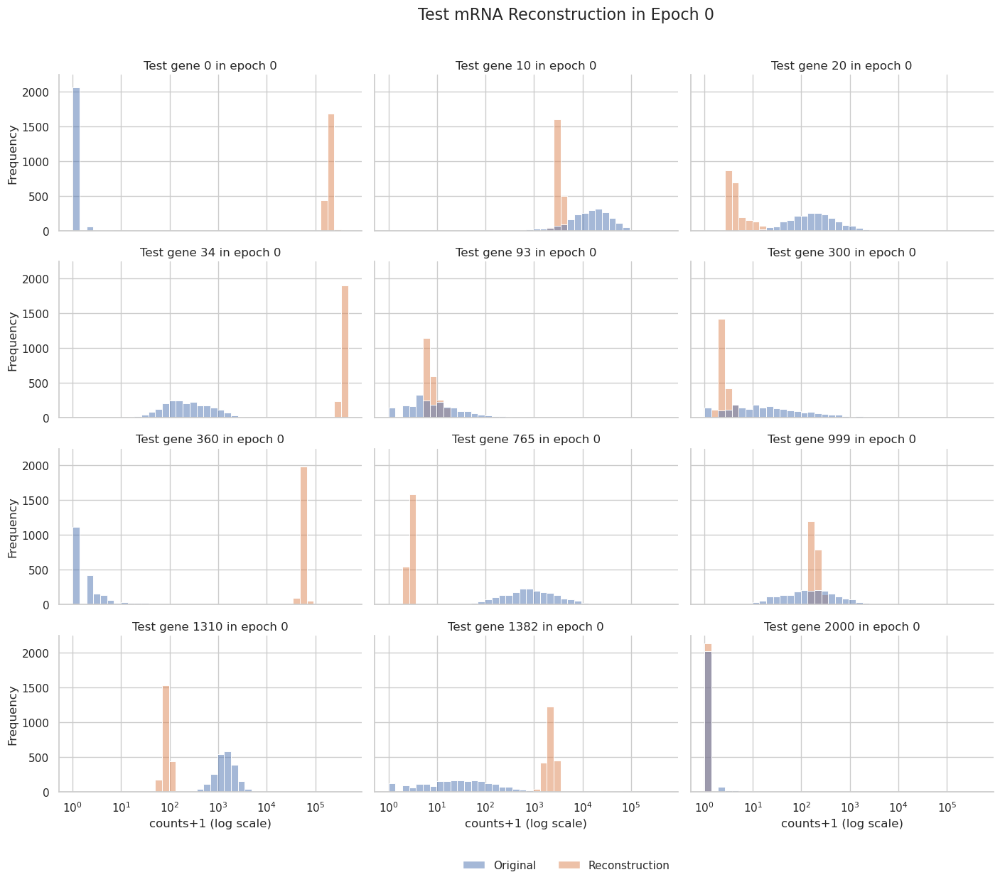

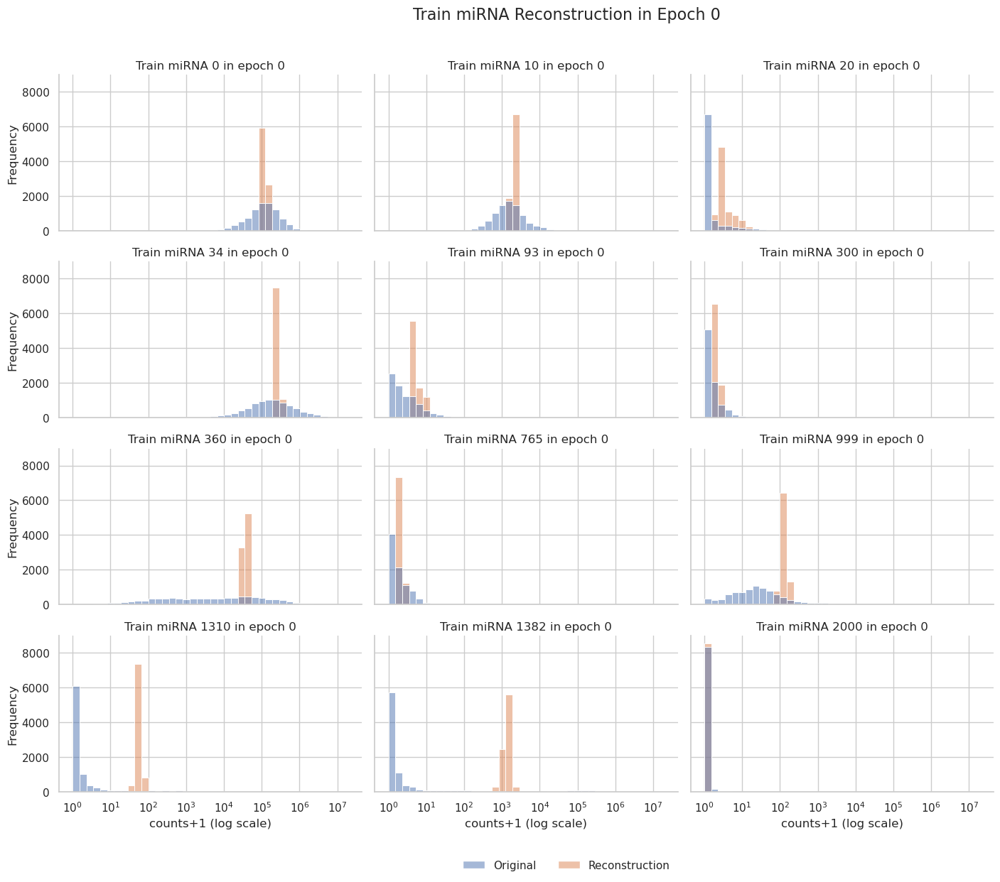

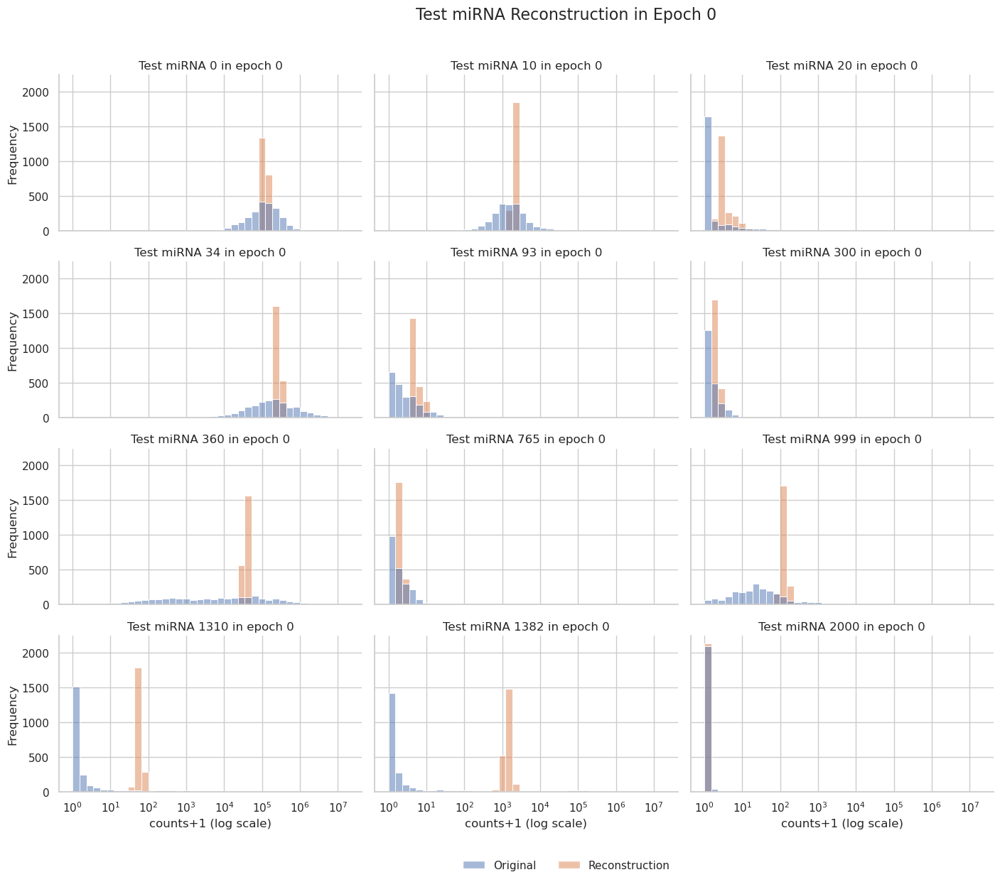

  3%|██▎                                                                                  | 11/401 [01:47<27:47,  4.28s/it]

10 train_recon: 5.888762441153817 train_gmm: 2.1688555041376705 train_mse: 146637.484375 train_mae: 90.95722198486328 train_r2: 0.6891742944717407 train_spearman: 0.25901463627815247 train_pearson: 0.8716943860054016 train_expl_var: 0.6891742944717407 train_msle: 7.521025657653809
10 test_recon: 5.721900547276688 test_gmm: 2.168736989648895 test_mse: 2443290.25 test_mae: 368.1827087402344 test_r2: 0.6707027554512024 test_spearman: 0.28775548934936523 test_pearson: 0.8545124530792236 test_expl_var: 0.6707028150558472 test_msle: 13.141645431518555


  5%|████▍                                                                                | 21/401 [02:24<23:52,  3.77s/it]

20 train_recon: 5.785268072937149 train_gmm: 2.1763668987960645 train_mse: 96507.265625 train_mae: 56.29526138305664 train_r2: 0.7954347133636475 train_spearman: 0.4023851752281189 train_pearson: 0.895658552646637 train_expl_var: 0.7954347133636475 train_msle: 2.9816770553588867
20 test_recon: 5.6359179845454745 test_gmm: 2.175428423915032 test_mse: 1747516.625 test_mae: 247.56594848632812 test_r2: 0.764476478099823 test_spearman: 0.4248497486114502 test_pearson: 0.8787789940834045 test_expl_var: 0.764476478099823 test_msle: 6.2677836418151855


  8%|██████▌                                                                              | 31/401 [03:01<22:20,  3.62s/it]

30 train_recon: 5.744454619768066 train_gmm: 2.1789651527489644 train_mse: 91262.953125 train_mae: 50.17694091796875 train_r2: 0.8065509796142578 train_spearman: 0.4369691014289856 train_pearson: 0.8989288806915283 train_expl_var: 0.8065509796142578 train_msle: 1.7884501218795776
30 test_recon: 5.604110636936194 test_gmm: 2.178807258695294 test_mse: 1520619.625 test_mae: 217.04539489746094 test_r2: 0.7950567603111267 test_spearman: 0.45943355560302734 test_pearson: 0.8937559723854065 test_expl_var: 0.7950567603111267 test_msle: 4.111893177032471


 10%|████████▋                                                                            | 41/401 [03:37<21:44,  3.62s/it]

40 train_recon: 5.721577530979181 train_gmm: 2.180455809775092 train_mse: 88352.171875 train_mae: 48.286312103271484 train_r2: 0.8127209544181824 train_spearman: 0.45254239439964294 train_pearson: 0.9020124077796936 train_expl_var: 0.8127209544181824 train_msle: 1.500998616218567
40 test_recon: 5.588369059012306 test_gmm: 2.178857760641558 test_mse: 1491023.75 test_mae: 212.27757263183594 test_r2: 0.7990455627441406 test_spearman: 0.4736754298210144 test_pearson: 0.8955463767051697 test_expl_var: 0.7990455627441406 test_msle: 3.6059932708740234


 13%|██████████▊                                                                          | 51/401 [04:15<21:57,  3.76s/it]

50 train_recon: 5.706179703945528 train_gmm: 2.1816898683155608 train_mse: 86801.546875 train_mae: 47.03350830078125 train_r2: 0.8160077929496765 train_spearman: 0.45188865065574646 train_pearson: 0.903718888759613 train_expl_var: 0.8160077929496765 train_msle: 1.2548102140426636
50 test_recon: 5.578644764995864 test_gmm: 2.180513218470982 test_mse: 1464221.5 test_mae: 205.89024353027344 test_r2: 0.8026578426361084 test_spearman: 0.47381362318992615 test_pearson: 0.8971768617630005 test_expl_var: 0.8026578426361084 test_msle: 3.094233274459839


 15%|████████████▉                                                                        | 61/401 [04:52<20:38,  3.64s/it]

60 train_recon: 5.695165741556343 train_gmm: 2.182628611314633 train_mse: 86980.7890625 train_mae: 46.42685317993164 train_r2: 0.8156278729438782 train_spearman: 0.4545997083187103 train_pearson: 0.9034162759780884 train_expl_var: 0.8156278133392334 train_msle: 1.0141521692276
60 test_recon: 5.5716114411352615 test_gmm: 2.1810270630168693 test_mse: 1448326.625 test_mae: 202.01516723632812 test_r2: 0.8048001527786255 test_spearman: 0.47384607791900635 test_pearson: 0.8980228900909424 test_expl_var: 0.8048001527786255 test_msle: 2.5761630535125732


 18%|███████████████                                                                      | 71/401 [05:28<20:43,  3.77s/it]

70 train_recon: 5.686310957510749 train_gmm: 2.1832223223824787 train_mse: 85878.28125 train_mae: 46.0972785949707 train_r2: 0.8179647922515869 train_spearman: 0.45910751819610596 train_pearson: 0.9047406911849976 train_expl_var: 0.8179647922515869 train_msle: 0.9054046869277954
70 test_recon: 5.5669066711972865 test_gmm: 2.1808960647046987 test_mse: 1452886.625 test_mae: 201.18601989746094 test_r2: 0.8041855096817017 test_spearman: 0.4726441204547882 test_pearson: 0.8977817893028259 test_expl_var: 0.8041855692863464 test_msle: 2.342132091522217


 20%|█████████████████▏                                                                   | 81/401 [06:05<19:32,  3.66s/it]

80 train_recon: 5.679527068777889 train_gmm: 2.1834876906074836 train_mse: 84775.203125 train_mae: 46.081722259521484 train_r2: 0.8203030228614807 train_spearman: 0.45521095395088196 train_pearson: 0.9062082767486572 train_expl_var: 0.8203030228614807 train_msle: 0.87932950258255
80 test_recon: 5.5633605641000905 test_gmm: 2.181444674989937 test_mse: 1463611.75 test_mae: 201.77236938476562 test_r2: 0.8027400374412537 test_spearman: 0.4711452126502991 test_pearson: 0.8970000743865967 test_expl_var: 0.8027400374412537 test_msle: 2.2489748001098633


 23%|███████████████████▎                                                                 | 91/401 [06:43<19:22,  3.75s/it]

90 train_recon: 5.673870376361224 train_gmm: 2.1838146914057925 train_mse: 85395.8515625 train_mae: 46.31132888793945 train_r2: 0.8189874291419983 train_spearman: 0.4548647701740265 train_pearson: 0.9054903984069824 train_expl_var: 0.8189874291419983 train_msle: 0.8192443251609802
90 test_recon: 5.56202371876395 test_gmm: 2.1816614341289156 test_mse: 1486442.75 test_mae: 202.59083557128906 test_r2: 0.7996630072593689 test_spearman: 0.46617650985717773 test_pearson: 0.8951500654220581 test_expl_var: 0.7996630072593689 test_msle: 2.1001617908477783


 25%|█████████████████████▏                                                              | 101/401 [07:19<18:30,  3.70s/it]

100 train_recon: 5.668883602860136 train_gmm: 2.184214610671595 train_mse: 84920.125 train_mae: 46.29298400878906 train_r2: 0.8199958205223083 train_spearman: 0.4583950936794281 train_pearson: 0.9061136841773987 train_expl_var: 0.8199958205223083 train_msle: 0.8148093819618225
100 test_recon: 5.558996691355455 test_gmm: 2.1816604635698735 test_mse: 1480347.625 test_mae: 203.578369140625 test_r2: 0.8004844784736633 test_spearman: 0.464923620223999 test_pearson: 0.8957871198654175 test_expl_var: 0.8004844784736633 test_msle: 2.177612543106079


 28%|███████████████████████▎                                                            | 111/401 [07:57<18:02,  3.73s/it]

110 train_recon: 5.664886455015512 train_gmm: 2.1846572238183835 train_mse: 83681.6640625 train_mae: 45.0796012878418 train_r2: 0.8226209878921509 train_spearman: 0.46012964844703674 train_pearson: 0.9073006510734558 train_expl_var: 0.8226209878921509 train_msle: 0.6057999134063721
110 test_recon: 5.557464278709801 test_gmm: 2.1817930799569125 test_mse: 1423880.125 test_mae: 193.8341522216797 test_r2: 0.8080949187278748 test_spearman: 0.4630758464336395 test_pearson: 0.8994624614715576 test_expl_var: 0.8080949187278748 test_msle: 1.605542778968811


 30%|█████████████████████████▎                                                          | 121/401 [08:34<17:40,  3.79s/it]

120 train_recon: 5.661170738623388 train_gmm: 2.18462637251566 train_mse: 83069.8203125 train_mae: 44.779598236083984 train_r2: 0.8239178657531738 train_spearman: 0.4558849632740021 train_pearson: 0.9080416560173035 train_expl_var: 0.8239178657531738 train_msle: 0.5580364465713501
120 test_recon: 5.5558605572536015 test_gmm: 2.181315902245408 test_mse: 1432506.375 test_mae: 193.69400024414062 test_r2: 0.8069323301315308 test_spearman: 0.46153920888900757 test_pearson: 0.8987637758255005 test_expl_var: 0.8069323301315308 test_msle: 1.3894678354263306


 33%|███████████████████████████▍                                                        | 131/401 [09:10<16:28,  3.66s/it]

130 train_recon: 5.658047553289907 train_gmm: 2.1846798206182405 train_mse: 84039.65625 train_mae: 45.54817581176758 train_r2: 0.8218621015548706 train_spearman: 0.45794564485549927 train_pearson: 0.907080888748169 train_expl_var: 0.8218621015548706 train_msle: 0.6438049674034119
130 test_recon: 5.5563487803454805 test_gmm: 2.181406014149865 test_mse: 1487671.0 test_mae: 199.11489868164062 test_r2: 0.7994974255561829 test_spearman: 0.46210551261901855 test_pearson: 0.8947989344596863 test_expl_var: 0.7994974255561829 test_msle: 1.6713999509811401


 35%|█████████████████████████████▌                                                      | 141/401 [09:48<16:28,  3.80s/it]

140 train_recon: 5.655398531823445 train_gmm: 2.1849044765860537 train_mse: 83916.265625 train_mae: 45.55240249633789 train_r2: 0.822123646736145 train_spearman: 0.46048951148986816 train_pearson: 0.907256007194519 train_expl_var: 0.822123646736145 train_msle: 0.6175855398178101
140 test_recon: 5.554394539746394 test_gmm: 2.1813299460489244 test_mse: 1472461.75 test_mae: 198.01087951660156 test_r2: 0.8015472888946533 test_spearman: 0.4623355567455292 test_pearson: 0.8959416747093201 test_expl_var: 0.8015472888946533 test_msle: 1.5453011989593506


 38%|███████████████████████████████▋                                                    | 151/401 [10:25<15:23,  3.69s/it]

150 train_recon: 5.653032181931985 train_gmm: 2.1848880404709177 train_mse: 83729.765625 train_mae: 45.72604751586914 train_r2: 0.8225190043449402 train_spearman: 0.45905864238739014 train_pearson: 0.9075706601142883 train_expl_var: 0.8225190043449402 train_msle: 0.6532917022705078
150 test_recon: 5.5519137831188345 test_gmm: 2.181781114493377 test_mse: 1531683.875 test_mae: 201.90174865722656 test_r2: 0.793565571308136 test_spearman: 0.46195554733276367 test_pearson: 0.8914596438407898 test_expl_var: 0.793565571308136 test_msle: 1.6143743991851807


 40%|█████████████████████████████████▋                                                  | 161/401 [11:02<14:41,  3.67s/it]

160 train_recon: 5.650701232140432 train_gmm: 2.185102869785721 train_mse: 85576.7578125 train_mae: 46.382850646972656 train_r2: 0.8186039924621582 train_spearman: 0.45830774307250977 train_pearson: 0.9054012894630432 train_expl_var: 0.8186039924621582 train_msle: 0.6678701639175415
160 test_recon: 5.554053589887758 test_gmm: 2.1813235695189 test_mse: 1523328.25 test_mae: 202.51361083984375 test_r2: 0.7946916818618774 test_spearman: 0.46057364344596863 test_pearson: 0.8921844363212585 test_expl_var: 0.7946916818618774 test_msle: 1.6880565881729126


 43%|███████████████████████████████████▊                                                | 171/401 [11:39<13:54,  3.63s/it]

170 train_recon: 5.648688346124921 train_gmm: 2.185662473770819 train_mse: 82538.0546875 train_mae: 44.70935821533203 train_r2: 0.8250450491905212 train_spearman: 0.46461549401283264 train_pearson: 0.9087302088737488 train_expl_var: 0.8250450491905212 train_msle: 0.5346906781196594
170 test_recon: 5.552601223225227 test_gmm: 2.1817455197050646 test_mse: 1475734.125 test_mae: 195.5384521484375 test_r2: 0.8011062741279602 test_spearman: 0.4671722948551178 test_pearson: 0.8954586982727051 test_expl_var: 0.8011062741279602 test_msle: 1.4088990688323975


 45%|█████████████████████████████████████▉                                              | 181/401 [12:16<13:31,  3.69s/it]

180 train_recon: 5.646980842250551 train_gmm: 2.1856068532425854 train_mse: 83819.0 train_mae: 45.57592010498047 train_r2: 0.8223298788070679 train_spearman: 0.45863503217697144 train_pearson: 0.9073739051818848 train_expl_var: 0.8223298788070679 train_msle: 0.6060594320297241
180 test_recon: 5.551676410097496 test_gmm: 2.181861505084071 test_mse: 1479926.75 test_mae: 197.50189208984375 test_r2: 0.8005411624908447 test_spearman: 0.45703014731407166 test_pearson: 0.8953009247779846 test_expl_var: 0.8005411624908447 test_msle: 1.5645347833633423


 48%|████████████████████████████████████████                                            | 191/401 [12:53<13:07,  3.75s/it]

190 train_recon: 5.645147579159231 train_gmm: 2.185937452835496 train_mse: 85637.40625 train_mae: 46.54048156738281 train_r2: 0.8184754252433777 train_spearman: 0.465874582529068 train_pearson: 0.9053336381912231 train_expl_var: 0.8184753656387329 train_msle: 0.6394322514533997
190 test_recon: 5.550924770995494 test_gmm: 2.181770847150816 test_mse: 1524808.375 test_mae: 201.04847717285156 test_r2: 0.794492244720459 test_spearman: 0.4626553952693939 test_pearson: 0.891958475112915 test_expl_var: 0.794492244720459 test_msle: 1.6086065769195557


 50%|█████████████████████████████████████████▉                                          | 200/401 [13:26<12:30,  3.74s/it]

200 train_recon: 5.643585335494 train_gmm: 2.1859418641458754 train_mse: 83864.328125 train_mae: 45.02729415893555 train_r2: 0.8222337961196899 train_spearman: 0.461874783039093 train_pearson: 0.907088577747345 train_expl_var: 0.8222337961196899 train_msle: 0.46989309787750244
200 test_recon: 5.550461010933526 test_gmm: 2.1821784948130123 test_mse: 1459810.25 test_mae: 193.5348358154297 test_r2: 0.8032523989677429 test_spearman: 0.4602101147174835 test_pearson: 0.8966012597084045 test_expl_var: 0.8032523989677429 test_msle: 1.249841570854187


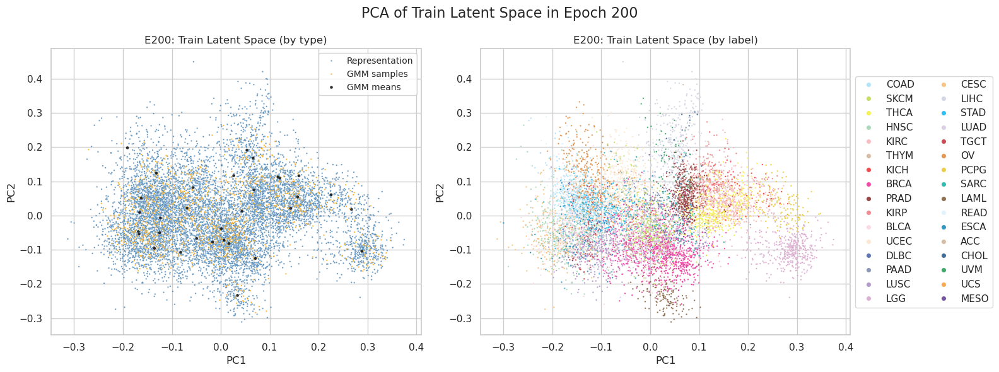

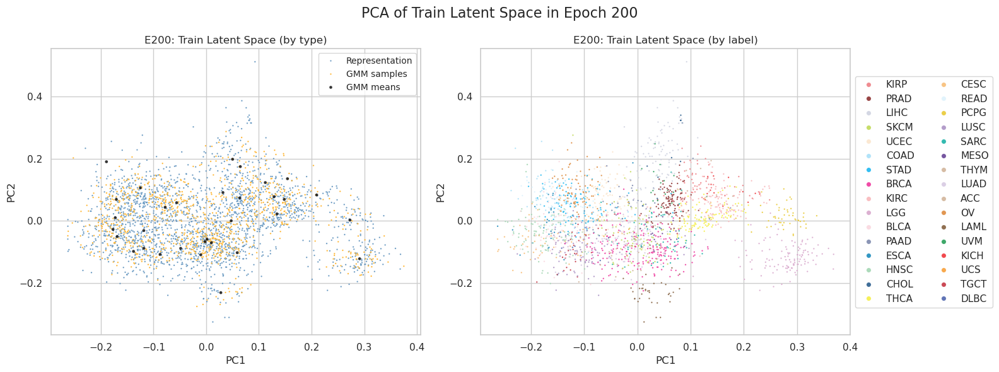

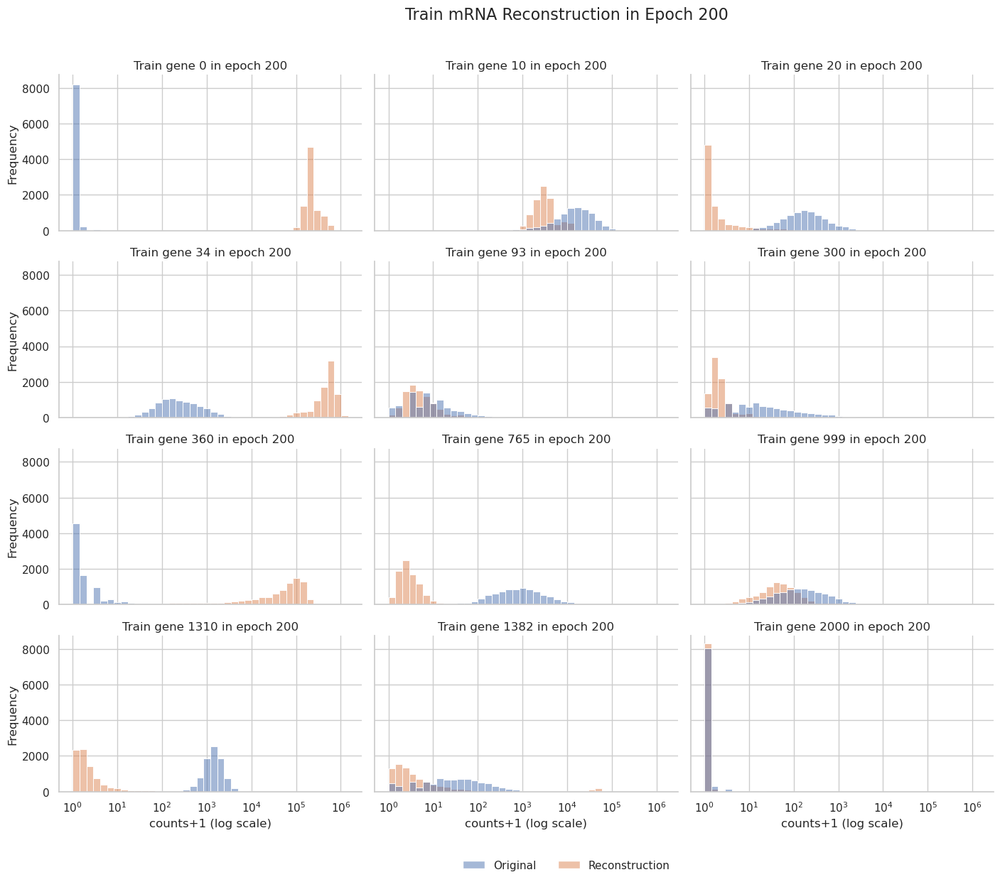

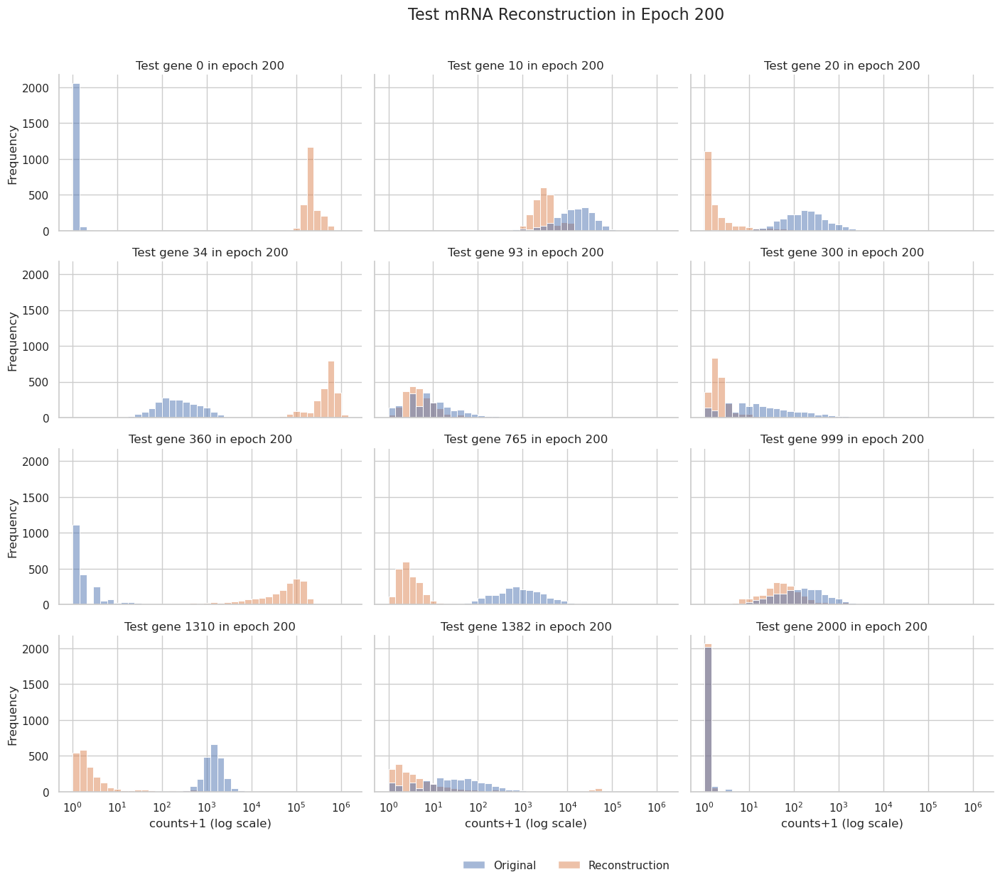

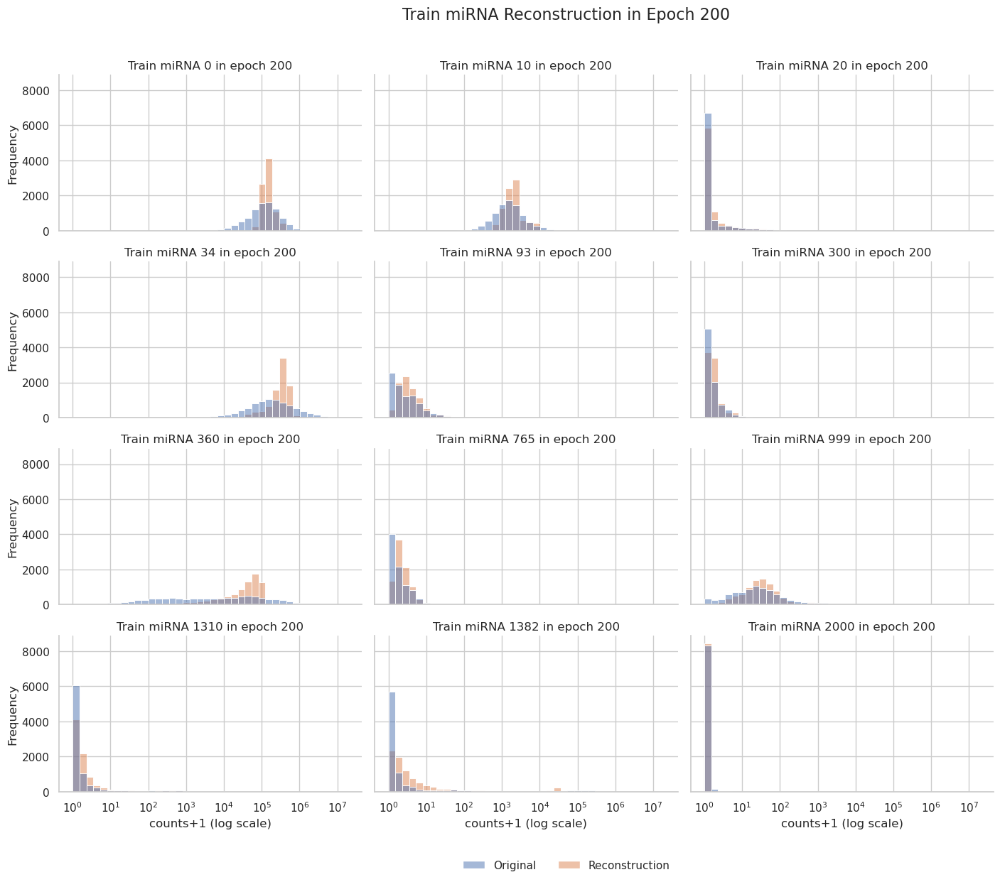

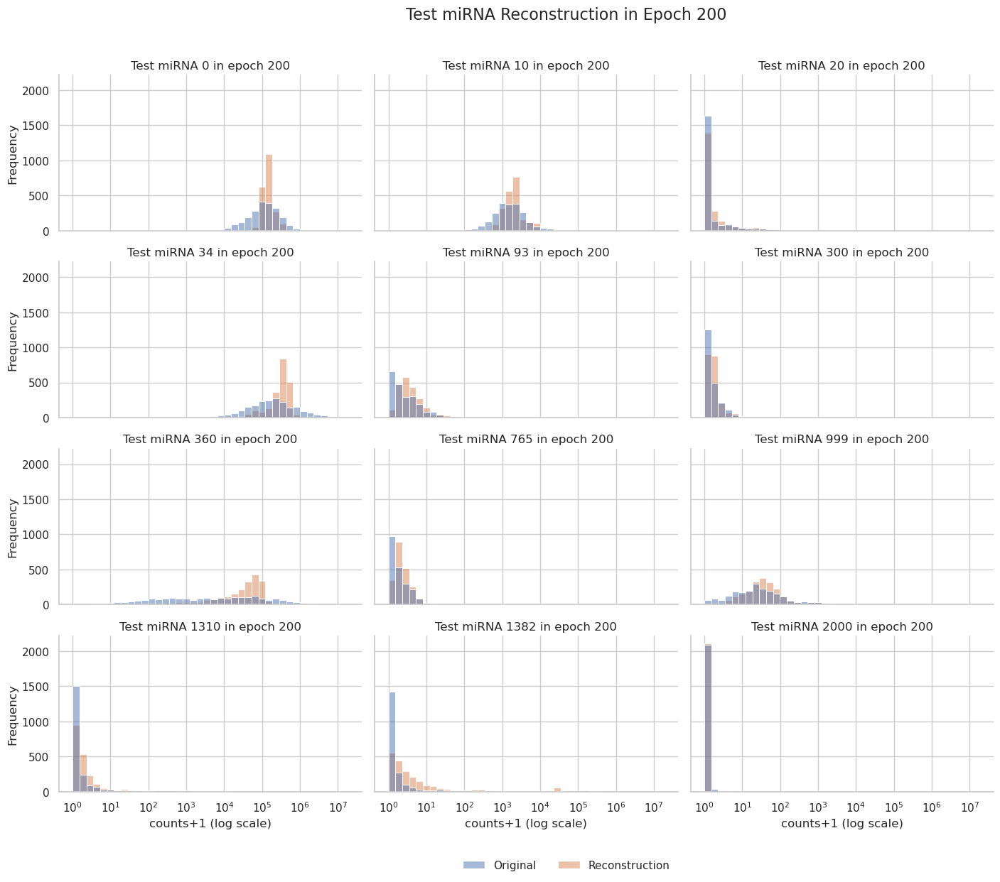

 53%|████████████████████████████████████████████▏                                       | 211/401 [15:16<14:02,  4.44s/it]

210 train_recon: 5.642283670265929 train_gmm: 2.1864139958408337 train_mse: 84558.578125 train_mae: 45.56539535522461 train_r2: 0.8207621574401855 train_spearman: 0.4702012836933136 train_pearson: 0.906356930732727 train_expl_var: 0.8207621574401855 train_msle: 0.5105230212211609
210 test_recon: 5.55094425188842 test_gmm: 2.182388355692879 test_mse: 1490917.125 test_mae: 196.04629516601562 test_r2: 0.7990599274635315 test_spearman: 0.47033533453941345 test_pearson: 0.894256591796875 test_expl_var: 0.7990599274635315 test_msle: 1.2341058254241943


 55%|██████████████████████████████████████████████▎                                     | 221/401 [15:54<11:33,  3.86s/it]

220 train_recon: 5.640866777646836 train_gmm: 2.1865538600345027 train_mse: 86495.4375 train_mae: 46.392635345458984 train_r2: 0.8166566491127014 train_spearman: 0.4724705219268799 train_pearson: 0.9041743278503418 train_expl_var: 0.8166566491127014 train_msle: 0.5743767619132996
220 test_recon: 5.549797902193805 test_gmm: 2.1826733427025395 test_mse: 1495959.375 test_mae: 197.48983764648438 test_r2: 0.7983803749084473 test_spearman: 0.4685579240322113 test_pearson: 0.8939792513847351 test_expl_var: 0.7983803749084473 test_msle: 1.3682562112808228


 58%|████████████████████████████████████████████████▍                                   | 231/401 [16:31<10:36,  3.75s/it]

230 train_recon: 5.639630430803181 train_gmm: 2.1868114654108672 train_mse: 86315.4140625 train_mae: 46.11311721801758 train_r2: 0.8170382380485535 train_spearman: 0.4677971601486206 train_pearson: 0.9042840003967285 train_expl_var: 0.8170382380485535 train_msle: 0.5283828377723694
230 test_recon: 5.548667862941306 test_gmm: 2.1827513447745903 test_mse: 1524823.5 test_mae: 199.33140563964844 test_r2: 0.7944901585578918 test_spearman: 0.4645616114139557 test_pearson: 0.8917440176010132 test_expl_var: 0.7944901585578918 test_msle: 1.3380581140518188


 60%|██████████████████████████████████████████████████▍                                 | 241/401 [17:08<09:50,  3.69s/it]

240 train_recon: 5.6386033460748415 train_gmm: 2.187105945568846 train_mse: 85559.0 train_mae: 46.018226623535156 train_r2: 0.8186416029930115 train_spearman: 0.46963241696357727 train_pearson: 0.9052374362945557 train_expl_var: 0.8186416029930115 train_msle: 0.5694937109947205
240 test_recon: 5.550296063227005 test_gmm: 2.1828047669743484 test_mse: 1523011.0 test_mae: 199.06431579589844 test_r2: 0.7947344779968262 test_spearman: 0.464524507522583 test_pearson: 0.8918401598930359 test_expl_var: 0.7947344779968262 test_msle: 1.3617867231369019


 63%|████████████████████████████████████████████████████▌                               | 251/401 [17:46<09:35,  3.84s/it]

250 train_recon: 5.637216585009734 train_gmm: 2.187501755091251 train_mse: 85177.234375 train_mae: 45.46721649169922 train_r2: 0.819450855255127 train_spearman: 0.46568915247917175 train_pearson: 0.9055259227752686 train_expl_var: 0.819450855255127 train_msle: 0.47434914112091064
250 test_recon: 5.548806909855341 test_gmm: 2.183155123065171 test_mse: 1479765.875 test_mae: 194.35365295410156 test_r2: 0.800562858581543 test_spearman: 0.4634205996990204 test_pearson: 0.8950191140174866 test_expl_var: 0.800562858581543 test_msle: 1.1857889890670776


 65%|██████████████████████████████████████████████████████▋                             | 261/401 [18:24<08:44,  3.75s/it]

260 train_recon: 5.636267391033016 train_gmm: 2.187822440133666 train_mse: 85408.984375 train_mae: 45.59413528442383 train_r2: 0.8189595937728882 train_spearman: 0.4736134707927704 train_pearson: 0.9052298069000244 train_expl_var: 0.8189595937728882 train_msle: 0.45575636625289917
260 test_recon: 5.549787637727649 test_gmm: 2.1830676755525467 test_mse: 1517695.375 test_mae: 196.2364959716797 test_r2: 0.7954508662223816 test_spearman: 0.470742404460907 test_pearson: 0.8920999765396118 test_expl_var: 0.7954508662223816 test_msle: 1.144683599472046


 68%|████████████████████████████████████████████████████████▊                           | 271/401 [19:01<07:56,  3.66s/it]

270 train_recon: 5.6353829072277675 train_gmm: 2.187866884103607 train_mse: 85972.5546875 train_mae: 45.64712142944336 train_r2: 0.8177649974822998 train_spearman: 0.4687366187572479 train_pearson: 0.9045368432998657 train_expl_var: 0.8177649974822998 train_msle: 0.4418669044971466
270 test_recon: 5.548727390525176 test_gmm: 2.182965814023163 test_mse: 1500479.5 test_mae: 194.6158905029297 test_r2: 0.797771155834198 test_spearman: 0.4688507318496704 test_pearson: 0.8933615684509277 test_expl_var: 0.797771155834198 test_msle: 1.0935229063034058


 70%|██████████████████████████████████████████████████████████▊                         | 281/401 [19:38<07:34,  3.78s/it]

280 train_recon: 5.63443627248475 train_gmm: 2.188234687200434 train_mse: 86535.546875 train_mae: 45.995426177978516 train_r2: 0.8165715932846069 train_spearman: 0.4648401737213135 train_pearson: 0.9039289355278015 train_expl_var: 0.8165715932846069 train_msle: 0.49115434288978577
280 test_recon: 5.548348247794009 test_gmm: 2.1839034255159544 test_mse: 1517633.625 test_mae: 195.27757263183594 test_r2: 0.7954592108726501 test_spearman: 0.46619442105293274 test_pearson: 0.8921117782592773 test_expl_var: 0.7954592108726501 test_msle: 1.1827194690704346


 73%|████████████████████████████████████████████████████████████▉                       | 291/401 [20:16<06:59,  3.81s/it]

290 train_recon: 5.633572171712111 train_gmm: 2.1885125089984157 train_mse: 86578.8046875 train_mae: 45.747314453125 train_r2: 0.8164799213409424 train_spearman: 0.47107183933258057 train_pearson: 0.9038399457931519 train_expl_var: 0.8164799213409424 train_msle: 0.45810720324516296
290 test_recon: 5.548402356118938 test_gmm: 2.1835789929284983 test_mse: 1514203.125 test_mae: 194.25755310058594 test_r2: 0.7959215641021729 test_spearman: 0.4713062047958374 test_pearson: 0.8923418521881104 test_expl_var: 0.7959215641021729 test_msle: 1.1794434785842896


 75%|███████████████████████████████████████████████████████████████                     | 301/401 [20:53<06:16,  3.76s/it]

300 train_recon: 5.632559435280124 train_gmm: 2.1888194956107854 train_mse: 88116.4609375 train_mae: 46.787628173828125 train_r2: 0.8132205605506897 train_spearman: 0.4726978838443756 train_pearson: 0.9021442532539368 train_expl_var: 0.8132205605506897 train_msle: 0.5558843016624451
300 test_recon: 5.547274792135344 test_gmm: 2.183680492821008 test_mse: 1525615.875 test_mae: 198.3111572265625 test_r2: 0.7943834066390991 test_spearman: 0.4728337824344635 test_pearson: 0.8916271924972534 test_expl_var: 0.7943834066390991 test_msle: 1.3598573207855225


 78%|█████████████████████████████████████████████████████████████████▏                  | 311/401 [21:31<05:37,  3.75s/it]

310 train_recon: 5.63181900184051 train_gmm: 2.189073239214707 train_mse: 86507.3515625 train_mae: 45.855960845947266 train_r2: 0.8166313767433167 train_spearman: 0.46643856167793274 train_pearson: 0.9039403200149536 train_expl_var: 0.8166313767433167 train_msle: 0.4759174585342407
310 test_recon: 5.547811735892389 test_gmm: 2.1836373865632317 test_mse: 1548873.125 test_mae: 196.0369415283203 test_r2: 0.7912488579750061 test_spearman: 0.4680773913860321 test_pearson: 0.8896780014038086 test_expl_var: 0.7912488579750061 test_msle: 1.1565287113189697


 80%|███████████████████████████████████████████████████████████████████▏                | 321/401 [22:08<04:56,  3.70s/it]

320 train_recon: 5.631306907602406 train_gmm: 2.189345619943965 train_mse: 87590.4453125 train_mae: 46.680049896240234 train_r2: 0.8143355846405029 train_spearman: 0.470365971326828 train_pearson: 0.9027755260467529 train_expl_var: 0.8143355846405029 train_msle: 0.5527952313423157
320 test_recon: 5.549319690774662 test_gmm: 2.1839000850204005 test_mse: 1621234.5 test_mae: 203.7974853515625 test_r2: 0.7814962863922119 test_spearman: 0.4710352122783661 test_pearson: 0.8842198252677917 test_expl_var: 0.7814962863922119 test_msle: 1.3942457437515259


 83%|█████████████████████████████████████████████████████████████████████▎              | 331/401 [22:45<04:17,  3.68s/it]

330 train_recon: 5.630636435765967 train_gmm: 2.18989704160218 train_mse: 86595.4296875 train_mae: 45.79989242553711 train_r2: 0.8164446949958801 train_spearman: 0.4720819294452667 train_pearson: 0.9038159251213074 train_expl_var: 0.8164446949958801 train_msle: 0.46381911635398865
330 test_recon: 5.548648692773626 test_gmm: 2.1849558645779967 test_mse: 1510482.125 test_mae: 192.21484375 test_r2: 0.796423077583313 test_spearman: 0.47046250104904175 test_pearson: 0.8925343155860901 test_expl_var: 0.796423077583313 test_msle: 1.1607431173324585


 85%|███████████████████████████████████████████████████████████████████████▍            | 341/401 [23:22<03:43,  3.72s/it]

340 train_recon: 5.629715072139269 train_gmm: 2.1901492116267307 train_mse: 86811.6015625 train_mae: 46.056095123291016 train_r2: 0.8159865140914917 train_spearman: 0.47154784202575684 train_pearson: 0.9035890102386475 train_expl_var: 0.8159864544868469 train_msle: 0.48259419202804565
340 test_recon: 5.5472291839891605 test_gmm: 2.184523978668856 test_mse: 1586475.125 test_mae: 198.61805725097656 test_r2: 0.7861809730529785 test_spearman: 0.4686847925186157 test_pearson: 0.8867678642272949 test_expl_var: 0.7861809730529785 test_msle: 1.1304067373275757


 88%|█████████████████████████████████████████████████████████████████████████▌          | 351/401 [24:00<03:05,  3.70s/it]

350 train_recon: 5.628930930305568 train_gmm: 2.19049009522542 train_mse: 84225.453125 train_mae: 44.619598388671875 train_r2: 0.8214682936668396 train_spearman: 0.471924751996994 train_pearson: 0.9064715504646301 train_expl_var: 0.8214682936668396 train_msle: 0.3541312515735626
350 test_recon: 5.548460756665478 test_gmm: 2.1855292176865304 test_mse: 1545749.125 test_mae: 194.22279357910156 test_r2: 0.7916699051856995 test_spearman: 0.47072073817253113 test_pearson: 0.8897978663444519 test_expl_var: 0.7916699051856995 test_msle: 0.8789413571357727


 90%|███████████████████████████████████████████████████████████████████████████▌        | 361/401 [24:36<02:27,  3.69s/it]

360 train_recon: 5.628631811967897 train_gmm: 2.190635672755633 train_mse: 87277.6953125 train_mae: 46.90221405029297 train_r2: 0.8149985074996948 train_spearman: 0.4734899401664734 train_pearson: 0.9032403826713562 train_expl_var: 0.8149985074996948 train_msle: 0.5993688106536865
360 test_recon: 5.547133854537189 test_gmm: 2.1852717679669205 test_mse: 1555737.125 test_mae: 199.3051300048828 test_r2: 0.7903237342834473 test_spearman: 0.4761067032814026 test_pearson: 0.8893226981163025 test_expl_var: 0.7903237342834473 test_msle: 1.4447786808013916


 93%|█████████████████████████████████████████████████████████████████████████████▋      | 371/401 [25:13<01:49,  3.64s/it]

370 train_recon: 5.627738557784606 train_gmm: 2.190909652790355 train_mse: 86202.7578125 train_mae: 45.825035095214844 train_r2: 0.8172770738601685 train_spearman: 0.46753841638565063 train_pearson: 0.9042628407478333 train_expl_var: 0.8172770142555237 train_msle: 0.4861237406730652
370 test_recon: 5.547495012069833 test_gmm: 2.185432330450911 test_mse: 1579657.25 test_mae: 198.1317596435547 test_r2: 0.7870998978614807 test_spearman: 0.46483805775642395 test_pearson: 0.887299656867981 test_expl_var: 0.7870998978614807 test_msle: 1.2300289869308472


 95%|███████████████████████████████████████████████████████████████████████████████▊    | 381/401 [25:50<01:14,  3.72s/it]

380 train_recon: 5.627189558711965 train_gmm: 2.1910502623261143 train_mse: 83826.375 train_mae: 44.69258499145508 train_r2: 0.8223142027854919 train_spearman: 0.47013261914253235 train_pearson: 0.906994104385376 train_expl_var: 0.8223142027854919 train_msle: 0.4073248505592346
380 test_recon: 5.546326985339456 test_gmm: 2.1859888209894613 test_mse: 1530275.25 test_mae: 194.01380920410156 test_r2: 0.7937554121017456 test_spearman: 0.4697045087814331 test_pearson: 0.8910222053527832 test_expl_var: 0.7937554121017456 test_msle: 1.0106064081192017


 98%|█████████████████████████████████████████████████████████████████████████████████▉  | 391/401 [26:28<00:37,  3.74s/it]

390 train_recon: 5.626659719663647 train_gmm: 2.191425125806313 train_mse: 84258.6796875 train_mae: 44.86524963378906 train_r2: 0.8213979005813599 train_spearman: 0.47289416193962097 train_pearson: 0.9065070748329163 train_expl_var: 0.8213979005813599 train_msle: 0.41378074884414673
390 test_recon: 5.548511273217232 test_gmm: 2.1858699968324613 test_mse: 1529151.5 test_mae: 194.33045959472656 test_r2: 0.7939068675041199 test_spearman: 0.46950575709342957 test_pearson: 0.8911051154136658 test_expl_var: 0.7939068675041199 test_msle: 1.0495401620864868


100%|███████████████████████████████████████████████████████████████████████████████████▊| 400/401 [27:02<00:03,  3.78s/it]

400 train_recon: 5.625917616929624 train_gmm: 2.1920068027794244 train_mse: 85129.921875 train_mae: 45.54682922363281 train_r2: 0.8195511102676392 train_spearman: 0.4705333411693573 train_pearson: 0.9055450558662415 train_expl_var: 0.8195511102676392 train_msle: 0.4792620539665222
400 test_recon: 5.54750866818104 test_gmm: 2.1861663117955943 test_mse: 1558801.375 test_mae: 195.63023376464844 test_r2: 0.7899107933044434 test_spearman: 0.46724069118499756 test_pearson: 0.8888744711875916 test_expl_var: 0.7899107933044434 test_msle: 1.1572803258895874


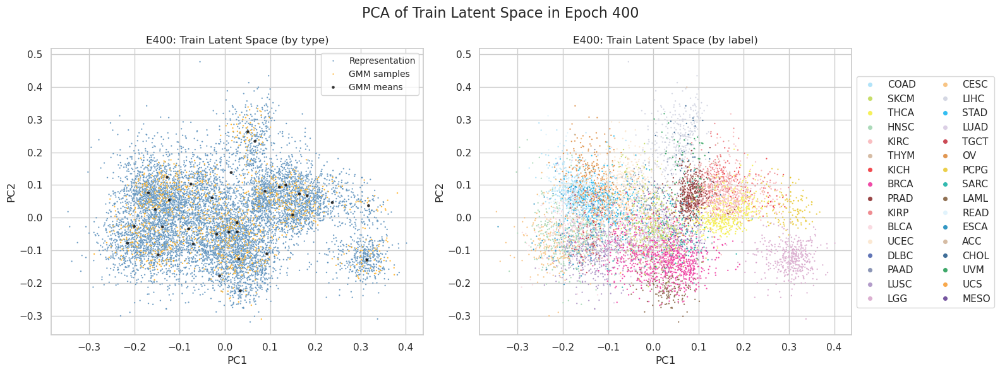

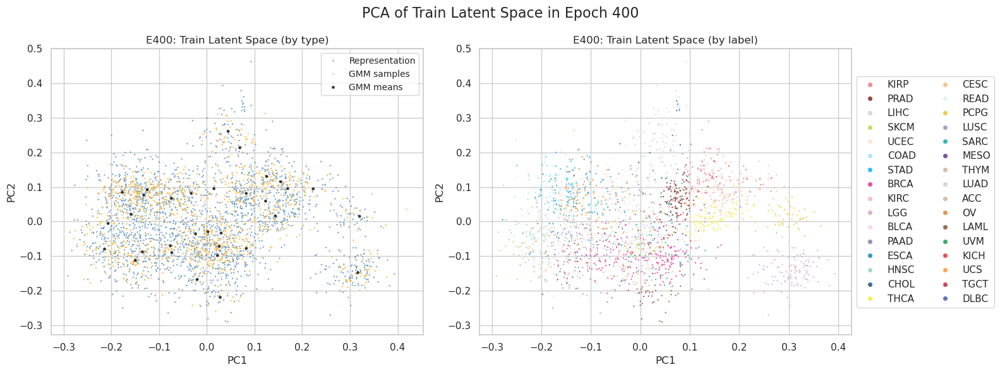

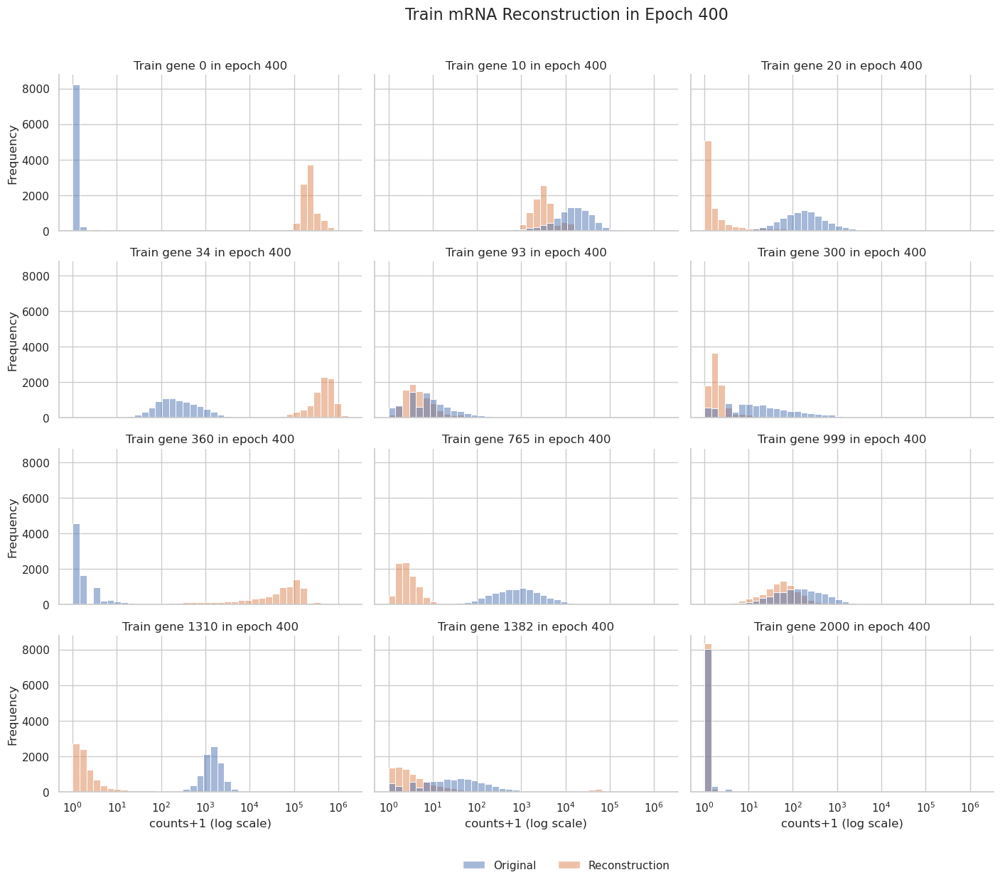

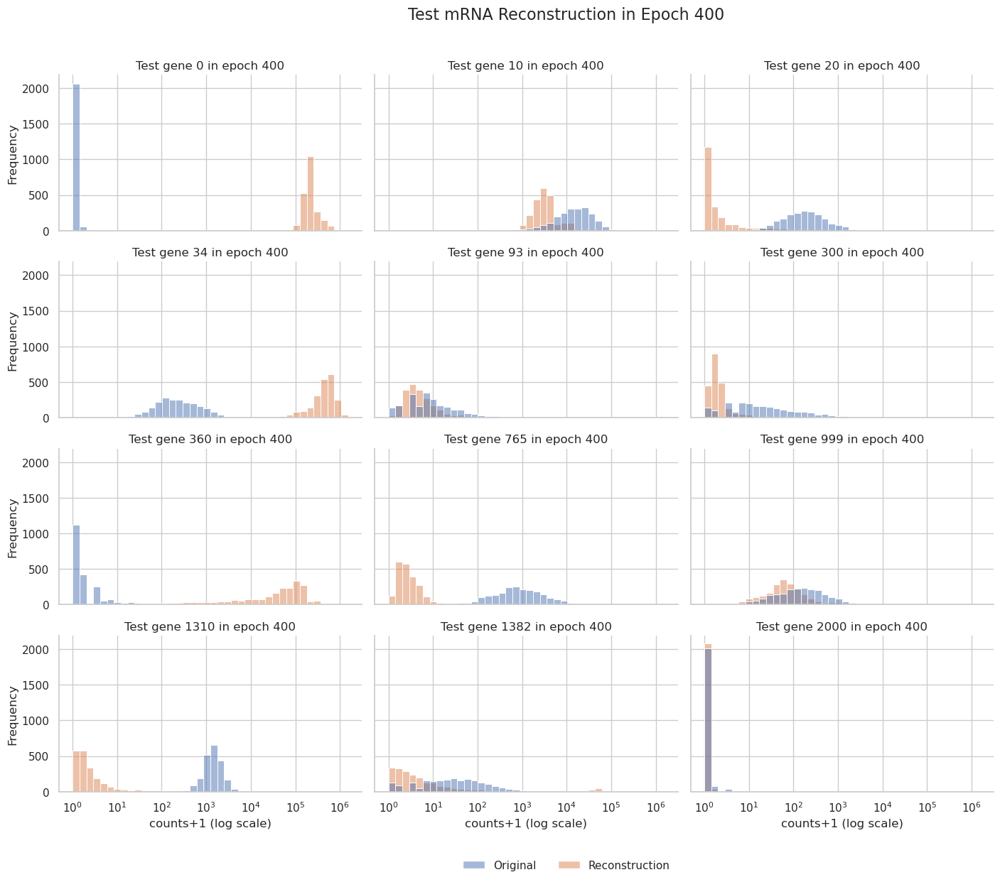

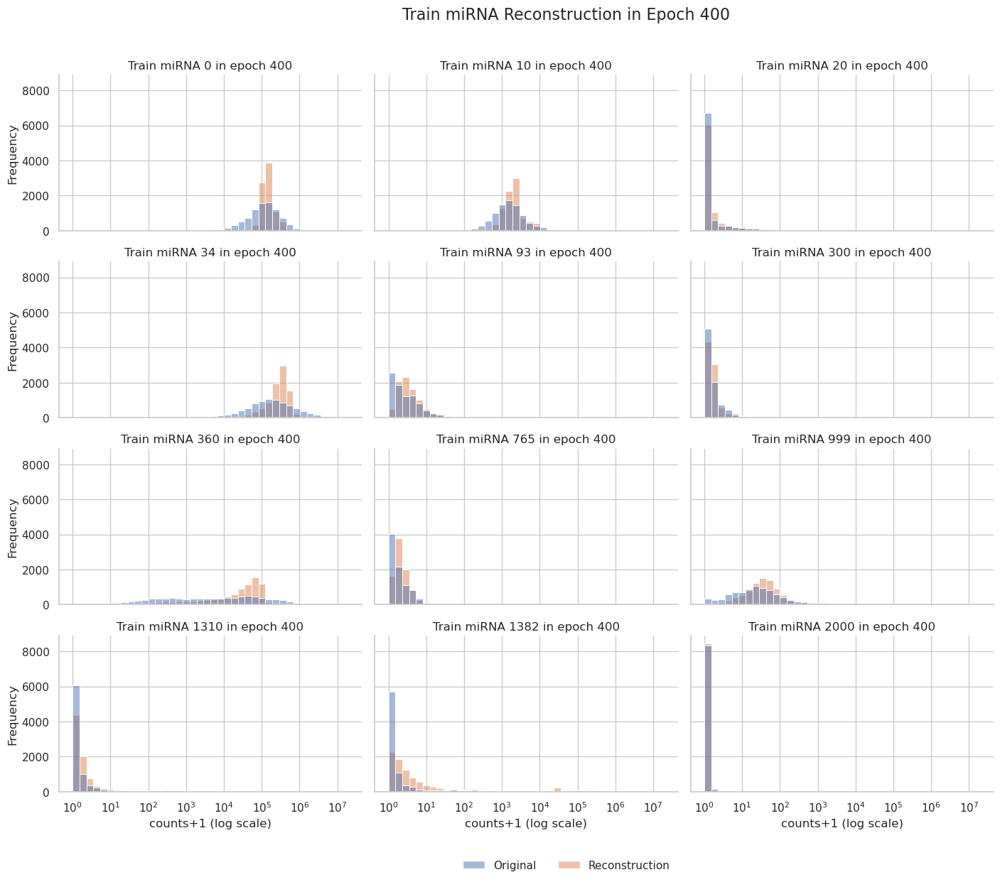

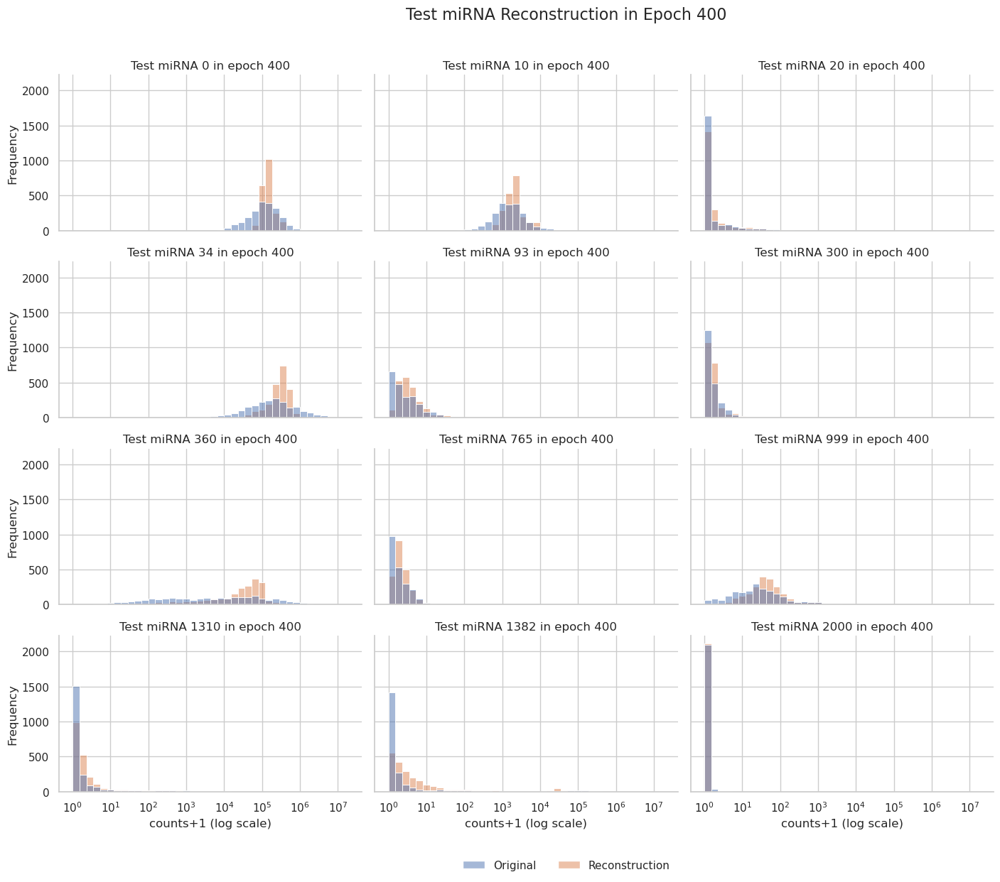

100%|████████████████████████████████████████████████████████████████████████████████████| 401/401 [28:15<00:00,  4.23s/it]


Fold 2 done...
Fold: 3...


  0%|                                                                                              | 0/401 [00:00<?, ?it/s]

0 train_recon: 7.317384852413889 train_gmm: 6.70478439947409 train_mse: 447437.65625 train_mae: 218.62322998046875 train_r2: 0.018261313438415527 train_spearman: 0.22855059802532196 train_pearson: 0.13552464544773102 train_expl_var: 0.018261253833770752 train_msle: 19.052001953125
0 test_recon: 6.983685160331067 test_gmm: 3.1148139957186767 test_mse: 8406519.0 test_mae: 888.5447387695312 test_r2: 0.004666447639465332 test_spearman: 0.18963342905044556 test_pearson: 0.08430527150630951 test_expl_var: 0.004666388034820557 test_msle: 31.894620895385742


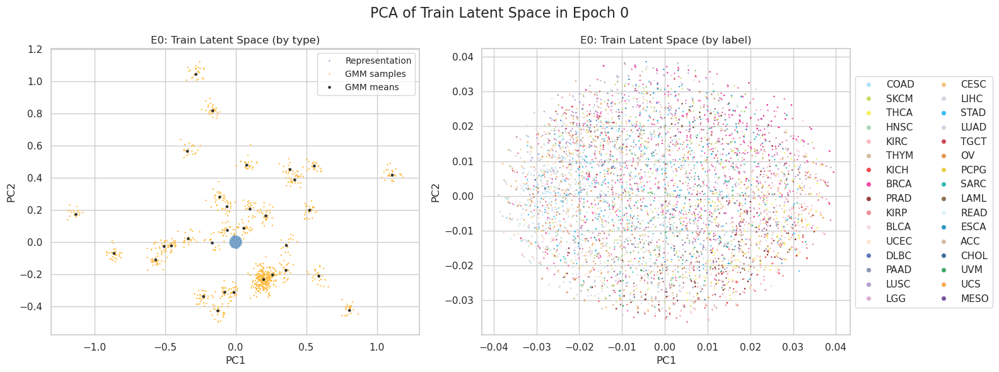

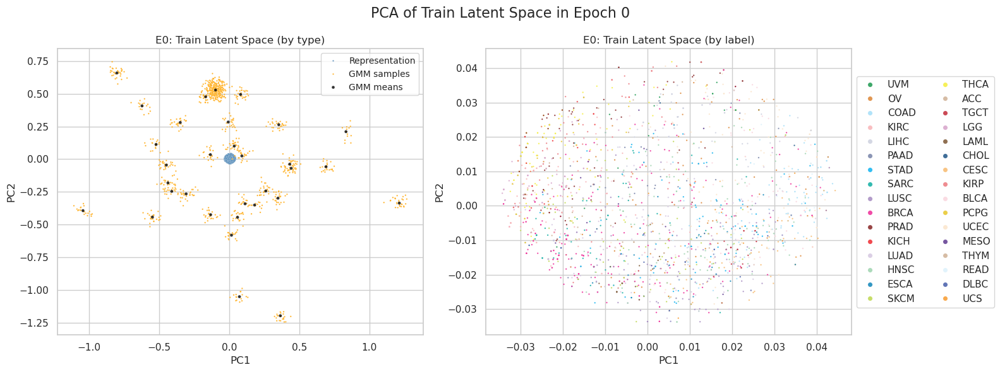

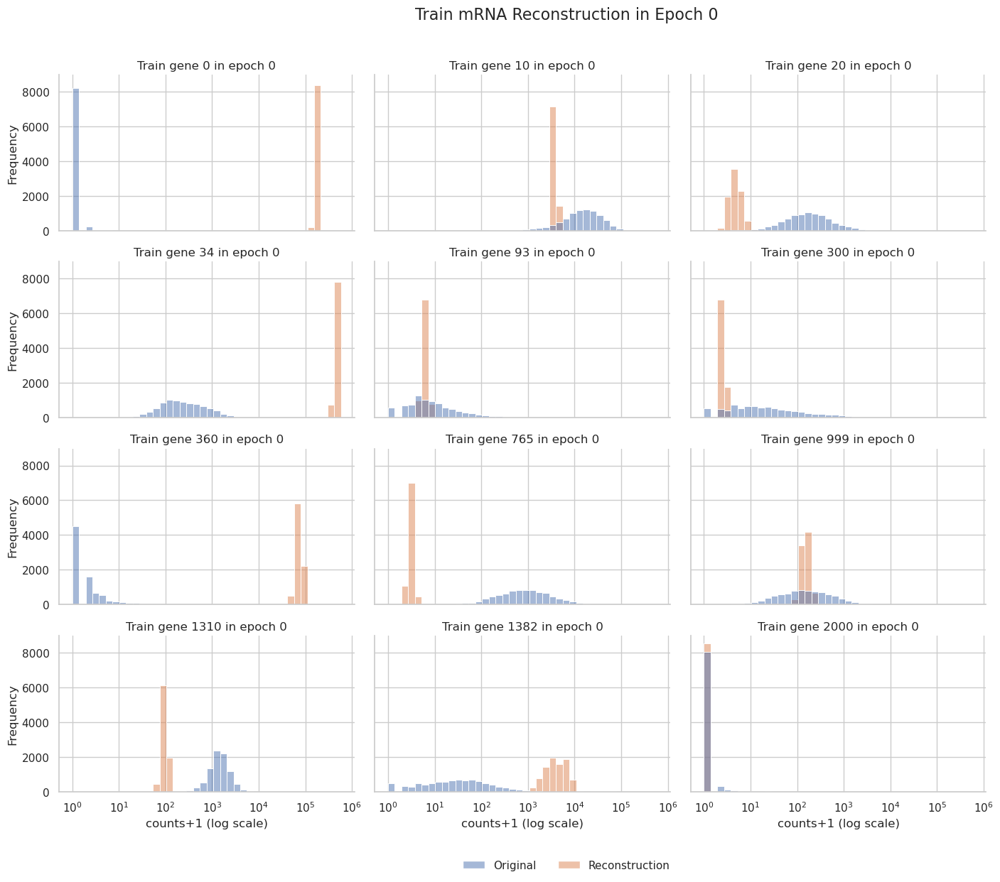

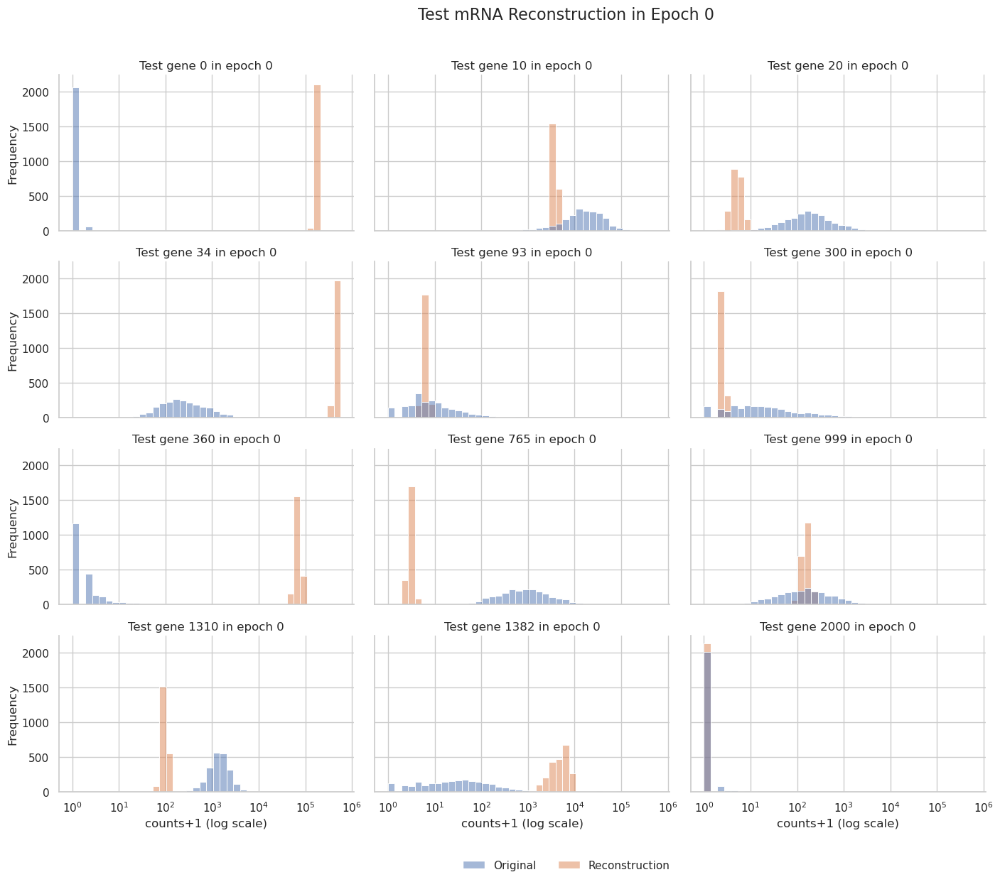

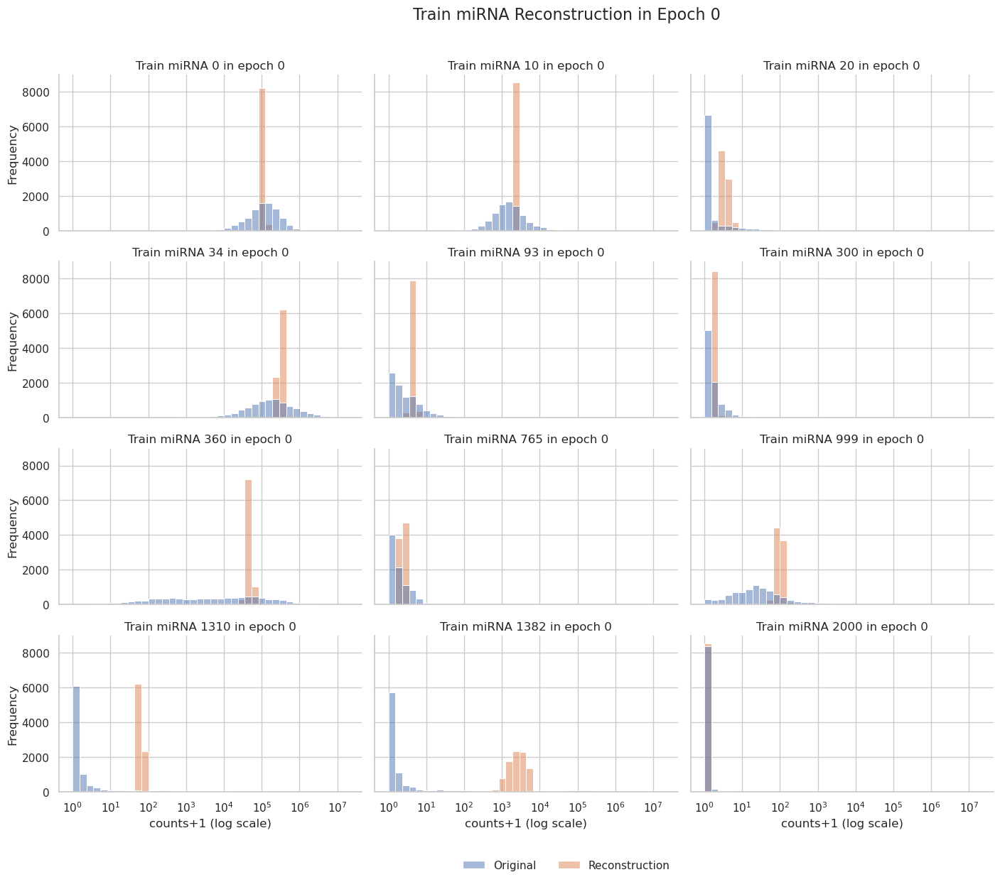

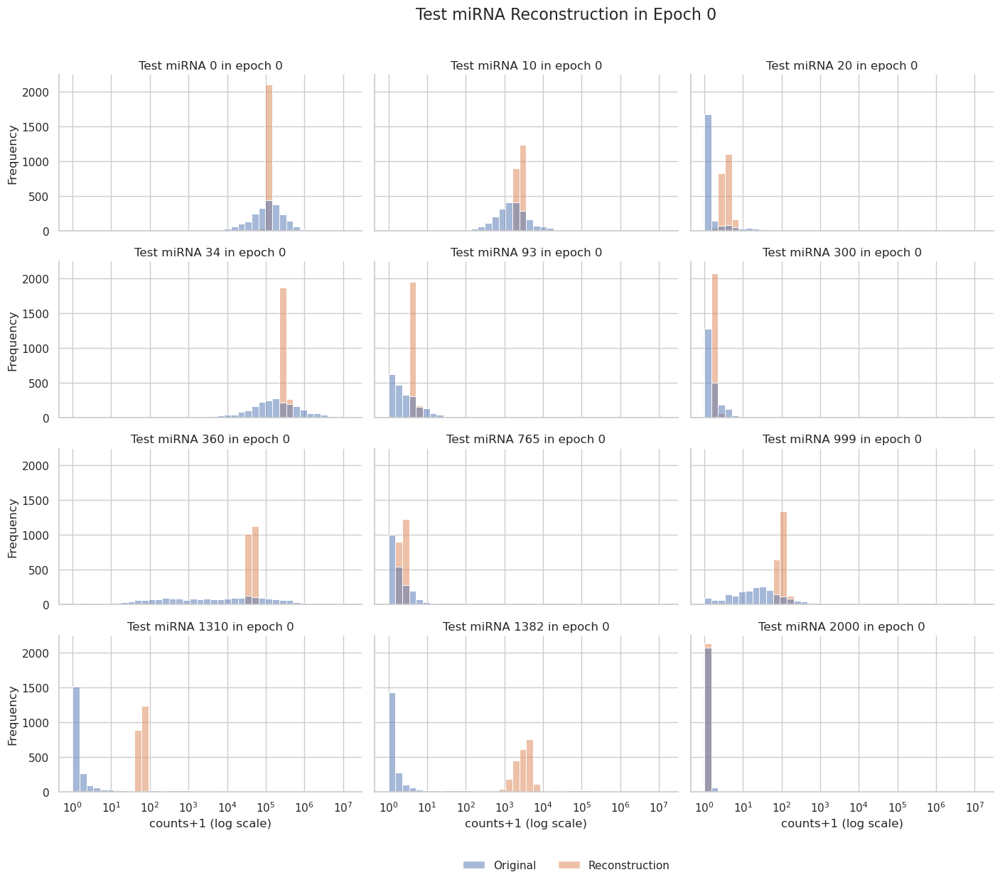

  3%|██▎                                                                                  | 11/401 [01:52<29:00,  4.46s/it]

10 train_recon: 5.767099921498929 train_gmm: 2.1699162709993525 train_mse: 92470.96875 train_mae: 52.35489273071289 train_r2: 0.797106146812439 train_spearman: 0.4307527244091034 train_pearson: 0.8932915925979614 train_expl_var: 0.797106146812439 train_msle: 1.1746999025344849
10 test_recon: 5.6056256858338145 test_gmm: 2.1690220424107145 test_mse: 2033744.5 test_mae: 199.58157348632812 test_r2: 0.7592042684555054 test_spearman: 0.4230845868587494 test_pearson: 0.8714073896408081 test_expl_var: 0.7592042088508606 test_msle: 2.522200584411621


  5%|████▍                                                                                | 21/401 [02:30<24:16,  3.83s/it]

20 train_recon: 5.694051122873265 train_gmm: 2.1771553821159517 train_mse: 89419.8046875 train_mae: 49.33930206298828 train_r2: 0.8038008809089661 train_spearman: 0.45235496759414673 train_pearson: 0.896580696105957 train_expl_var: 0.8038008213043213 train_msle: 0.710984468460083
20 test_recon: 5.546015480647716 test_gmm: 2.1764163043627414 test_mse: 1938038.375 test_mae: 197.88504028320312 test_r2: 0.7705358862876892 test_spearman: 0.4570308029651642 test_pearson: 0.8778180480003357 test_expl_var: 0.7705358266830444 test_msle: 1.7907882928848267


  8%|██████▌                                                                              | 31/401 [03:08<23:36,  3.83s/it]

30 train_recon: 5.667518364897795 train_gmm: 2.1807594262692453 train_mse: 89098.046875 train_mae: 48.98277282714844 train_r2: 0.8045068383216858 train_spearman: 0.46218782663345337 train_pearson: 0.8970025181770325 train_expl_var: 0.8045068383216858 train_msle: 0.6460769772529602
30 test_recon: 5.526488273861224 test_gmm: 2.1802903815454844 test_mse: 1814687.0 test_mae: 193.8198699951172 test_r2: 0.7851406931877136 test_spearman: 0.46336206793785095 test_pearson: 0.8862794041633606 test_expl_var: 0.7851406931877136 test_msle: 1.5560436248779297


 10%|████████▋                                                                            | 41/401 [03:47<23:06,  3.85s/it]

40 train_recon: 5.654651005199067 train_gmm: 2.1817398412517104 train_mse: 86170.9765625 train_mae: 48.06141662597656 train_r2: 0.8109292387962341 train_spearman: 0.4682784378528595 train_pearson: 0.9006752967834473 train_expl_var: 0.8109292387962341 train_msle: 0.6239612102508545
40 test_recon: 5.519567048082783 test_gmm: 2.1810960341728265 test_mse: 1820935.0 test_mae: 191.2034454345703 test_r2: 0.7844009399414062 test_spearman: 0.47428157925605774 test_pearson: 0.885977029800415 test_expl_var: 0.7844009399414062 test_msle: 1.5438141822814941


 13%|██████████▊                                                                          | 51/401 [04:25<22:33,  3.87s/it]

50 train_recon: 5.647291291516445 train_gmm: 2.1826505849713422 train_mse: 85529.578125 train_mae: 47.5372314453125 train_r2: 0.8123365640640259 train_spearman: 0.4726497530937195 train_pearson: 0.9013934135437012 train_expl_var: 0.8123365640640259 train_msle: 0.547289252281189
50 test_recon: 5.517914174105991 test_gmm: 2.1817539817220433 test_mse: 1734332.5 test_mae: 187.3802947998047 test_r2: 0.7946547269821167 test_spearman: 0.4754263758659363 test_pearson: 0.891772449016571 test_expl_var: 0.7946546673774719 test_msle: 1.338913083076477


 15%|████████████▉                                                                        | 61/401 [05:03<21:28,  3.79s/it]

60 train_recon: 5.642380984337521 train_gmm: 2.1827345399328424 train_mse: 85381.953125 train_mae: 47.52609634399414 train_r2: 0.8126604557037354 train_spearman: 0.4728265702724457 train_pearson: 0.9015917181968689 train_expl_var: 0.8126604557037354 train_msle: 0.5632376670837402
60 test_recon: 5.516943868695727 test_gmm: 2.181246808161501 test_mse: 1727910.0 test_mae: 187.6453094482422 test_r2: 0.7954151034355164 test_spearman: 0.4746113717556 test_pearson: 0.8923184871673584 test_expl_var: 0.7954151034355164 test_msle: 1.4464768171310425


 18%|███████████████                                                                      | 71/401 [05:41<20:56,  3.81s/it]

70 train_recon: 5.638907418320135 train_gmm: 2.1829443605202115 train_mse: 83925.6484375 train_mae: 46.99776840209961 train_r2: 0.8158557415008545 train_spearman: 0.4735463261604309 train_pearson: 0.903354823589325 train_expl_var: 0.8158557415008545 train_msle: 0.5319480299949646
70 test_recon: 5.516862448148383 test_gmm: 2.1808430441648676 test_mse: 1708999.875 test_mae: 186.4684295654297 test_r2: 0.7976540923118591 test_spearman: 0.4710971713066101 test_pearson: 0.893591582775116 test_expl_var: 0.7976540327072144 test_msle: 1.378142237663269


 20%|█████████████████▏                                                                   | 81/401 [06:20<20:31,  3.85s/it]

80 train_recon: 5.636553314309275 train_gmm: 2.1830564448208456 train_mse: 84029.4609375 train_mae: 46.68682098388672 train_r2: 0.8156279921531677 train_spearman: 0.4760229289531708 train_pearson: 0.9031717777252197 train_expl_var: 0.8156279921531677 train_msle: 0.46053826808929443
80 test_recon: 5.5174919722289575 test_gmm: 2.1811028809737265 test_mse: 1695292.625 test_mae: 184.78614807128906 test_r2: 0.7992770075798035 test_spearman: 0.46882572770118713 test_pearson: 0.8943985104560852 test_expl_var: 0.7992770075798035 test_msle: 1.2009214162826538


 23%|███████████████████▎                                                                 | 91/401 [06:59<20:01,  3.88s/it]

90 train_recon: 5.634817566710718 train_gmm: 2.182938562144637 train_mse: 82903.578125 train_mae: 46.30461120605469 train_r2: 0.8180983066558838 train_spearman: 0.47158581018447876 train_pearson: 0.904567301273346 train_expl_var: 0.8180983066558838 train_msle: 0.47972166538238525
90 test_recon: 5.519023226238104 test_gmm: 2.181064060041441 test_mse: 1663090.375 test_mae: 181.8723907470703 test_r2: 0.8030897378921509 test_spearman: 0.4641931354999542 test_pearson: 0.8965834975242615 test_expl_var: 0.8030897378921509 test_msle: 1.2680295705795288


 25%|█████████████████████▏                                                              | 101/401 [07:37<19:03,  3.81s/it]

100 train_recon: 5.632873254730314 train_gmm: 2.182798545023636 train_mse: 83438.421875 train_mae: 46.79257583618164 train_r2: 0.8169248104095459 train_spearman: 0.4793224632740021 train_pearson: 0.9039884209632874 train_expl_var: 0.8169248104095459 train_msle: 0.5479294061660767
100 test_recon: 5.5193113844042045 test_gmm: 2.1803378574630417 test_mse: 1684374.875 test_mae: 182.74920654296875 test_r2: 0.8005696535110474 test_spearman: 0.4707850515842438 test_pearson: 0.8952803611755371 test_expl_var: 0.8005696535110474 test_msle: 1.378583312034607


 28%|███████████████████████▎                                                            | 111/401 [08:15<18:17,  3.79s/it]

110 train_recon: 5.631539587232676 train_gmm: 2.1827758889108417 train_mse: 81573.484375 train_mae: 45.68359375 train_r2: 0.8210167288780212 train_spearman: 0.47740012407302856 train_pearson: 0.906160831451416 train_expl_var: 0.8210167288780212 train_msle: 0.4398627281188965
110 test_recon: 5.521032660067213 test_gmm: 2.179955917465603 test_mse: 1619539.25 test_mae: 178.05905151367188 test_r2: 0.8082462549209595 test_spearman: 0.4665718674659729 test_pearson: 0.8994497060775757 test_expl_var: 0.8082461953163147 test_msle: 1.1628531217575073


 30%|█████████████████████████▎                                                          | 121/401 [08:54<18:07,  3.88s/it]

120 train_recon: 5.6300766363058345 train_gmm: 2.1829803348885615 train_mse: 81545.6640625 train_mae: 45.84934997558594 train_r2: 0.8210777640342712 train_spearman: 0.47627267241477966 train_pearson: 0.9062296152114868 train_expl_var: 0.8210777640342712 train_msle: 0.45841896533966064
120 test_recon: 5.520371236616958 test_gmm: 2.179638773362028 test_mse: 1639513.0 test_mae: 180.63014221191406 test_r2: 0.8058813214302063 test_spearman: 0.4680705666542053 test_pearson: 0.8982049822807312 test_expl_var: 0.8058813214302063 test_msle: 1.141898512840271


 33%|███████████████████████████▍                                                        | 131/401 [09:32<16:59,  3.78s/it]

130 train_recon: 5.62927332786542 train_gmm: 2.1829510007107262 train_mse: 82259.765625 train_mae: 45.999298095703125 train_r2: 0.8195109367370605 train_spearman: 0.47945207357406616 train_pearson: 0.9053416848182678 train_expl_var: 0.8195109367370605 train_msle: 0.43612080812454224
130 test_recon: 5.5208531767390445 test_gmm: 2.1799642565546327 test_mse: 1628613.5 test_mae: 177.41818237304688 test_r2: 0.8071718215942383 test_spearman: 0.4669085144996643 test_pearson: 0.8988414406776428 test_expl_var: 0.8071718215942383 test_msle: 1.1622934341430664


 35%|█████████████████████████████▌                                                      | 141/401 [10:10<16:26,  3.80s/it]

140 train_recon: 5.6280167572830235 train_gmm: 2.1830412642819836 train_mse: 82788.4140625 train_mae: 46.41886901855469 train_r2: 0.8183510303497314 train_spearman: 0.47597208619117737 train_pearson: 0.9047580361366272 train_expl_var: 0.8183510303497314 train_msle: 0.4897793233394623
140 test_recon: 5.5228404332120835 test_gmm: 2.1797886668435305 test_mse: 1634446.875 test_mae: 178.89263916015625 test_r2: 0.8064811825752258 test_spearman: 0.46625375747680664 test_pearson: 0.8985443711280823 test_expl_var: 0.806481122970581 test_msle: 1.2619493007659912


 38%|███████████████████████████████▋                                                    | 151/401 [10:49<16:11,  3.89s/it]

150 train_recon: 5.627244501931363 train_gmm: 2.1828842657955927 train_mse: 81187.265625 train_mae: 45.50008010864258 train_r2: 0.821864128112793 train_spearman: 0.47886228561401367 train_pearson: 0.9066436886787415 train_expl_var: 0.821864128112793 train_msle: 0.39707744121551514
150 test_recon: 5.522663651613591 test_gmm: 2.17978854963316 test_mse: 1617479.875 test_mae: 175.8203125 test_r2: 0.8084900379180908 test_spearman: 0.4653017818927765 test_pearson: 0.8995184302330017 test_expl_var: 0.8084900379180908 test_msle: 1.0335609912872314


 40%|█████████████████████████████████▋                                                  | 161/401 [11:27<15:38,  3.91s/it]

160 train_recon: 5.6269051375373795 train_gmm: 2.1829968374627713 train_mse: 79947.921875 train_mae: 45.19852066040039 train_r2: 0.8245834112167358 train_spearman: 0.4771890640258789 train_pearson: 0.9081519842147827 train_expl_var: 0.8245834112167358 train_msle: 0.43565285205841064
160 test_recon: 5.522024584581413 test_gmm: 2.1794706107860984 test_mse: 1573697.375 test_mae: 173.66783142089844 test_r2: 0.8136739134788513 test_spearman: 0.46913519501686096 test_pearson: 0.9024800062179565 test_expl_var: 0.8136739134788513 test_msle: 1.1043845415115356


 43%|███████████████████████████████████▊                                                | 171/401 [12:05<14:35,  3.81s/it]

170 train_recon: 5.625686469680026 train_gmm: 2.1830446744185674 train_mse: 81235.65625 train_mae: 45.48263931274414 train_r2: 0.821757972240448 train_spearman: 0.4752485156059265 train_pearson: 0.9066005349159241 train_expl_var: 0.821757972240448 train_msle: 0.41333672404289246
170 test_recon: 5.523758937037375 test_gmm: 2.179065264449466 test_mse: 1600171.75 test_mae: 174.21099853515625 test_r2: 0.8105393648147583 test_spearman: 0.46708473563194275 test_pearson: 0.9007360339164734 test_expl_var: 0.8105393648147583 test_msle: 1.0419352054595947


 45%|█████████████████████████████████████▉                                              | 181/401 [12:44<14:24,  3.93s/it]

180 train_recon: 5.625049265248744 train_gmm: 2.1832676474711135 train_mse: 80993.6484375 train_mae: 45.448734283447266 train_r2: 0.822288990020752 train_spearman: 0.4744023084640503 train_pearson: 0.9068835973739624 train_expl_var: 0.822288990020752 train_msle: 0.39612749218940735
180 test_recon: 5.525536733095862 test_gmm: 2.1795967305739534 test_mse: 1595799.875 test_mae: 174.0556182861328 test_r2: 0.8110569715499878 test_spearman: 0.46415573358535767 test_pearson: 0.9009672403335571 test_expl_var: 0.8110569715499878 test_msle: 1.062397837638855


 48%|████████████████████████████████████████                                            | 191/401 [13:23<13:27,  3.84s/it]

190 train_recon: 5.624405029507175 train_gmm: 2.183368871072712 train_mse: 79850.7109375 train_mae: 44.711421966552734 train_r2: 0.824796736240387 train_spearman: 0.47197866439819336 train_pearson: 0.9082211852073669 train_expl_var: 0.824796736240387 train_msle: 0.361796110868454
190 test_recon: 5.524160720579217 test_gmm: 2.1791053203788238 test_mse: 1603007.75 test_mae: 173.52874755859375 test_r2: 0.8102035522460938 test_spearman: 0.46126461029052734 test_pearson: 0.9004693627357483 test_expl_var: 0.8102035522460938 test_msle: 0.9673182964324951


 50%|█████████████████████████████████████████▉                                          | 200/401 [13:58<13:03,  3.90s/it]

200 train_recon: 5.623698904807006 train_gmm: 2.1834831070752014 train_mse: 81493.7890625 train_mae: 45.6263542175293 train_r2: 0.8211916089057922 train_spearman: 0.47326886653900146 train_pearson: 0.9062826633453369 train_expl_var: 0.8211916089057922 train_msle: 0.4318508505821228
200 test_recon: 5.524763769815581 test_gmm: 2.179966136208742 test_mse: 1607567.625 test_mae: 175.1161346435547 test_r2: 0.8096636533737183 test_spearman: 0.46339890360832214 test_pearson: 0.9002892374992371 test_expl_var: 0.8096636533737183 test_msle: 1.2055007219314575


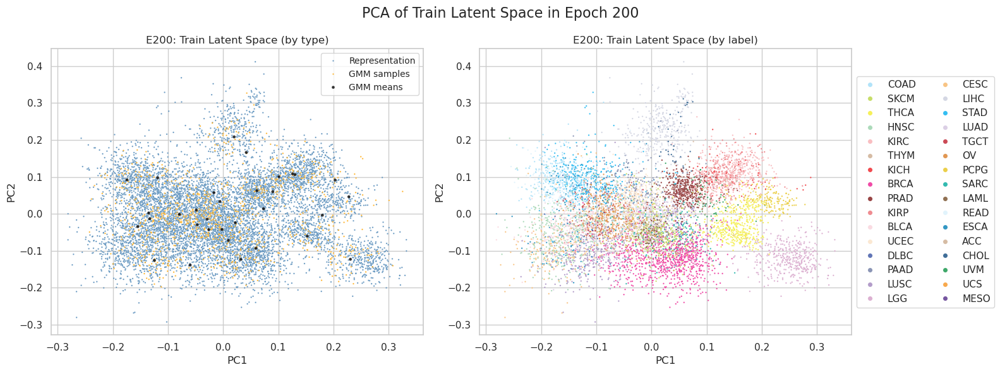

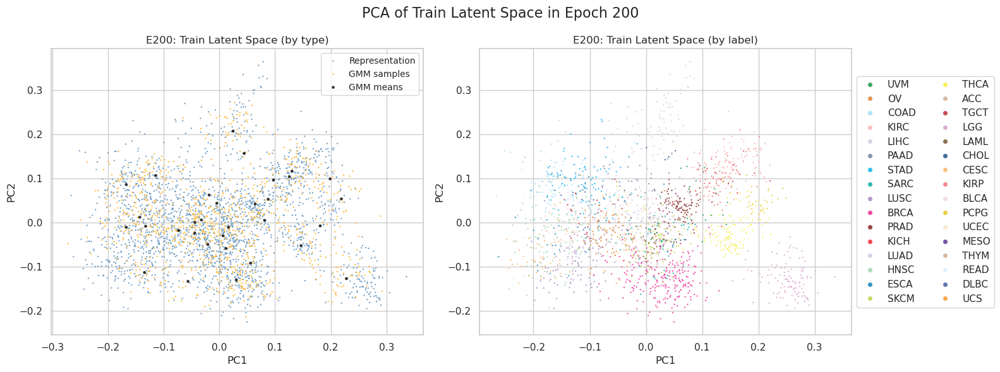

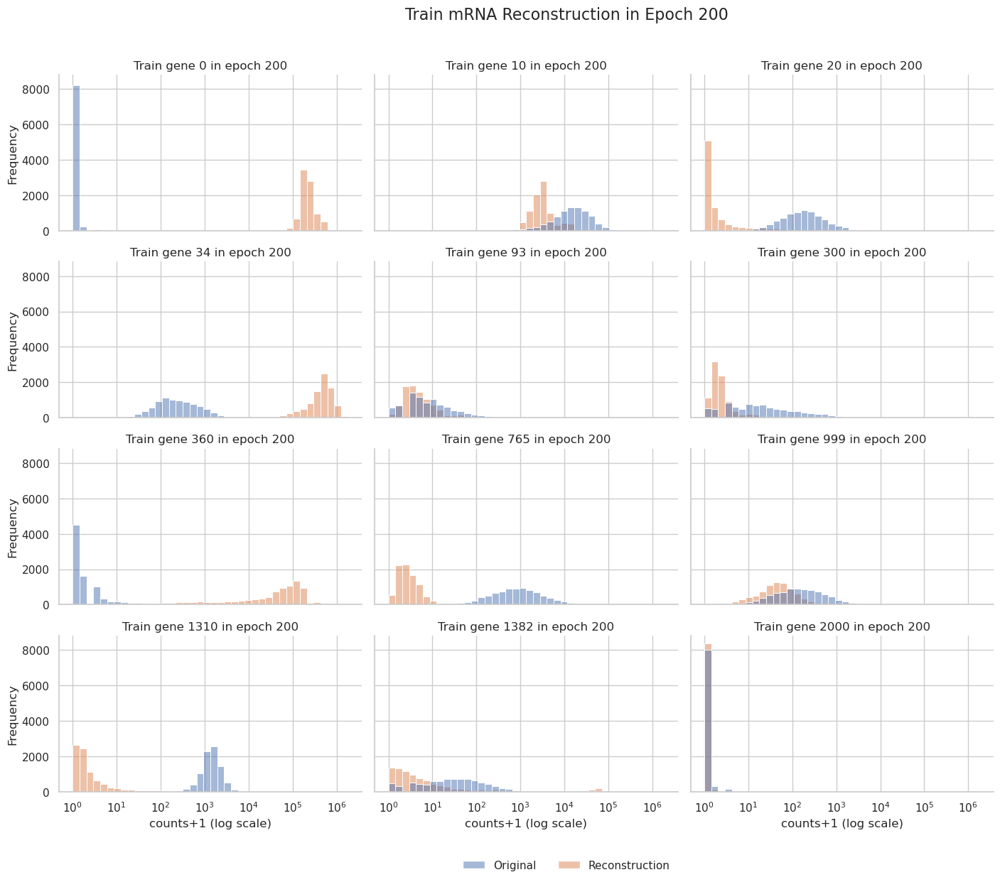

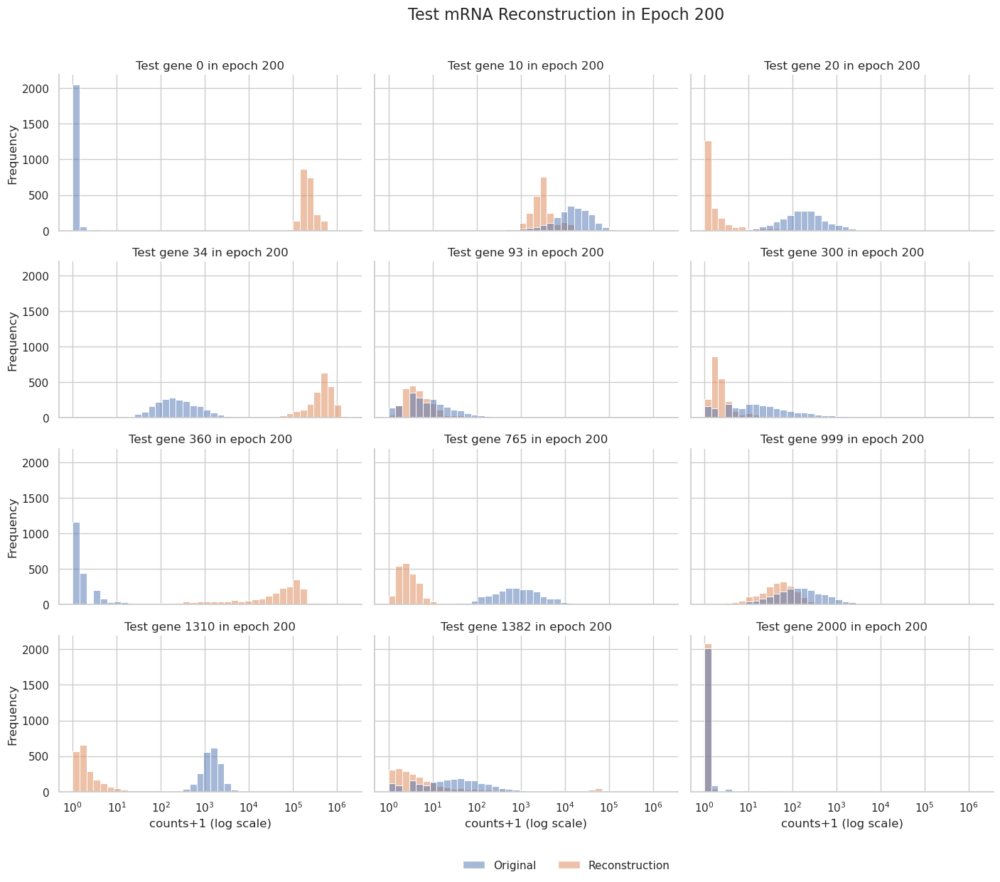

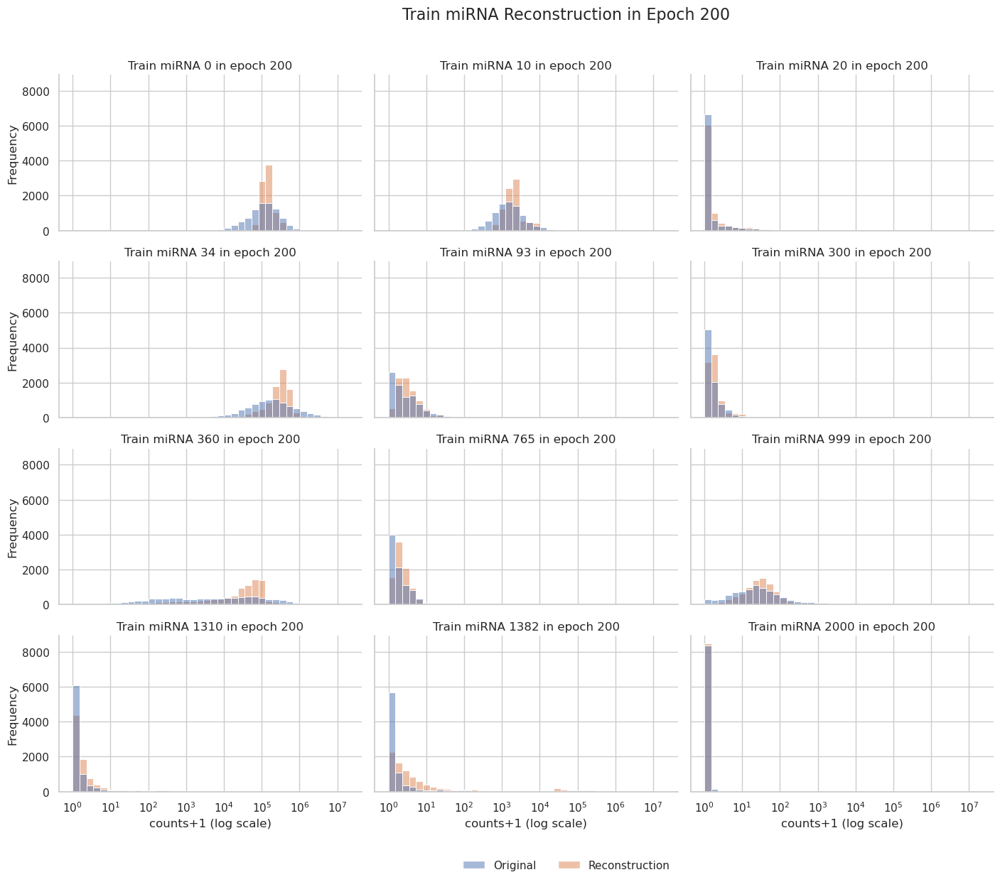

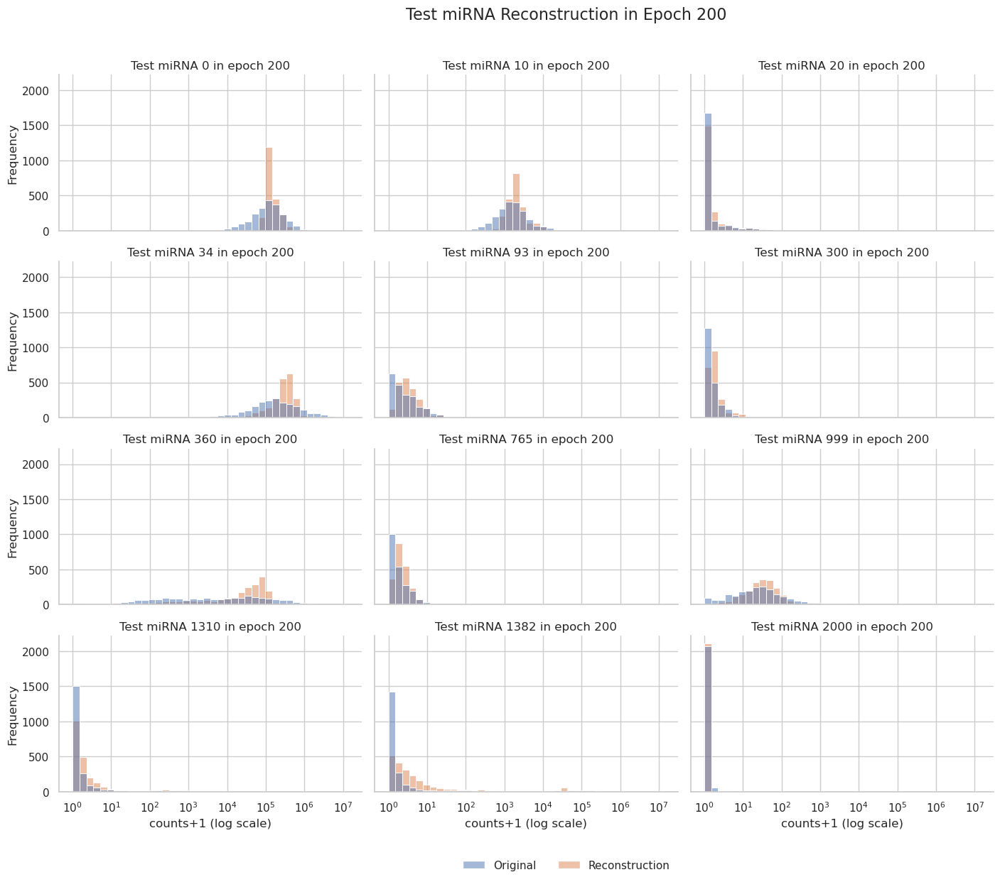

 53%|████████████████████████████████████████████▏                                       | 211/401 [15:48<14:16,  4.51s/it]

210 train_recon: 5.62302480870597 train_gmm: 2.183561570945019 train_mse: 82258.9609375 train_mae: 45.98794174194336 train_r2: 0.8195127248764038 train_spearman: 0.4791531562805176 train_pearson: 0.9053888916969299 train_expl_var: 0.8195127248764038 train_msle: 0.4516581892967224
210 test_recon: 5.525559500303247 test_gmm: 2.1797797645729653 test_mse: 1619093.25 test_mae: 178.52023315429688 test_r2: 0.8082990646362305 test_spearman: 0.47063523530960083 test_pearson: 0.8996352553367615 test_expl_var: 0.8082990050315857 test_msle: 1.1540603637695312


 55%|██████████████████████████████████████████████▎                                     | 221/401 [16:27<11:40,  3.89s/it]

220 train_recon: 5.6224194156549085 train_gmm: 2.183746059905895 train_mse: 80903.5625 train_mae: 45.42887878417969 train_r2: 0.8224866390228271 train_spearman: 0.47534608840942383 train_pearson: 0.9069809317588806 train_expl_var: 0.8224866390228271 train_msle: 0.4041770398616791
220 test_recon: 5.525157885290351 test_gmm: 2.179669655435817 test_mse: 1578919.75 test_mae: 172.02488708496094 test_r2: 0.8130555748939514 test_spearman: 0.468476265668869 test_pearson: 0.9020925760269165 test_expl_var: 0.8130555748939514 test_msle: 1.0477497577667236


 58%|████████████████████████████████████████████████▍                                   | 231/401 [17:06<11:06,  3.92s/it]

230 train_recon: 5.622215104814258 train_gmm: 2.184118376502861 train_mse: 80814.828125 train_mae: 45.4934196472168 train_r2: 0.8226813077926636 train_spearman: 0.480373740196228 train_pearson: 0.907127857208252 train_expl_var: 0.8226813077926636 train_msle: 0.420942097902298
230 test_recon: 5.526887697997813 test_gmm: 2.179853940155244 test_mse: 1581810.0 test_mae: 172.98704528808594 test_r2: 0.8127133846282959 test_spearman: 0.47214722633361816 test_pearson: 0.901889443397522 test_expl_var: 0.8127133846282959 test_msle: 1.0751793384552002


 60%|██████████████████████████████████████████████████▍                                 | 241/401 [17:45<10:23,  3.90s/it]

240 train_recon: 5.621451739640161 train_gmm: 2.1841579989741575 train_mse: 78488.109375 train_mae: 44.37226867675781 train_r2: 0.8277864456176758 train_spearman: 0.47424760460853577 train_pearson: 0.9098867177963257 train_expl_var: 0.8277864456176758 train_msle: 0.36752381920814514
240 test_recon: 5.526184131777839 test_gmm: 2.179724882961157 test_mse: 1598609.75 test_mae: 171.88555908203125 test_r2: 0.8107242584228516 test_spearman: 0.46722352504730225 test_pearson: 0.9006599187850952 test_expl_var: 0.8107242584228516 test_msle: 0.9762396812438965


 63%|████████████████████████████████████████████████████▌                               | 251/401 [18:24<09:43,  3.89s/it]

250 train_recon: 5.620974200322933 train_gmm: 2.184304544805936 train_mse: 81057.6015625 train_mae: 46.11000061035156 train_r2: 0.8221486806869507 train_spearman: 0.4829721748828888 train_pearson: 0.906924307346344 train_expl_var: 0.8221486806869507 train_msle: 0.49792757630348206
250 test_recon: 5.526854287134142 test_gmm: 2.179808266704479 test_mse: 1580810.125 test_mae: 174.81936645507812 test_r2: 0.8128317594528198 test_spearman: 0.4693661630153656 test_pearson: 0.9021629691123962 test_expl_var: 0.8128317594528198 test_msle: 1.2690261602401733


 65%|██████████████████████████████████████████████████████▋                             | 261/401 [19:04<09:10,  3.93s/it]

260 train_recon: 5.620477586552467 train_gmm: 2.184561060396406 train_mse: 78659.1953125 train_mae: 44.40464401245117 train_r2: 0.8274111151695251 train_spearman: 0.4732722342014313 train_pearson: 0.9096722602844238 train_expl_var: 0.8274110555648804 train_msle: 0.35784655809402466
260 test_recon: 5.527016285584097 test_gmm: 2.180032388655866 test_mse: 1540412.5 test_mae: 167.953857421875 test_r2: 0.8176148533821106 test_spearman: 0.46371370553970337 test_pearson: 0.9045073390007019 test_expl_var: 0.8176148533821106 test_msle: 0.9531348347663879


 68%|████████████████████████████████████████████████████████▊                           | 271/401 [19:43<08:30,  3.93s/it]

270 train_recon: 5.61994921406091 train_gmm: 2.184800965505997 train_mse: 79441.640625 train_mae: 45.20526123046875 train_r2: 0.8256943225860596 train_spearman: 0.4778960347175598 train_pearson: 0.908835232257843 train_expl_var: 0.8256943225860596 train_msle: 0.43582502007484436
270 test_recon: 5.527265223904399 test_gmm: 2.1797760252762735 test_mse: 1588328.25 test_mae: 173.2655029296875 test_r2: 0.8119416236877441 test_spearman: 0.4725167155265808 test_pearson: 0.9015493392944336 test_expl_var: 0.8119416236877441 test_msle: 1.1467043161392212


 70%|██████████████████████████████████████████████████████████▊                         | 281/401 [20:22<07:49,  3.92s/it]

280 train_recon: 5.619642906435564 train_gmm: 2.184981112474022 train_mse: 78480.140625 train_mae: 44.3757209777832 train_r2: 0.8278039693832397 train_spearman: 0.48034727573394775 train_pearson: 0.9098953008651733 train_expl_var: 0.8278039693832397 train_msle: 0.3479883670806885
280 test_recon: 5.526775046930045 test_gmm: 2.180688905380928 test_mse: 1530204.375 test_mae: 167.33213806152344 test_r2: 0.8188234567642212 test_spearman: 0.47121021151542664 test_pearson: 0.905249834060669 test_expl_var: 0.8188234567642212 test_msle: 0.8943613767623901


 73%|████████████████████████████████████████████████████████████▉                       | 291/401 [21:01<07:09,  3.90s/it]

290 train_recon: 5.619119437825455 train_gmm: 2.1851431275485984 train_mse: 80124.2109375 train_mae: 44.75004577636719 train_r2: 0.8241966366767883 train_spearman: 0.47395479679107666 train_pearson: 0.907887876033783 train_expl_var: 0.8241966366767883 train_msle: 0.34427788853645325
290 test_recon: 5.527631110780607 test_gmm: 2.180740240664337 test_mse: 1560274.0 test_mae: 168.87620544433594 test_r2: 0.8152632713317871 test_spearman: 0.46458569169044495 test_pearson: 0.9032626152038574 test_expl_var: 0.8152632117271423 test_msle: 0.9109014272689819


 75%|███████████████████████████████████████████████████████████████                     | 301/401 [21:40<06:30,  3.91s/it]

300 train_recon: 5.618728137048376 train_gmm: 2.185597226681412 train_mse: 77870.8515625 train_mae: 43.95463562011719 train_r2: 0.8291407823562622 train_spearman: 0.4763265550136566 train_pearson: 0.9105879068374634 train_expl_var: 0.8291407823562622 train_msle: 0.2967199683189392
300 test_recon: 5.527530383135814 test_gmm: 2.1811266746789006 test_mse: 1510776.75 test_mae: 165.01919555664062 test_r2: 0.8211237192153931 test_spearman: 0.46502527594566345 test_pearson: 0.9064289927482605 test_expl_var: 0.8211237192153931 test_msle: 0.774141788482666


 78%|█████████████████████████████████████████████████████████████████▏                  | 311/401 [22:19<05:50,  3.89s/it]

310 train_recon: 5.618479281849956 train_gmm: 2.1858846571752246 train_mse: 79442.5 train_mae: 44.771114349365234 train_r2: 0.8256924152374268 train_spearman: 0.48356613516807556 train_pearson: 0.9087404608726501 train_expl_var: 0.8256924152374268 train_msle: 0.3597339689731598
310 test_recon: 5.5276436029887765 test_gmm: 2.1802368707232507 test_mse: 1561813.625 test_mae: 167.8538360595703 test_r2: 0.8150809407234192 test_spearman: 0.47208088636398315 test_pearson: 0.9030847549438477 test_expl_var: 0.8150809407234192 test_msle: 0.9643915891647339


 80%|███████████████████████████████████████████████████████████████████▏                | 321/401 [22:58<05:11,  3.89s/it]

320 train_recon: 5.618066005101595 train_gmm: 2.1859463755021733 train_mse: 79231.953125 train_mae: 44.59674072265625 train_r2: 0.826154351234436 train_spearman: 0.4764609634876251 train_pearson: 0.9089751839637756 train_expl_var: 0.826154351234436 train_msle: 0.35803118348121643
320 test_recon: 5.527728636375414 test_gmm: 2.180467106196026 test_mse: 1535179.375 test_mae: 167.76597595214844 test_r2: 0.8182344436645508 test_spearman: 0.4672064185142517 test_pearson: 0.9049395322799683 test_expl_var: 0.8182344436645508 test_msle: 0.9360308647155762


 83%|█████████████████████████████████████████████████████████████████████▎              | 331/401 [23:38<04:35,  3.94s/it]

330 train_recon: 5.617674995266207 train_gmm: 2.1860877096562263 train_mse: 81634.46875 train_mae: 46.148006439208984 train_r2: 0.8208829164505005 train_spearman: 0.4854165017604828 train_pearson: 0.9062045216560364 train_expl_var: 0.8208829164505005 train_msle: 0.4999297857284546
330 test_recon: 5.528998428256911 test_gmm: 2.1810577921454186 test_mse: 1543031.5 test_mae: 171.37081909179688 test_r2: 0.8173047304153442 test_spearman: 0.47354212403297424 test_pearson: 0.9046860933303833 test_expl_var: 0.8173047304153442 test_msle: 1.2690109014511108


 85%|███████████████████████████████████████████████████████████████████████▍            | 341/401 [24:17<03:55,  3.92s/it]

340 train_recon: 5.617283999912081 train_gmm: 2.1864001880748924 train_mse: 79692.3984375 train_mae: 45.11613464355469 train_r2: 0.8251441121101379 train_spearman: 0.4827203154563904 train_pearson: 0.9084725975990295 train_expl_var: 0.8251441121101379 train_msle: 0.3941609263420105
340 test_recon: 5.527724876073292 test_gmm: 2.180878916255763 test_mse: 1578191.375 test_mae: 171.5092315673828 test_r2: 0.8131418228149414 test_spearman: 0.47148698568344116 test_pearson: 0.902121365070343 test_expl_var: 0.8131418228149414 test_msle: 1.0051755905151367


 88%|█████████████████████████████████████████████████████████████████████████▌          | 351/401 [24:56<03:17,  3.95s/it]

350 train_recon: 5.617286564411694 train_gmm: 2.1867122713121816 train_mse: 79962.0859375 train_mae: 45.239044189453125 train_r2: 0.8245523571968079 train_spearman: 0.472917377948761 train_pearson: 0.9081591963768005 train_expl_var: 0.8245523571968079 train_msle: 0.4188602566719055
350 test_recon: 5.529511319773354 test_gmm: 2.181864536830357 test_mse: 1529980.625 test_mae: 169.47708129882812 test_r2: 0.8188499808311462 test_spearman: 0.468296080827713 test_pearson: 0.9054112434387207 test_expl_var: 0.8188499808311462 test_msle: 1.0658671855926514


 90%|███████████████████████████████████████████████████████████████████████████▌        | 361/401 [25:45<02:46,  4.16s/it]

360 train_recon: 5.616892720198653 train_gmm: 2.1870318437010634 train_mse: 80063.3515625 train_mae: 45.01835250854492 train_r2: 0.82433021068573 train_spearman: 0.47869402170181274 train_pearson: 0.9079824090003967 train_expl_var: 0.8243301510810852 train_msle: 0.3726571202278137
360 test_recon: 5.529188987096792 test_gmm: 2.181314008297351 test_mse: 1519027.125 test_mae: 165.8575439453125 test_r2: 0.820146918296814 test_spearman: 0.46921306848526 test_pearson: 0.9060335755348206 test_expl_var: 0.8201468586921692 test_msle: 0.9683308005332947


 93%|█████████████████████████████████████████████████████████████████████████████▋      | 371/401 [26:32<02:38,  5.29s/it]

370 train_recon: 5.61637099855517 train_gmm: 2.1872085190757264 train_mse: 81165.359375 train_mae: 45.527931213378906 train_r2: 0.8219122290611267 train_spearman: 0.4817061424255371 train_pearson: 0.9066716432571411 train_expl_var: 0.8219122290611267 train_msle: 0.38230130076408386
370 test_recon: 5.5286733201192595 test_gmm: 2.181325331962639 test_mse: 1556664.625 test_mae: 169.98208618164062 test_r2: 0.8156905770301819 test_spearman: 0.4713134765625 test_pearson: 0.9036032557487488 test_expl_var: 0.8156905770301819 test_msle: 0.9667173624038696


 95%|███████████████████████████████████████████████████████████████████████████████▊    | 381/401 [27:14<01:23,  4.20s/it]

380 train_recon: 5.615880282607225 train_gmm: 2.1874930954024157 train_mse: 80101.21875 train_mae: 44.923492431640625 train_r2: 0.8242471218109131 train_spearman: 0.47822999954223633 train_pearson: 0.907922625541687 train_expl_var: 0.8242471218109131 train_msle: 0.3296963572502136
380 test_recon: 5.5281720781662536 test_gmm: 2.1817247606049657 test_mse: 1533153.375 test_mae: 167.99356079101562 test_r2: 0.8184743523597717 test_spearman: 0.4706586003303528 test_pearson: 0.9051148891448975 test_expl_var: 0.818474292755127 test_msle: 0.8666398525238037


 98%|█████████████████████████████████████████████████████████████████████████████████▉  | 391/401 [27:54<00:39,  3.94s/it]

390 train_recon: 5.615540816844417 train_gmm: 2.1879212347632926 train_mse: 81001.3828125 train_mae: 45.743125915527344 train_r2: 0.822272002696991 train_spearman: 0.48046359419822693 train_pearson: 0.9069328904151917 train_expl_var: 0.822272002696991 train_msle: 0.4610700309276581
390 test_recon: 5.529401696960096 test_gmm: 2.181977323223891 test_mse: 1592422.625 test_mae: 174.81472778320312 test_r2: 0.8114568591117859 test_spearman: 0.4694966971874237 test_pearson: 0.9014477729797363 test_expl_var: 0.8114567995071411 test_msle: 1.198734164237976


100%|███████████████████████████████████████████████████████████████████████████████████▊| 400/401 [28:29<00:03,  3.91s/it]

400 train_recon: 5.61544028793296 train_gmm: 2.1882677552348597 train_mse: 80630.234375 train_mae: 45.34397506713867 train_r2: 0.8230863809585571 train_spearman: 0.47573333978652954 train_pearson: 0.9073286652565002 train_expl_var: 0.8230863809585571 train_msle: 0.384836882352829
400 test_recon: 5.5284043689865445 test_gmm: 2.182148348877525 test_mse: 1545030.625 test_mae: 170.7710723876953 test_r2: 0.8170680999755859 test_spearman: 0.4690161943435669 test_pearson: 0.9044438004493713 test_expl_var: 0.8170680403709412 test_msle: 1.0180186033248901


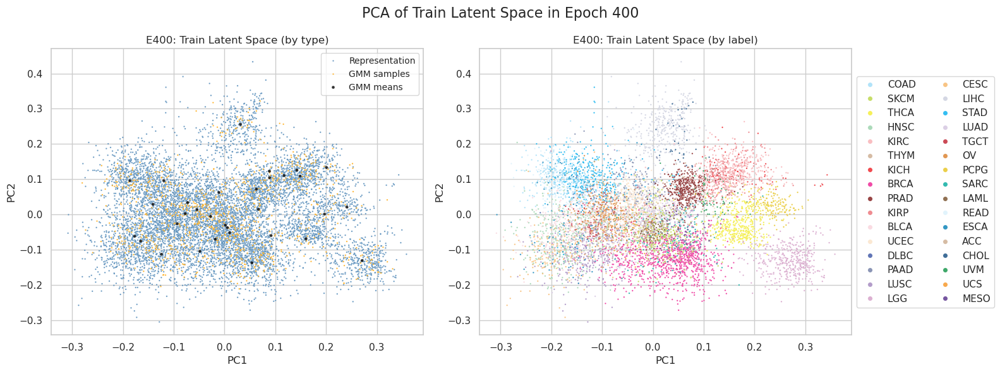

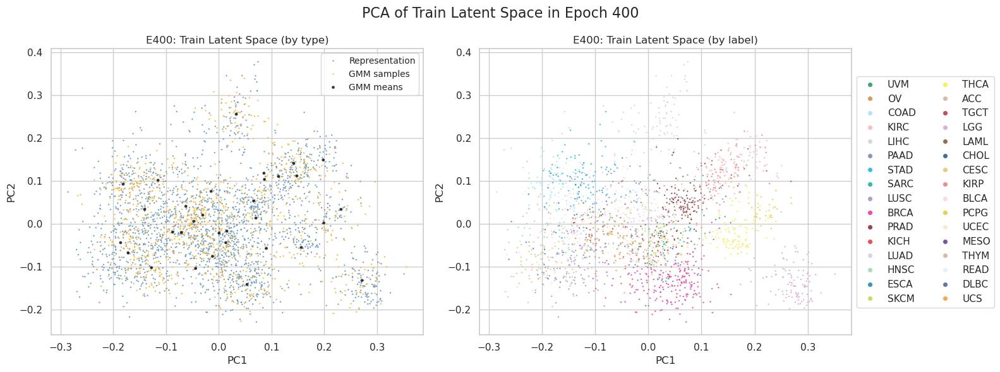

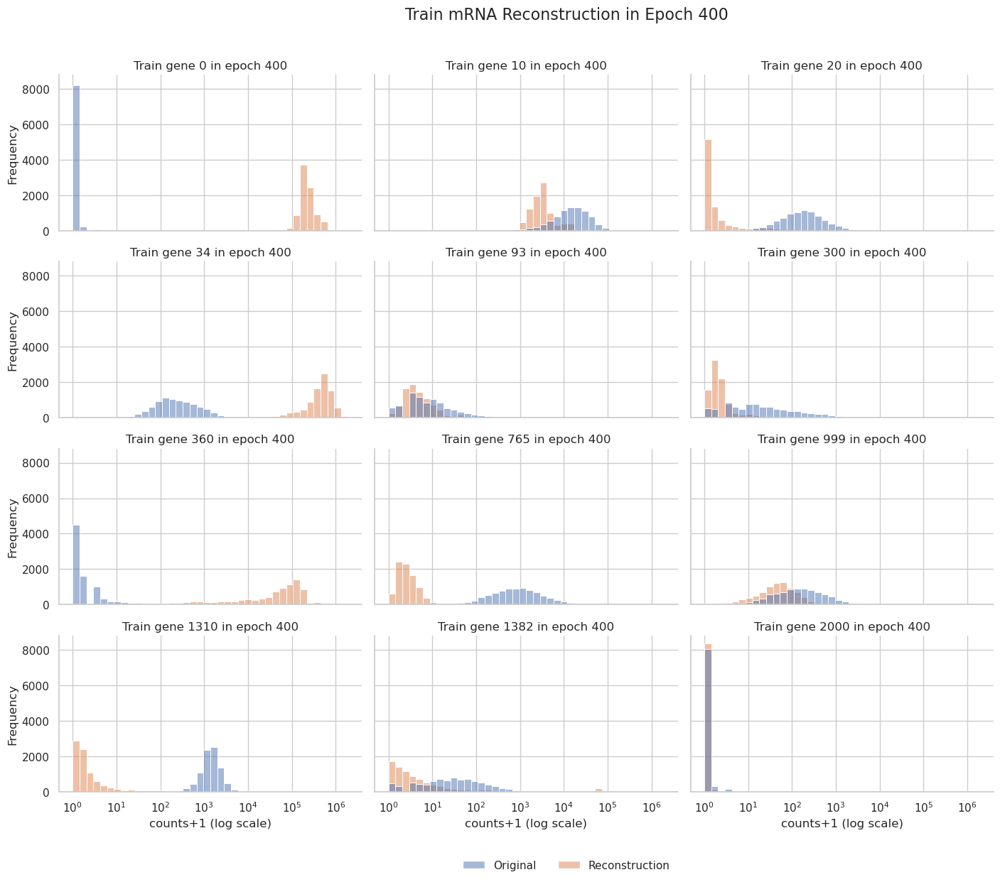

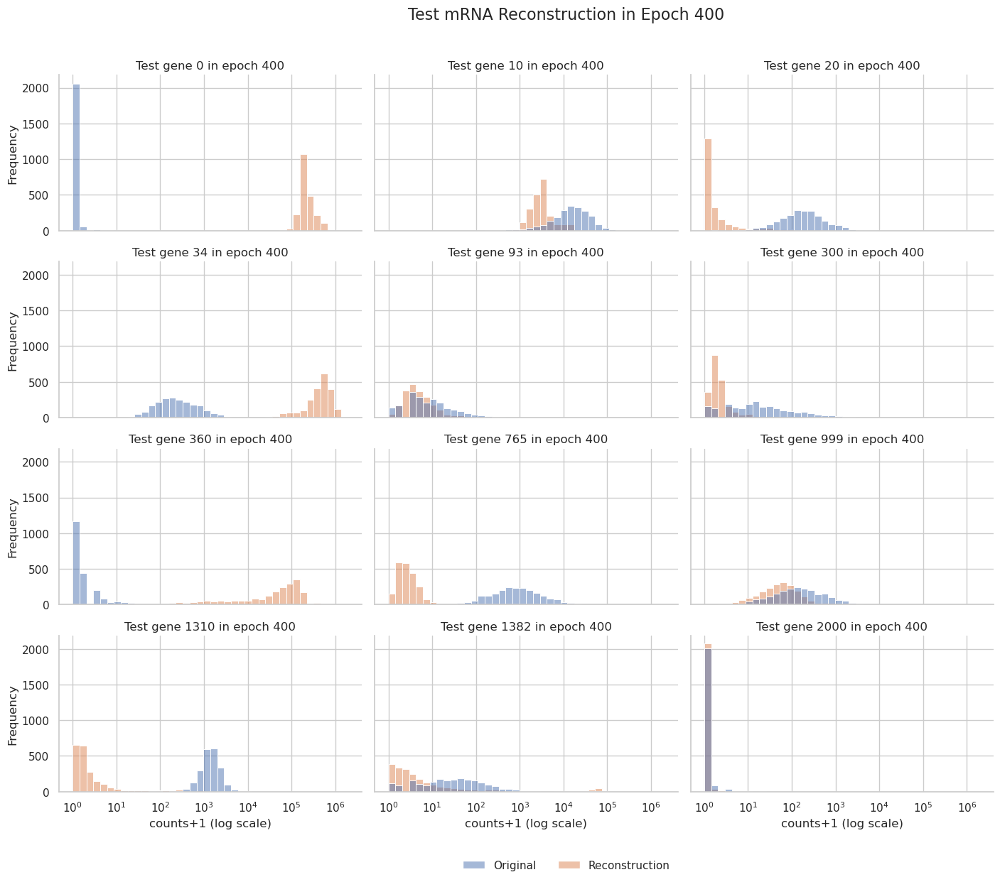

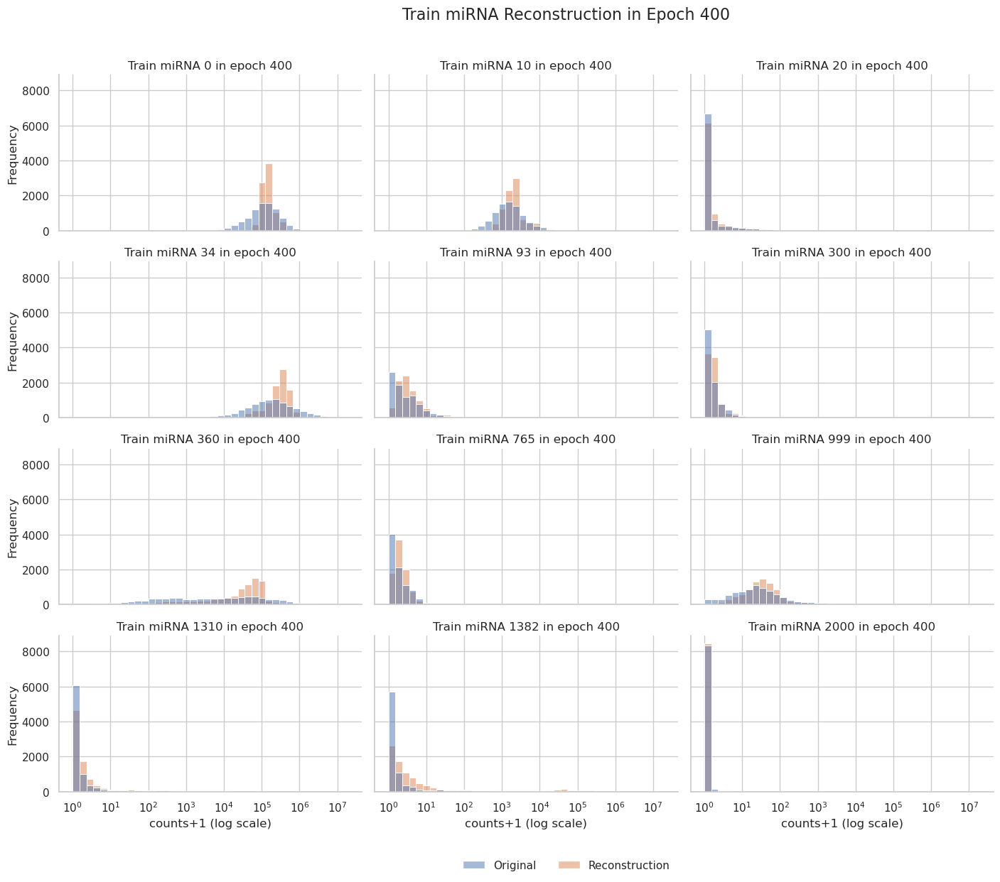

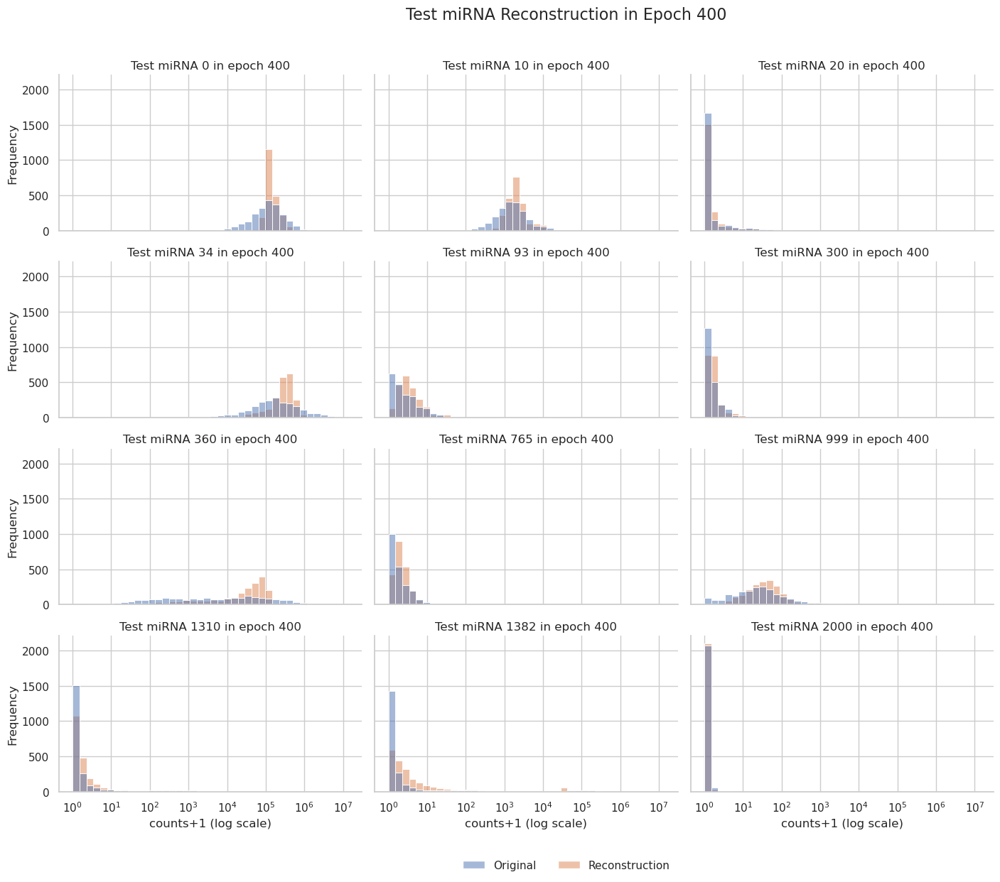

100%|████████████████████████████████████████████████████████████████████████████████████| 401/401 [29:45<00:00,  4.45s/it]


Fold 3 done...
Fold: 4...


  0%|                                                                                              | 0/401 [00:00<?, ?it/s]

0 train_recon: 7.363015086198203 train_gmm: 6.123683920242708 train_mse: 466157.3125 train_mae: 215.409423828125 train_r2: 0.04432040452957153 train_spearman: 0.24655430018901825 train_pearson: 0.22261889278888702 train_expl_var: 0.04432040452957153 train_msle: 18.56714630126953
0 test_recon: 6.994713278543168 test_gmm: 2.974696539492462 test_mse: 6413148.5 test_mae: 867.91015625 test_r2: 0.022751331329345703 test_spearman: 0.2088443785905838 test_pearson: 0.15087498724460602 test_expl_var: 0.022751331329345703 test_msle: 31.012231826782227


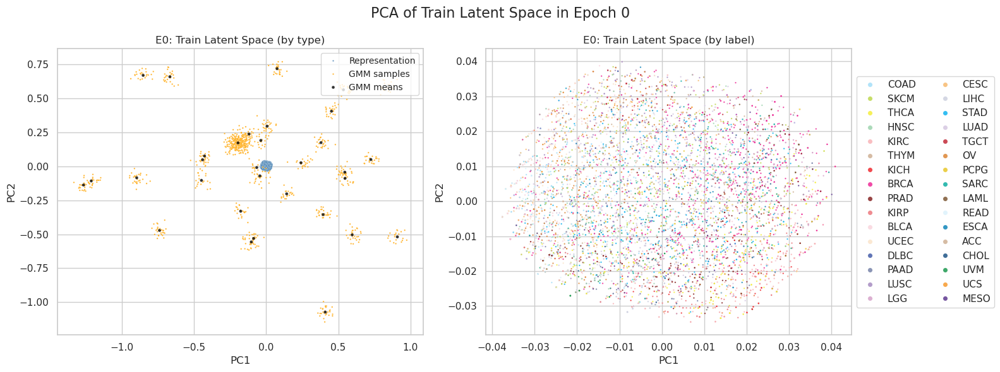

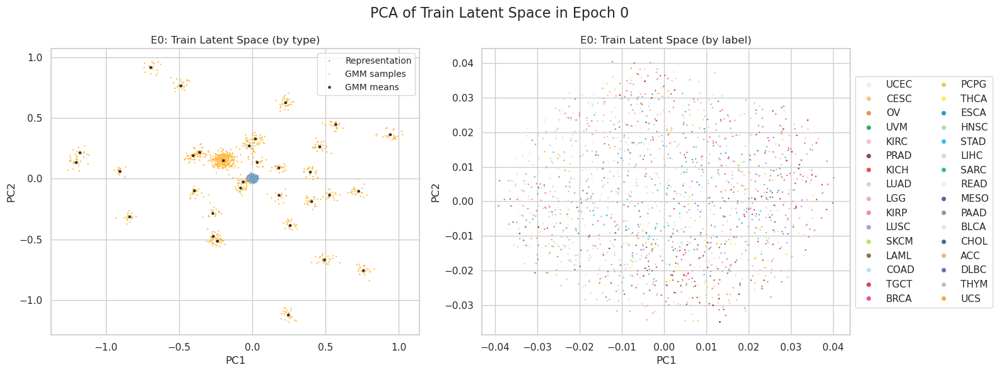

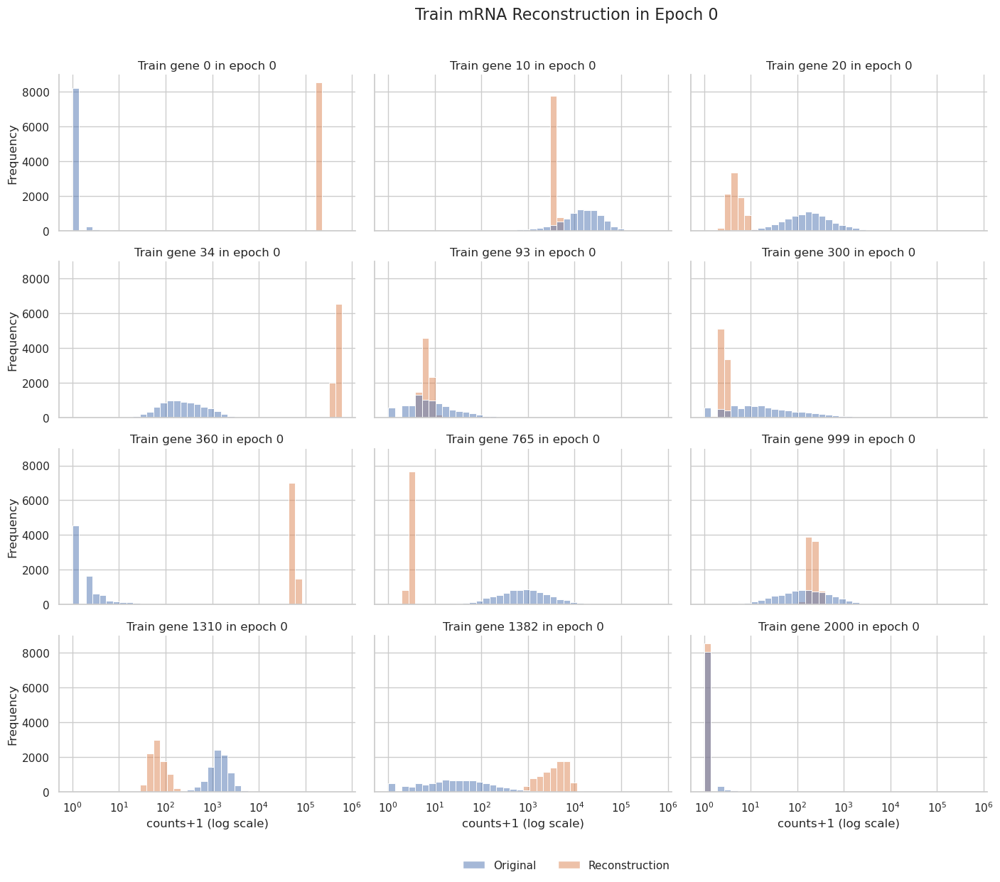

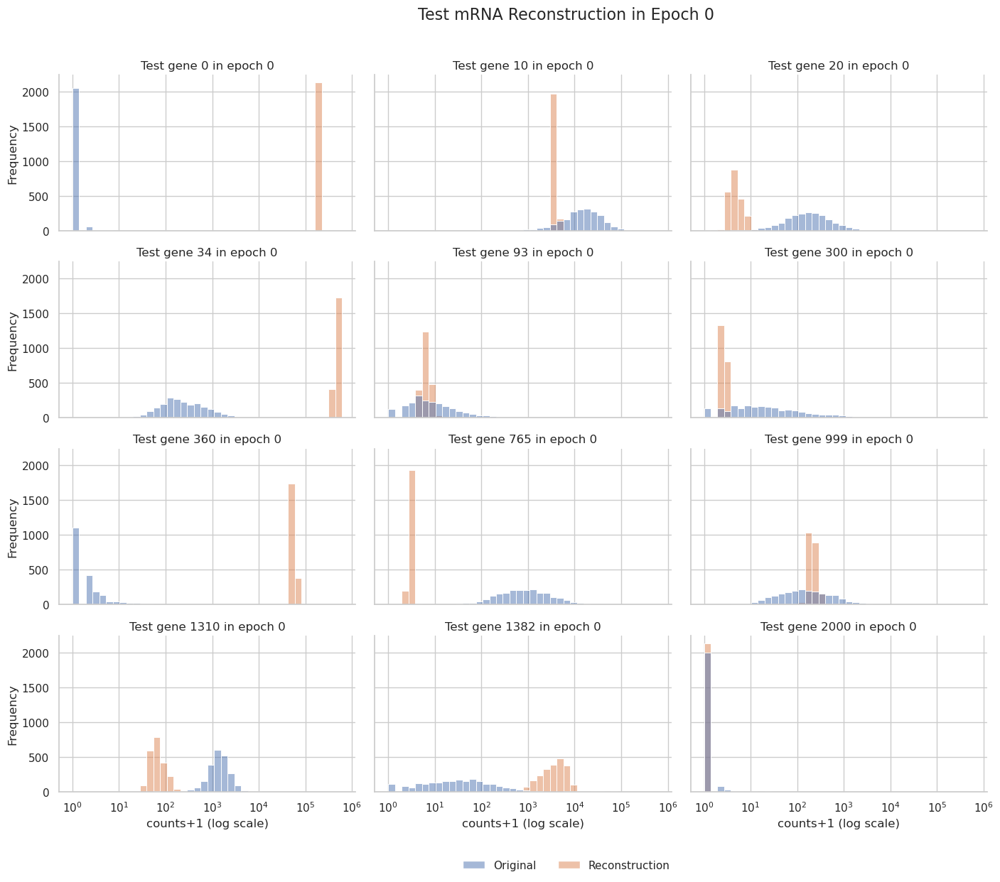

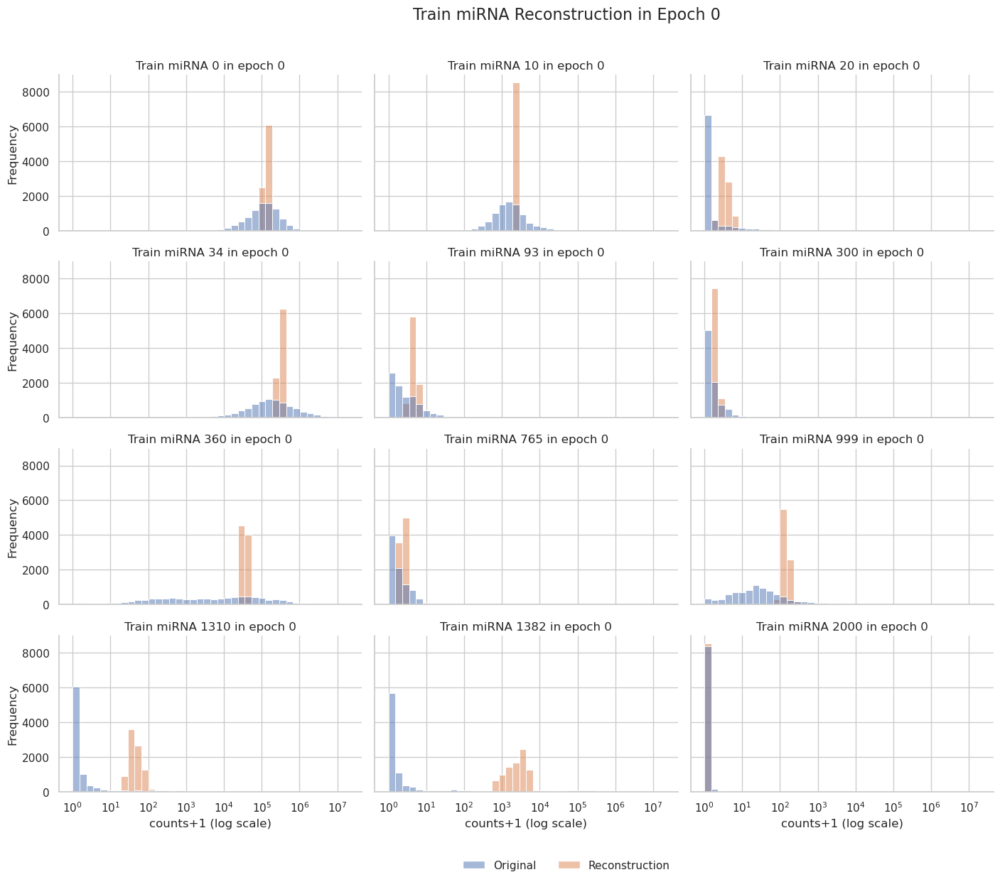

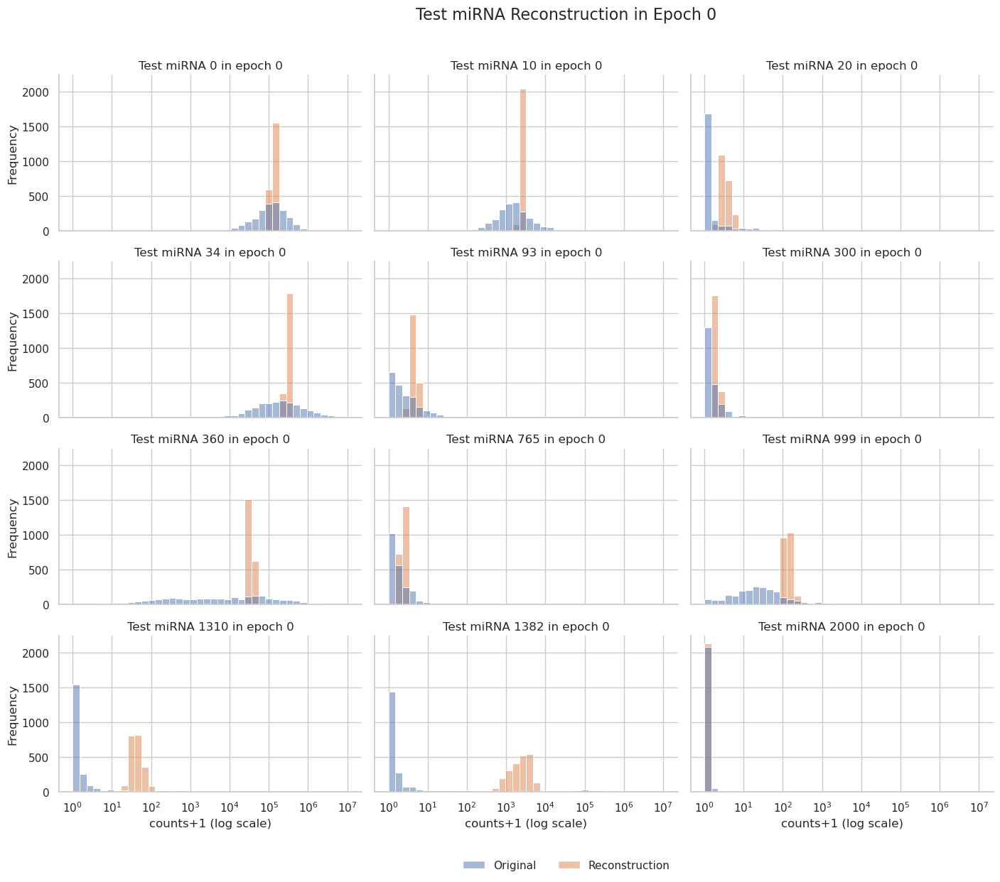

  3%|██▎                                                                                  | 11/401 [01:51<30:24,  4.68s/it]

10 train_recon: 5.751979930615699 train_gmm: 2.169664775570136 train_mse: 109358.9296875 train_mae: 55.07120132446289 train_r2: 0.7758008241653442 train_spearman: 0.47098684310913086 train_pearson: 0.8809759020805359 train_expl_var: 0.7758008241653442 train_msle: 1.096767783164978
10 test_recon: 5.589245093543045 test_gmm: 2.169770430625183 test_mse: 1130385.875 test_mae: 178.74349975585938 test_r2: 0.827749490737915 test_spearman: 0.45563846826553345 test_pearson: 0.9099242091178894 test_expl_var: 0.827749490737915 test_msle: 2.0816314220428467


  5%|████▍                                                                                | 21/401 [02:32<26:05,  4.12s/it]

20 train_recon: 5.6827845572721065 train_gmm: 2.1782760064505036 train_mse: 94423.8828125 train_mae: 47.35983657836914 train_r2: 0.8064194917678833 train_spearman: 0.48363059759140015 train_pearson: 0.8980303406715393 train_expl_var: 0.8064194917678833 train_msle: 0.6389954686164856
20 test_recon: 5.529100946521763 test_gmm: 2.177808188945404 test_mse: 1028214.8125 test_mae: 161.21762084960938 test_r2: 0.843318521976471 test_spearman: 0.45978277921676636 test_pearson: 0.9184065461158752 test_expl_var: 0.843318521976471 test_msle: 1.3640700578689575


  8%|██████▌                                                                              | 31/401 [03:13<25:24,  4.12s/it]

30 train_recon: 5.6566499378617 train_gmm: 2.181004149304412 train_mse: 90817.1484375 train_mae: 45.77233123779297 train_r2: 0.8138137459754944 train_spearman: 0.4856216609477997 train_pearson: 0.9021313190460205 train_expl_var: 0.8138136863708496 train_msle: 0.5681216716766357
30 test_recon: 5.509027853410994 test_gmm: 2.18130490019394 test_mse: 962180.75 test_mae: 151.798095703125 test_r2: 0.8533809185028076 test_spearman: 0.4585431218147278 test_pearson: 0.9238333106040955 test_expl_var: 0.8533809185028076 test_msle: 1.145676612854004


 10%|████████▋                                                                            | 41/401 [03:54<24:40,  4.11s/it]

40 train_recon: 5.643878633681367 train_gmm: 2.1821564724735376 train_mse: 91606.875 train_mae: 46.07252883911133 train_r2: 0.8121947050094604 train_spearman: 0.4818967282772064 train_pearson: 0.9012450575828552 train_expl_var: 0.8121947050094604 train_msle: 0.5583075881004333
40 test_recon: 5.5003457792662624 test_gmm: 2.18267792534214 test_mse: 959149.0 test_mae: 154.01400756835938 test_r2: 0.8538429141044617 test_spearman: 0.45478716492652893 test_pearson: 0.9241244196891785 test_expl_var: 0.8538429141044617 test_msle: 1.1373473405838013


 13%|██████████▊                                                                          | 51/401 [04:36<23:57,  4.11s/it]

50 train_recon: 5.636552482295026 train_gmm: 2.182979651003249 train_mse: 91544.859375 train_mae: 46.07588577270508 train_r2: 0.8123217821121216 train_spearman: 0.4855602979660034 train_pearson: 0.9013099670410156 train_expl_var: 0.8123218417167664 train_msle: 0.529295027256012
50 test_recon: 5.498923142163225 test_gmm: 2.182624423096275 test_mse: 970208.0625 test_mae: 155.50657653808594 test_r2: 0.852157711982727 test_spearman: 0.45513030886650085 test_pearson: 0.9231947660446167 test_expl_var: 0.852157711982727 test_msle: 1.0877506732940674


 15%|████████████▉                                                                        | 61/401 [05:17<23:22,  4.12s/it]

60 train_recon: 5.632105550443934 train_gmm: 2.183503833016388 train_mse: 90003.078125 train_mae: 44.96909713745117 train_r2: 0.8154826760292053 train_spearman: 0.4863537549972534 train_pearson: 0.903045117855072 train_expl_var: 0.8154826760292053 train_msle: 0.42433780431747437
60 test_recon: 5.497760292431428 test_gmm: 2.1831328287951 test_mse: 967165.0 test_mae: 154.24986267089844 test_r2: 0.8526214361190796 test_spearman: 0.46234968304634094 test_pearson: 0.9234052896499634 test_expl_var: 0.8526214361190796 test_msle: 0.8445322513580322


 18%|███████████████                                                                      | 71/401 [05:58<22:34,  4.11s/it]

70 train_recon: 5.629052817760011 train_gmm: 2.183374203520153 train_mse: 90649.984375 train_mae: 45.238895416259766 train_r2: 0.8141564130783081 train_spearman: 0.48886558413505554 train_pearson: 0.9023095965385437 train_expl_var: 0.8141564130783081 train_msle: 0.40793055295944214
70 test_recon: 5.499037783979175 test_gmm: 2.182462975816928 test_mse: 991068.8125 test_mae: 155.81936645507812 test_r2: 0.8489788770675659 test_spearman: 0.4606764018535614 test_pearson: 0.9214139580726624 test_expl_var: 0.8489788770675659 test_msle: 0.8505998849868774


 20%|█████████████████▏                                                                   | 81/401 [06:39<21:57,  4.12s/it]

80 train_recon: 5.627541653450542 train_gmm: 2.183205841961293 train_mse: 91829.09375 train_mae: 46.454444885253906 train_r2: 0.8117390871047974 train_spearman: 0.4860221743583679 train_pearson: 0.9010422229766846 train_expl_var: 0.8117390871047974 train_msle: 0.5222517848014832
80 test_recon: 5.498944250413791 test_gmm: 2.1824038832081563 test_mse: 1009301.375 test_mae: 159.6234893798828 test_r2: 0.8462005853652954 test_spearman: 0.45978063344955444 test_pearson: 0.9199864864349365 test_expl_var: 0.8462005853652954 test_msle: 1.0705151557922363


 23%|███████████████████▎                                                                 | 91/401 [07:20<21:15,  4.12s/it]

90 train_recon: 5.625399490588218 train_gmm: 2.1832699599610517 train_mse: 90914.921875 train_mae: 45.96134948730469 train_r2: 0.8136132955551147 train_spearman: 0.49099868535995483 train_pearson: 0.9020410776138306 train_expl_var: 0.8136132955551147 train_msle: 0.46314653754234314
90 test_recon: 5.499936159128402 test_gmm: 2.1824989436772726 test_mse: 995266.5625 test_mae: 156.5024871826172 test_r2: 0.8483392596244812 test_spearman: 0.46093305945396423 test_pearson: 0.9211069941520691 test_expl_var: 0.8483392596244812 test_msle: 0.9448444247245789


 25%|█████████████████████▏                                                              | 101/401 [08:01<20:31,  4.11s/it]

100 train_recon: 5.6237778579565685 train_gmm: 2.1833656181511425 train_mse: 90552.6171875 train_mae: 45.56048583984375 train_r2: 0.8143560290336609 train_spearman: 0.4899178743362427 train_pearson: 0.902439296245575 train_expl_var: 0.8143560290336609 train_msle: 0.3968670070171356
100 test_recon: 5.5010174619161445 test_gmm: 2.1818317508027483 test_mse: 986443.375 test_mae: 155.83421325683594 test_r2: 0.8496837615966797 test_spearman: 0.45833703875541687 test_pearson: 0.9218165278434753 test_expl_var: 0.8496837615966797 test_msle: 0.8424232602119446


 28%|███████████████████████▎                                                            | 111/401 [08:42<19:52,  4.11s/it]

110 train_recon: 5.622791410278579 train_gmm: 2.1834301320468916 train_mse: 90456.765625 train_mae: 45.134864807128906 train_r2: 0.8145525455474854 train_spearman: 0.48623910546302795 train_pearson: 0.902527391910553 train_expl_var: 0.8145525455474854 train_msle: 0.36958786845207214
110 test_recon: 5.50192620159559 test_gmm: 2.1814344776877195 test_mse: 996007.0 test_mae: 156.3959503173828 test_r2: 0.8482264280319214 test_spearman: 0.45601215958595276 test_pearson: 0.9210171103477478 test_expl_var: 0.8482264280319214 test_msle: 0.8075252175331116


 30%|█████████████████████████▎                                                          | 121/401 [09:24<19:12,  4.12s/it]

120 train_recon: 5.621789262281085 train_gmm: 2.183231379396532 train_mse: 92678.171875 train_mae: 46.489356994628906 train_r2: 0.8099983930587769 train_spearman: 0.4902222752571106 train_pearson: 0.9000491499900818 train_expl_var: 0.8099983930587769 train_msle: 0.4731694459915161
120 test_recon: 5.503236119165975 test_gmm: 2.1811118732961616 test_mse: 1006386.25 test_mae: 157.8452606201172 test_r2: 0.8466448187828064 test_spearman: 0.45951879024505615 test_pearson: 0.920208215713501 test_expl_var: 0.8466448187828064 test_msle: 0.999226987361908


 33%|███████████████████████████▍                                                        | 131/401 [10:05<18:28,  4.11s/it]

130 train_recon: 5.620713045268305 train_gmm: 2.1833611561031896 train_mse: 91529.25 train_mae: 45.59482192993164 train_r2: 0.8123538494110107 train_spearman: 0.4810578525066376 train_pearson: 0.9013148546218872 train_expl_var: 0.8123538494110107 train_msle: 0.413234680891037
130 test_recon: 5.503367871936539 test_gmm: 2.181224459574429 test_mse: 986928.75 test_mae: 155.47361755371094 test_r2: 0.8496097922325134 test_spearman: 0.44956570863723755 test_pearson: 0.9217697978019714 test_expl_var: 0.8496097922325134 test_msle: 0.9113399982452393


 35%|█████████████████████████████▌                                                      | 141/401 [10:46<17:57,  4.15s/it]

140 train_recon: 5.620075102292729 train_gmm: 2.1831960438928313 train_mse: 91987.171875 train_mae: 46.375125885009766 train_r2: 0.8114150166511536 train_spearman: 0.4869349002838135 train_pearson: 0.9008480906486511 train_expl_var: 0.8114150166511536 train_msle: 0.4797695577144623
140 test_recon: 5.504797344994975 test_gmm: 2.181024248538587 test_mse: 1002791.5 test_mae: 157.83399963378906 test_r2: 0.8471925854682922 test_spearman: 0.45604413747787476 test_pearson: 0.9204968810081482 test_expl_var: 0.8471925854682922 test_msle: 1.031952142715454


 38%|███████████████████████████████▋                                                    | 151/401 [11:27<17:06,  4.10s/it]

150 train_recon: 5.619508837607954 train_gmm: 2.1834557545211606 train_mse: 91229.609375 train_mae: 45.9434928894043 train_r2: 0.8129681348800659 train_spearman: 0.4838782548904419 train_pearson: 0.901698112487793 train_expl_var: 0.8129681348800659 train_msle: 0.444755882024765
150 test_recon: 5.505663562714572 test_gmm: 2.1809636550653178 test_mse: 1012330.0 test_mae: 159.17880249023438 test_r2: 0.8457390666007996 test_spearman: 0.45349735021591187 test_pearson: 0.91971755027771 test_expl_var: 0.8457390666007996 test_msle: 0.9249666929244995


 40%|█████████████████████████████████▋                                                  | 161/401 [12:08<16:24,  4.10s/it]

160 train_recon: 5.618666902379463 train_gmm: 2.183424771014902 train_mse: 91878.9609375 train_mae: 46.08497619628906 train_r2: 0.8116368651390076 train_spearman: 0.49157682061195374 train_pearson: 0.9009524583816528 train_expl_var: 0.8116368651390076 train_msle: 0.4500845968723297
160 test_recon: 5.5082643856835505 test_gmm: 2.18120403066452 test_mse: 1005729.4375 test_mae: 158.26986694335938 test_r2: 0.8467448949813843 test_spearman: 0.46648702025413513 test_pearson: 0.9202467203140259 test_expl_var: 0.8467448949813843 test_msle: 0.9388952851295471


 43%|███████████████████████████████████▊                                                | 171/401 [12:49<15:45,  4.11s/it]

170 train_recon: 5.61828161527499 train_gmm: 2.18347037265904 train_mse: 91243.453125 train_mae: 45.43779754638672 train_r2: 0.8129397630691528 train_spearman: 0.48262089490890503 train_pearson: 0.9016425609588623 train_expl_var: 0.8129397630691528 train_msle: 0.3595435917377472
170 test_recon: 5.5080364081509865 test_gmm: 2.1814261886275066 test_mse: 1001002.0625 test_mae: 157.3528289794922 test_r2: 0.8474652767181396 test_spearman: 0.4525282084941864 test_pearson: 0.9205934405326843 test_expl_var: 0.8474652767181396 test_msle: 0.797332763671875


 45%|█████████████████████████████████████▉                                              | 181/401 [13:30<15:01,  4.10s/it]

180 train_recon: 5.617753939200422 train_gmm: 2.1834192513386714 train_mse: 94720.4921875 train_mae: 47.42556381225586 train_r2: 0.8058114051818848 train_spearman: 0.4884636402130127 train_pearson: 0.8977713584899902 train_expl_var: 0.8058114051818848 train_msle: 0.5161290168762207
180 test_recon: 5.508005335626451 test_gmm: 2.1806380446565794 test_mse: 1036581.25 test_mae: 161.57711791992188 test_r2: 0.8420436382293701 test_spearman: 0.4609789252281189 test_pearson: 0.91771000623703 test_expl_var: 0.8420436382293701 test_msle: 1.0697358846664429


 48%|████████████████████████████████████████                                            | 191/401 [14:12<14:39,  4.19s/it]

190 train_recon: 5.617441638966121 train_gmm: 2.1835075325715207 train_mse: 94175.8125 train_mae: 46.527565002441406 train_r2: 0.8069280385971069 train_spearman: 0.4868742525577545 train_pearson: 0.8982982039451599 train_expl_var: 0.8069280385971069 train_msle: 0.36182066798210144
190 test_recon: 5.509069869784002 test_gmm: 2.181009408562189 test_mse: 1027739.75 test_mae: 158.16392517089844 test_r2: 0.843390941619873 test_spearman: 0.45752400159835815 test_pearson: 0.9183711409568787 test_expl_var: 0.843390941619873 test_msle: 0.7708892822265625


 50%|█████████████████████████████████████████▉                                          | 200/401 [14:49<13:51,  4.13s/it]

200 train_recon: 5.616661662469576 train_gmm: 2.1837452831208015 train_mse: 93054.8359375 train_mae: 46.52262496948242 train_r2: 0.8092261552810669 train_spearman: 0.48609817028045654 train_pearson: 0.8995972871780396 train_expl_var: 0.8092261552810669 train_msle: 0.4223884344100952
200 test_recon: 5.5101028679624156 test_gmm: 2.1809678174628586 test_mse: 1048373.3125 test_mae: 161.18775939941406 test_r2: 0.8402467370033264 test_spearman: 0.46165984869003296 test_pearson: 0.9166792631149292 test_expl_var: 0.8402467370033264 test_msle: 0.8745646476745605


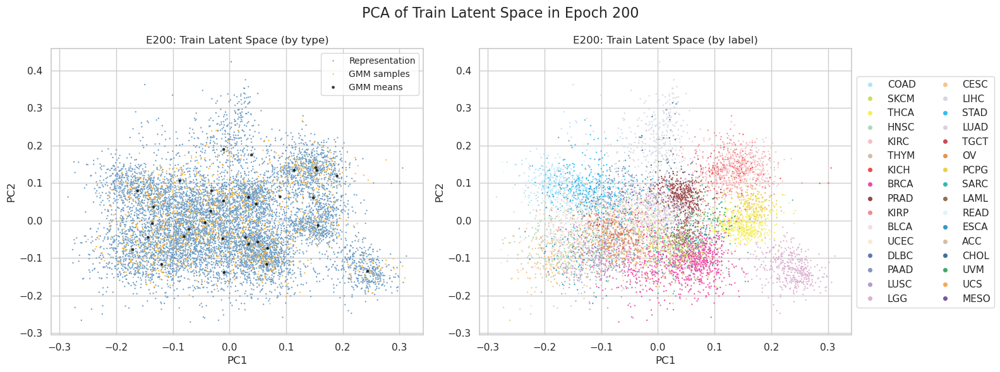

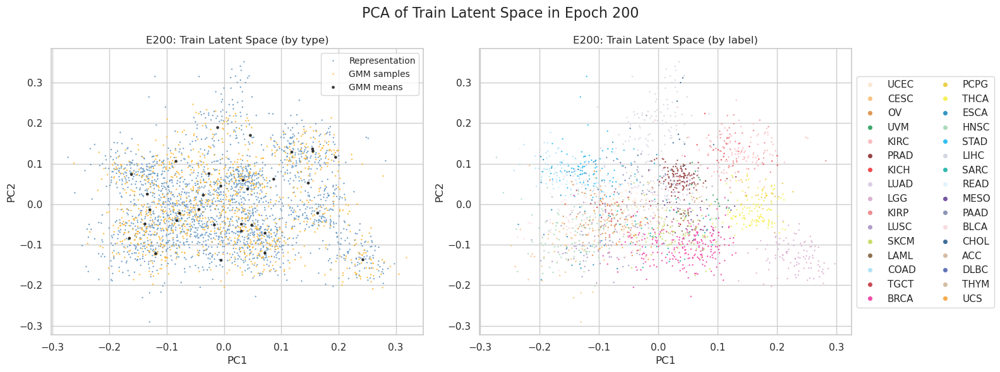

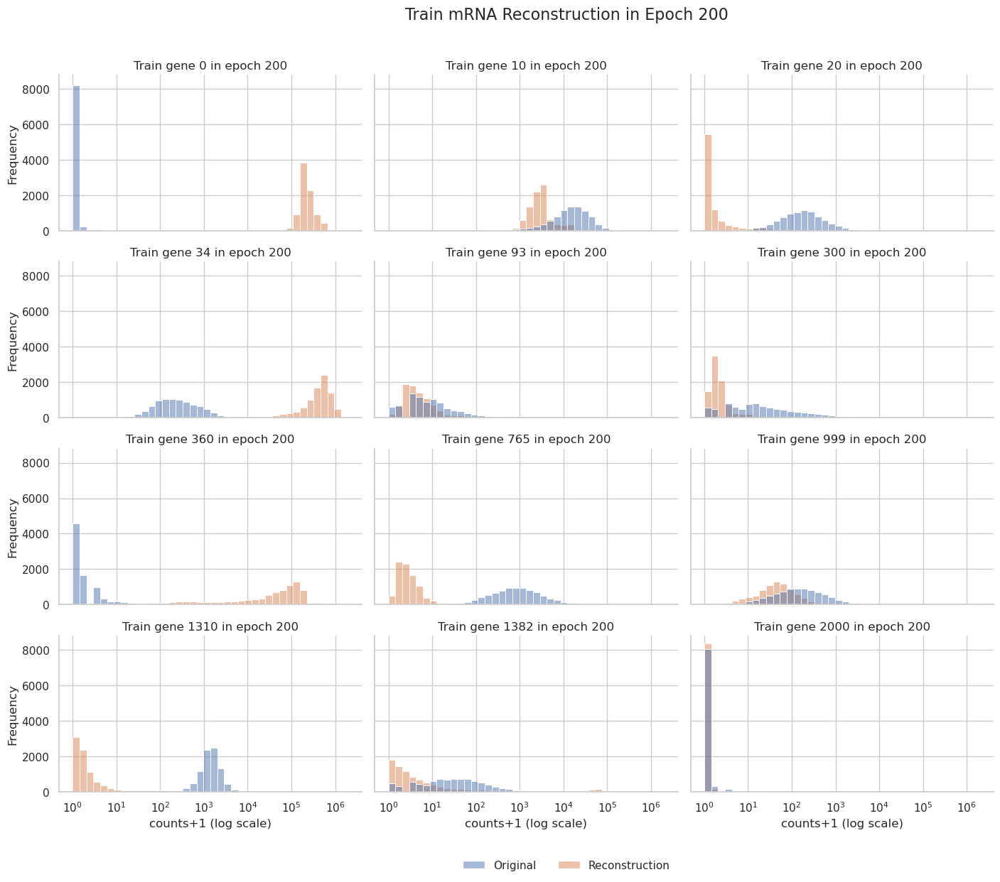

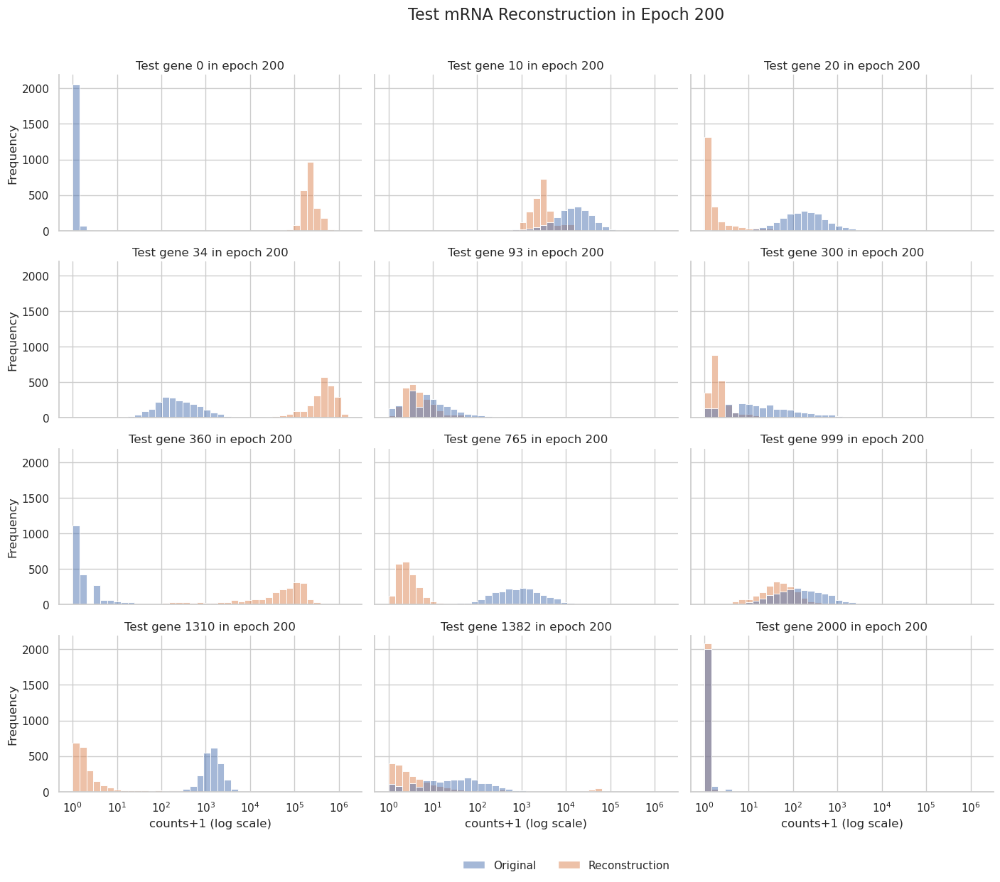

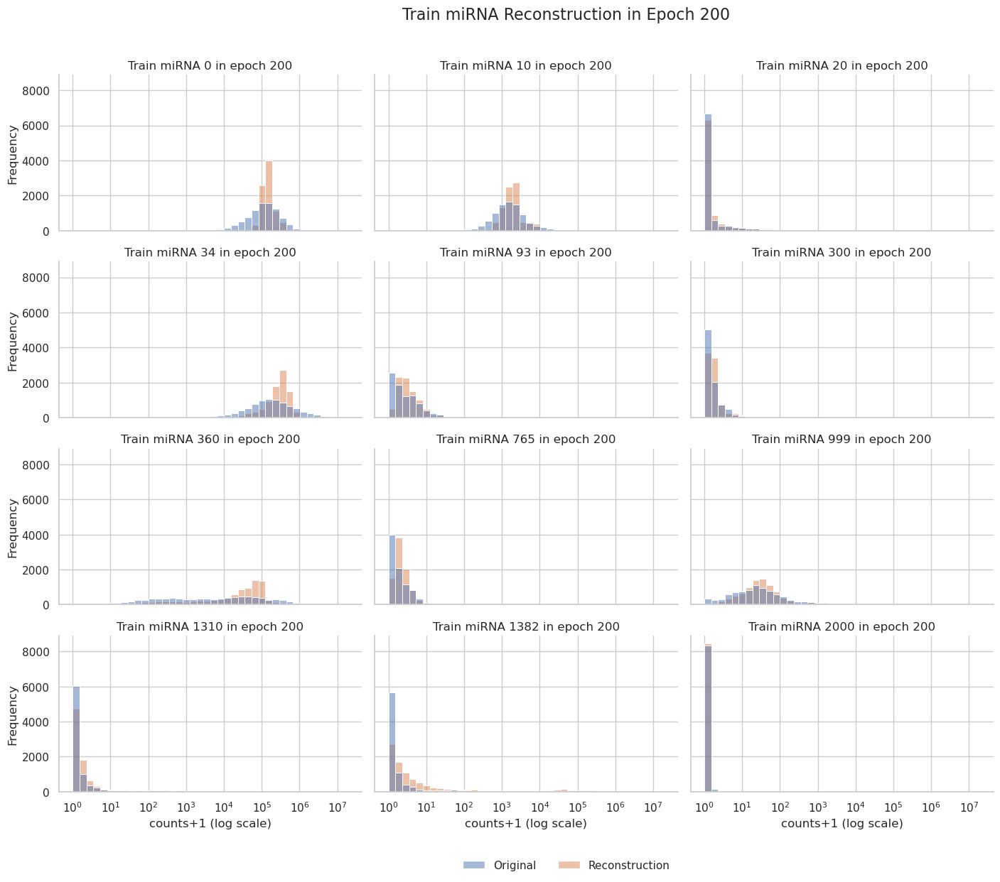

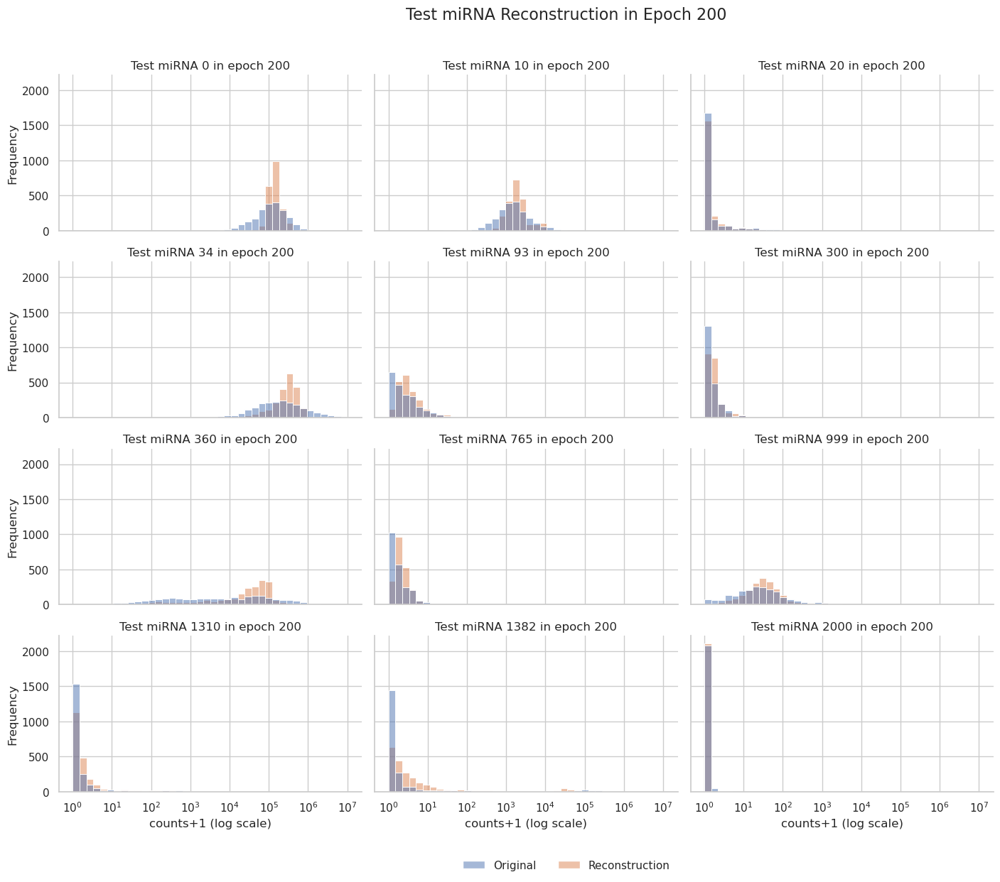

 53%|████████████████████████████████████████████▏                                       | 211/401 [16:46<15:01,  4.75s/it]

210 train_recon: 5.6162657908800435 train_gmm: 2.184168529521664 train_mse: 92293.1875 train_mae: 45.65571975708008 train_r2: 0.8107876777648926 train_spearman: 0.48371651768684387 train_pearson: 0.900439977645874 train_expl_var: 0.8107876777648926 train_msle: 0.3323885500431061
210 test_recon: 5.50915352333989 test_gmm: 2.1815098653967544 test_mse: 1018399.1875 test_mae: 157.7066192626953 test_r2: 0.8448142409324646 test_spearman: 0.4600541591644287 test_pearson: 0.919142484664917 test_expl_var: 0.8448142409324646 test_msle: 0.7186374068260193


 55%|██████████████████████████████████████████████▎                                     | 221/401 [17:27<12:27,  4.15s/it]

220 train_recon: 5.616025316382107 train_gmm: 2.1842398165260763 train_mse: 94949.21875 train_mae: 46.846343994140625 train_r2: 0.805342435836792 train_spearman: 0.4811159372329712 train_pearson: 0.8974320888519287 train_expl_var: 0.805342435836792 train_msle: 0.40822818875312805
220 test_recon: 5.510864576668979 test_gmm: 2.181266715342323 test_mse: 1032891.375 test_mae: 160.6907501220703 test_r2: 0.8426058888435364 test_spearman: 0.45942452549934387 test_pearson: 0.9179865717887878 test_expl_var: 0.8426058888435364 test_msle: 0.8628131747245789


 58%|████████████████████████████████████████████████▍                                   | 231/401 [18:09<11:43,  4.14s/it]

230 train_recon: 5.615705736023132 train_gmm: 2.1842943458391875 train_mse: 94281.171875 train_mae: 46.51583480834961 train_r2: 0.8067120313644409 train_spearman: 0.48410385847091675 train_pearson: 0.898175060749054 train_expl_var: 0.8067120313644409 train_msle: 0.38333478569984436
230 test_recon: 5.511263258224897 test_gmm: 2.1809253858794095 test_mse: 1041514.4375 test_mae: 158.34835815429688 test_r2: 0.8412919044494629 test_spearman: 0.4574221670627594 test_pearson: 0.9172197580337524 test_expl_var: 0.8412919044494629 test_msle: 0.8157704472541809


 60%|██████████████████████████████████████████████████▍                                 | 241/401 [18:50<10:58,  4.12s/it]

240 train_recon: 5.61523877592505 train_gmm: 2.1844409688492457 train_mse: 94427.0703125 train_mae: 46.66377639770508 train_r2: 0.806412935256958 train_spearman: 0.4824361801147461 train_pearson: 0.8980166912078857 train_expl_var: 0.806412935256958 train_msle: 0.38908979296684265
240 test_recon: 5.509869023515897 test_gmm: 2.1815827688176963 test_mse: 1029257.625 test_mae: 159.17446899414062 test_r2: 0.8431596159934998 test_spearman: 0.4578751027584076 test_pearson: 0.9182534217834473 test_expl_var: 0.8431596159934998 test_msle: 0.8073570132255554


 63%|████████████████████████████████████████████████████▌                               | 251/401 [19:31<10:22,  4.15s/it]

250 train_recon: 5.6148507031526185 train_gmm: 2.1845080832242547 train_mse: 96264.03125 train_mae: 47.3430061340332 train_r2: 0.8026469349861145 train_spearman: 0.48438313603401184 train_pearson: 0.8959278464317322 train_expl_var: 0.8026469349861145 train_msle: 0.4188900291919708
250 test_recon: 5.51193164929379 test_gmm: 2.1815717967835186 test_mse: 1037360.5625 test_mae: 160.79367065429688 test_r2: 0.8419249057769775 test_spearman: 0.4622954726219177 test_pearson: 0.917598307132721 test_expl_var: 0.8419249057769775 test_msle: 0.8803166151046753


 65%|██████████████████████████████████████████████████████▋                             | 261/401 [20:13<09:40,  4.15s/it]

260 train_recon: 5.614320562630784 train_gmm: 2.1847528091178763 train_mse: 95715.484375 train_mae: 47.67643356323242 train_r2: 0.8037715554237366 train_spearman: 0.483519971370697 train_pearson: 0.8965681791305542 train_expl_var: 0.8037714958190918 train_msle: 0.43541380763053894
260 test_recon: 5.512564280626818 test_gmm: 2.182057879624378 test_mse: 1052628.875 test_mae: 161.44944763183594 test_r2: 0.8395982384681702 test_spearman: 0.4588044583797455 test_pearson: 0.9163305163383484 test_expl_var: 0.8395982384681702 test_msle: 0.8828802704811096


 68%|████████████████████████████████████████████████████████▊                           | 271/401 [20:54<08:56,  4.12s/it]

270 train_recon: 5.614175079936822 train_gmm: 2.184969727248529 train_mse: 95723.265625 train_mae: 47.22157669067383 train_r2: 0.8037555813789368 train_spearman: 0.4849376976490021 train_pearson: 0.8965364098548889 train_expl_var: 0.8037555813789368 train_msle: 0.3767208158969879
270 test_recon: 5.512312324585066 test_gmm: 2.1817444004889675 test_mse: 1053620.875 test_mae: 160.3101043701172 test_r2: 0.8394470810890198 test_spearman: 0.4604053199291229 test_pearson: 0.9162176251411438 test_expl_var: 0.8394470810890198 test_msle: 0.794069766998291


 70%|██████████████████████████████████████████████████████████▊                         | 281/401 [21:36<08:15,  4.13s/it]

280 train_recon: 5.624042575401318 train_gmm: 2.185251563746286 train_mse: 95480.0546875 train_mae: 46.80339813232422 train_r2: 0.8042541742324829 train_spearman: 0.4818899631500244 train_pearson: 0.8968022465705872 train_expl_var: 0.8042541742324829 train_msle: 0.3622822165489197
280 test_recon: 5.515610678331117 test_gmm: 2.182010962600172 test_mse: 1020716.9375 test_mae: 157.98916625976562 test_r2: 0.8444610834121704 test_spearman: 0.4622218906879425 test_pearson: 0.918947696685791 test_expl_var: 0.8444610834121704 test_msle: 0.7534237504005432


 73%|████████████████████████████████████████████████████████████▉                       | 291/401 [22:17<07:32,  4.12s/it]

290 train_recon: 5.614637037417587 train_gmm: 2.1855356948686393 train_mse: 97918.15625 train_mae: 48.0595588684082 train_r2: 0.7992557883262634 train_spearman: 0.48619544506073 train_pearson: 0.8940332531929016 train_expl_var: 0.7992557883262634 train_msle: 0.44573745131492615
290 test_recon: 5.512478852250462 test_gmm: 2.182241965657933 test_mse: 1067473.375 test_mae: 162.8716278076172 test_r2: 0.8373362421989441 test_spearman: 0.4610811471939087 test_pearson: 0.9150848388671875 test_expl_var: 0.8373362421989441 test_msle: 0.9480206966400146


 75%|███████████████████████████████████████████████████████████████                     | 301/401 [22:58<06:52,  4.13s/it]

300 train_recon: 5.6136609227773135 train_gmm: 2.186115217996054 train_mse: 96642.4296875 train_mae: 47.65576934814453 train_r2: 0.8018711805343628 train_spearman: 0.48393961787223816 train_pearson: 0.8954935669898987 train_expl_var: 0.8018711805343628 train_msle: 0.4129393994808197
300 test_recon: 5.512595458481946 test_gmm: 2.182723370089743 test_mse: 1053058.25 test_mae: 161.77490234375 test_r2: 0.8395328521728516 test_spearman: 0.4585924446582794 test_pearson: 0.9162998199462891 test_expl_var: 0.8395328521728516 test_msle: 0.8759450912475586


 78%|█████████████████████████████████████████████████████████████████▏                  | 311/401 [23:39<06:11,  4.13s/it]

310 train_recon: 5.613350369509639 train_gmm: 2.1864206774789436 train_mse: 98312.2734375 train_mae: 48.02405548095703 train_r2: 0.7984477877616882 train_spearman: 0.48126521706581116 train_pearson: 0.8935658931732178 train_expl_var: 0.7984477877616882 train_msle: 0.3977403938770294
310 test_recon: 5.513123433339112 test_gmm: 2.183054622319599 test_mse: 1068178.25 test_mae: 161.36180114746094 test_r2: 0.8372287750244141 test_spearman: 0.45557352900505066 test_pearson: 0.9150128364562988 test_expl_var: 0.8372288346290588 test_msle: 0.8474833369255066


 80%|███████████████████████████████████████████████████████████████████▏                | 321/401 [24:20<05:29,  4.12s/it]

320 train_recon: 5.612781840482289 train_gmm: 2.1866083500438602 train_mse: 97310.53125 train_mae: 47.477352142333984 train_r2: 0.8005014657974243 train_spearman: 0.48827826976776123 train_pearson: 0.8947086930274963 train_expl_var: 0.8005014657974243 train_msle: 0.36360636353492737
320 test_recon: 5.5134574155791105 test_gmm: 2.1825390625 test_mse: 1061950.125 test_mae: 160.08197021484375 test_r2: 0.8381778597831726 test_spearman: 0.46171215176582336 test_pearson: 0.915520966053009 test_expl_var: 0.8381778597831726 test_msle: 0.7775176167488098


 83%|█████████████████████████████████████████████████████████████████████▎              | 331/401 [25:02<04:49,  4.14s/it]

330 train_recon: 5.612626897575686 train_gmm: 2.186841051847339 train_mse: 98337.8046875 train_mae: 48.248477935791016 train_r2: 0.7983954548835754 train_spearman: 0.4838704466819763 train_pearson: 0.8935542106628418 train_expl_var: 0.7983954548835754 train_msle: 0.43403545022010803
330 test_recon: 5.513407831203092 test_gmm: 2.183570413701149 test_mse: 1063552.5 test_mae: 161.51483154296875 test_r2: 0.8379336595535278 test_spearman: 0.4538488984107971 test_pearson: 0.9153945446014404 test_expl_var: 0.8379336595535278 test_msle: 0.9461861252784729


 85%|███████████████████████████████████████████████████████████████████████▍            | 341/401 [25:43<04:08,  4.13s/it]

340 train_recon: 5.612324740806234 train_gmm: 2.1870726838741072 train_mse: 97358.2109375 train_mae: 47.789947509765625 train_r2: 0.8004037141799927 train_spearman: 0.4898366928100586 train_pearson: 0.894672155380249 train_expl_var: 0.8004037141799927 train_msle: 0.4458560645580292
340 test_recon: 5.51427845700795 test_gmm: 2.183274448939732 test_mse: 1073574.5 test_mae: 162.93280029296875 test_r2: 0.8364065289497375 test_spearman: 0.46345075964927673 test_pearson: 0.9145688414573669 test_expl_var: 0.8364065289497375 test_msle: 0.9402905106544495


 88%|█████████████████████████████████████████████████████████████████████████▌          | 351/401 [26:24<03:27,  4.14s/it]

350 train_recon: 5.611760524561603 train_gmm: 2.1871853298611112 train_mse: 98123.59375 train_mae: 47.84971618652344 train_r2: 0.7988346219062805 train_spearman: 0.48705336451530457 train_pearson: 0.8937787413597107 train_expl_var: 0.7988346219062805 train_msle: 0.3749637007713318
350 test_recon: 5.514085628293819 test_gmm: 2.1829740644897173 test_mse: 1075589.375 test_mae: 162.80162048339844 test_r2: 0.8360995054244995 test_spearman: 0.45874345302581787 test_pearson: 0.91438889503479 test_expl_var: 0.8360995054244995 test_msle: 0.8093851804733276


 90%|███████████████████████████████████████████████████████████████████████████▌        | 361/401 [27:06<02:48,  4.20s/it]

360 train_recon: 5.611585436904953 train_gmm: 2.1874217040644024 train_mse: 98851.8125 train_mae: 48.074405670166016 train_r2: 0.7973417043685913 train_spearman: 0.481995165348053 train_pearson: 0.8929404616355896 train_expl_var: 0.7973417043685913 train_msle: 0.3895932734012604
360 test_recon: 5.515499891614821 test_gmm: 2.1829978953591556 test_mse: 1076417.75 test_mae: 161.7028045654297 test_r2: 0.8359732627868652 test_spearman: 0.4520491659641266 test_pearson: 0.9143170118331909 test_expl_var: 0.8359732627868652 test_msle: 0.8247258067131042


 93%|█████████████████████████████████████████████████████████████████████████████▋      | 371/401 [27:49<02:07,  4.26s/it]

370 train_recon: 5.611527714599987 train_gmm: 2.1876947765397237 train_mse: 98578.2734375 train_mae: 48.069889068603516 train_r2: 0.7979024648666382 train_spearman: 0.48920002579689026 train_pearson: 0.8932579755783081 train_expl_var: 0.7979024648666382 train_msle: 0.38983339071273804
370 test_recon: 5.515203733590284 test_gmm: 2.1833158985289813 test_mse: 1090168.125 test_mae: 163.7677001953125 test_r2: 0.8338779211044312 test_spearman: 0.45817118883132935 test_pearson: 0.9131797552108765 test_expl_var: 0.8338779211044312 test_msle: 0.8390970826148987


 95%|███████████████████████████████████████████████████████████████████████████████▊    | 381/401 [28:31<01:22,  4.15s/it]

380 train_recon: 5.6112453300172405 train_gmm: 2.187827787587995 train_mse: 98197.4609375 train_mae: 47.67983627319336 train_r2: 0.7986831665039062 train_spearman: 0.485204815864563 train_pearson: 0.893692135810852 train_expl_var: 0.7986831665039062 train_msle: 0.39401090145111084
380 test_recon: 5.514670023482402 test_gmm: 2.1834513708467505 test_mse: 1056011.75 test_mae: 161.3535614013672 test_r2: 0.8390827775001526 test_spearman: 0.454234778881073 test_pearson: 0.9160192012786865 test_expl_var: 0.8390827775001526 test_msle: 0.8542456030845642


 98%|█████████████████████████████████████████████████████████████████████████████████▉  | 391/401 [29:13<00:41,  4.17s/it]

390 train_recon: 5.611131080769552 train_gmm: 2.1881808725010243 train_mse: 97550.3984375 train_mae: 47.69205093383789 train_r2: 0.8000097274780273 train_spearman: 0.48325568437576294 train_pearson: 0.8944401741027832 train_expl_var: 0.8000097274780273 train_msle: 0.3867673873901367
390 test_recon: 5.51532271502661 test_gmm: 2.184268531531305 test_mse: 1054256.75 test_mae: 161.02774047851562 test_r2: 0.8393502235412598 test_spearman: 0.447954922914505 test_pearson: 0.9161704182624817 test_expl_var: 0.8393502235412598 test_msle: 0.8321323990821838


100%|███████████████████████████████████████████████████████████████████████████████████▊| 400/401 [29:50<00:04,  4.12s/it]

400 train_recon: 5.610760115631866 train_gmm: 2.1884034660936953 train_mse: 99219.8984375 train_mae: 48.13433837890625 train_r2: 0.7965870499610901 train_spearman: 0.4886549711227417 train_pearson: 0.8925215005874634 train_expl_var: 0.7965870499610901 train_msle: 0.3669049143791199
400 test_recon: 5.5165844807170235 test_gmm: 2.184655355770638 test_mse: 1098611.625 test_mae: 164.00477600097656 test_r2: 0.8325912952423096 test_spearman: 0.4588159918785095 test_pearson: 0.9124643206596375 test_expl_var: 0.8325912952423096 test_msle: 0.7670522332191467


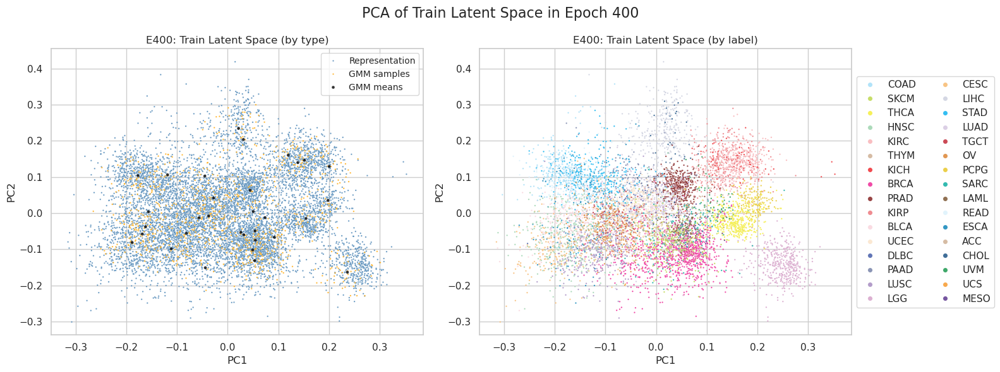

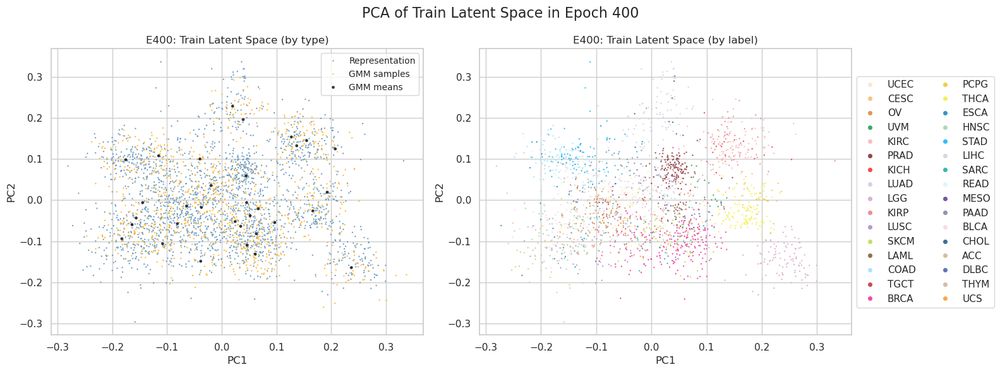

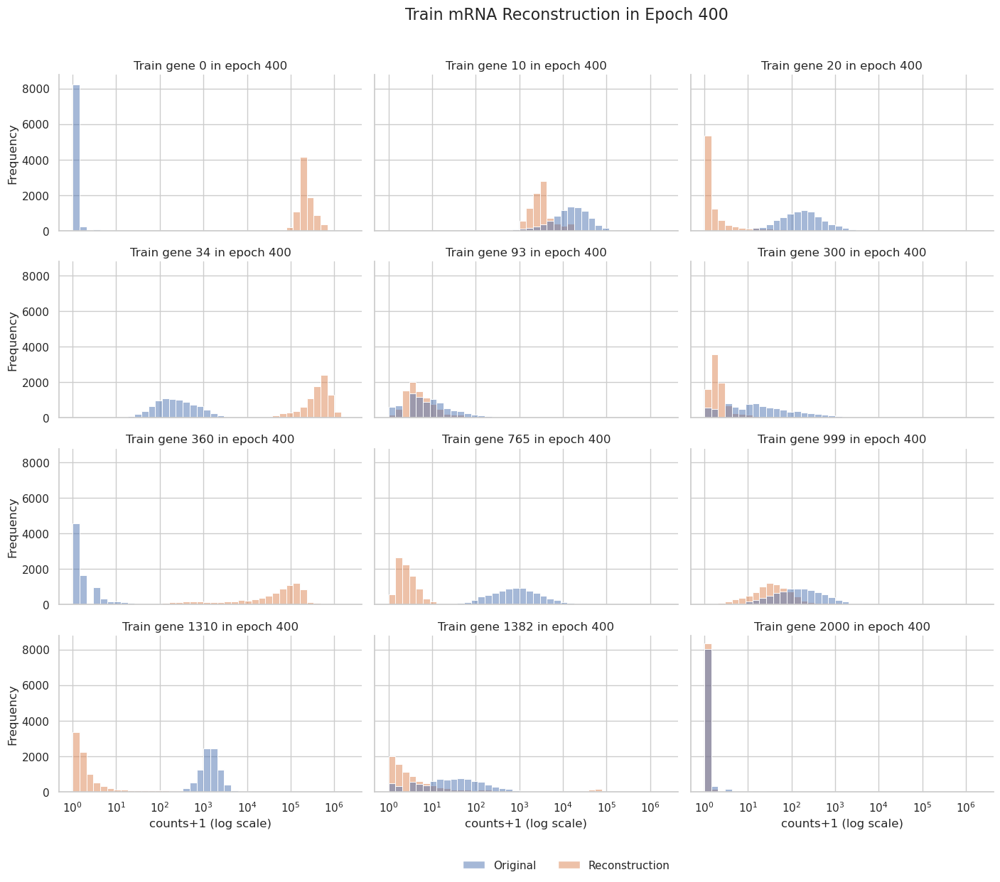

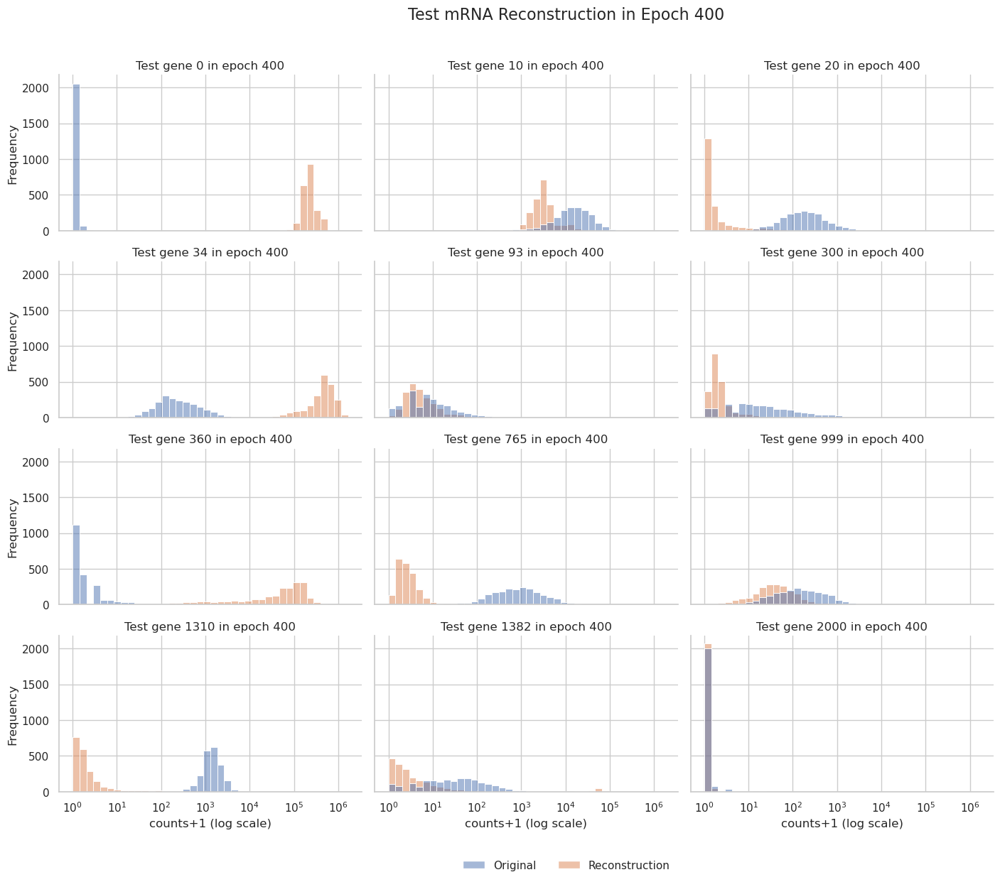

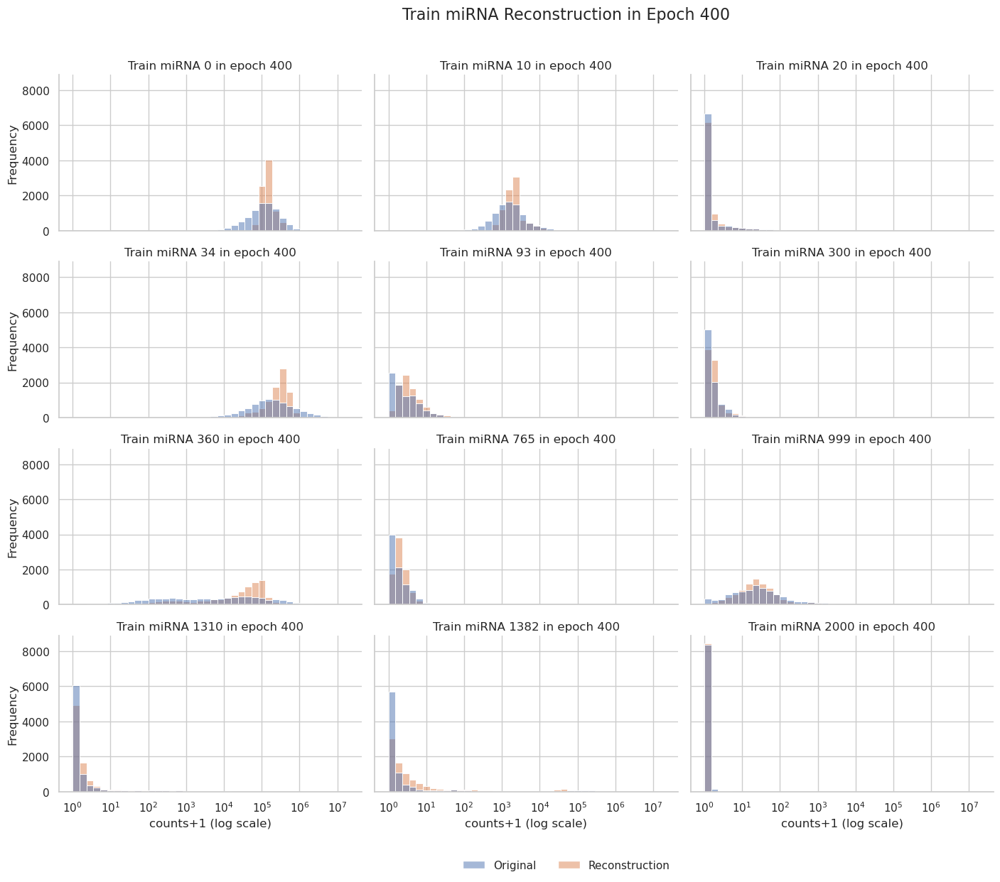

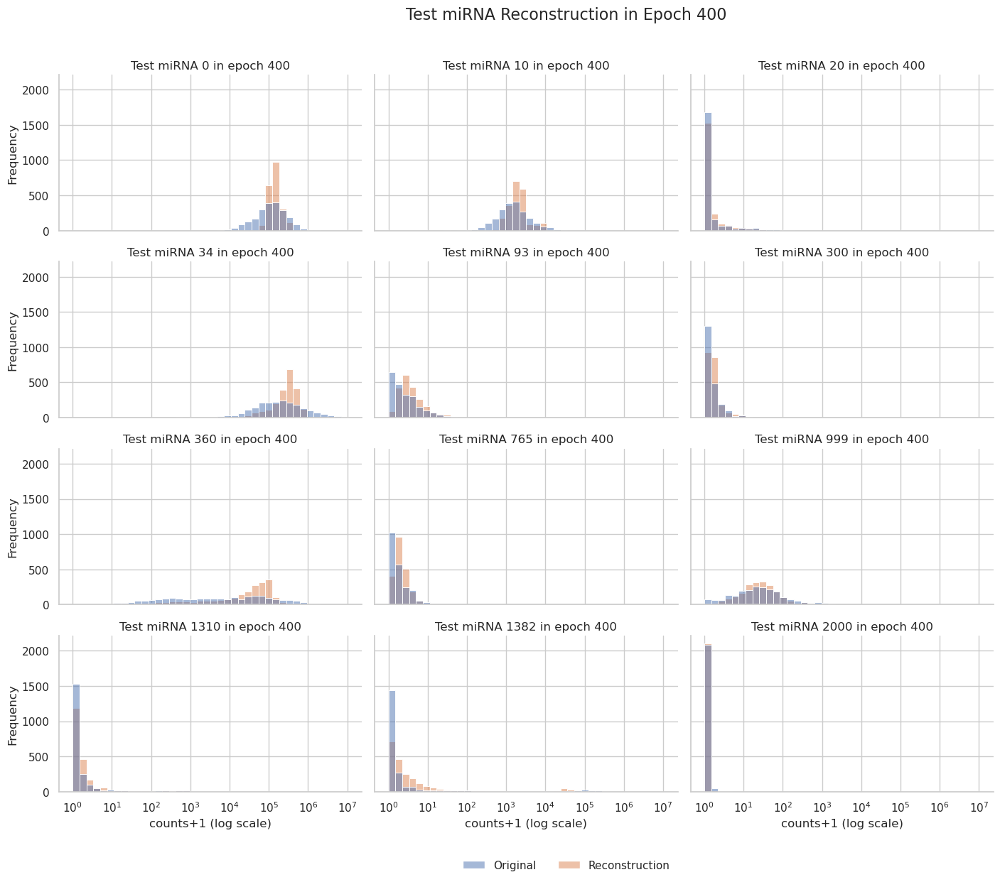

100%|████████████████████████████████████████████████████████████████████████████████████| 401/401 [31:01<00:00,  4.64s/it]


Fold 4 done...
Fold: 5...


  0%|                                                                                              | 0/401 [00:00<?, ?it/s]

0 train_recon: 7.3690058678805395 train_gmm: 6.5348876953125 train_mse: 438200.53125 train_mae: 216.24378967285156 train_r2: 0.035285890102386475 train_spearman: 0.20574606955051422 train_pearson: 0.1991662234067917 train_expl_var: 0.035286009311676025 train_msle: 19.230894088745117
0 test_recon: 7.03798573992318 test_gmm: 3.232582476077649 test_mse: 8532848.0 test_mae: 887.15625 test_r2: 0.01674032211303711 test_spearman: 0.1485939770936966 test_pearson: 0.12952810525894165 test_expl_var: 0.016740381717681885 test_msle: 31.91383934020996


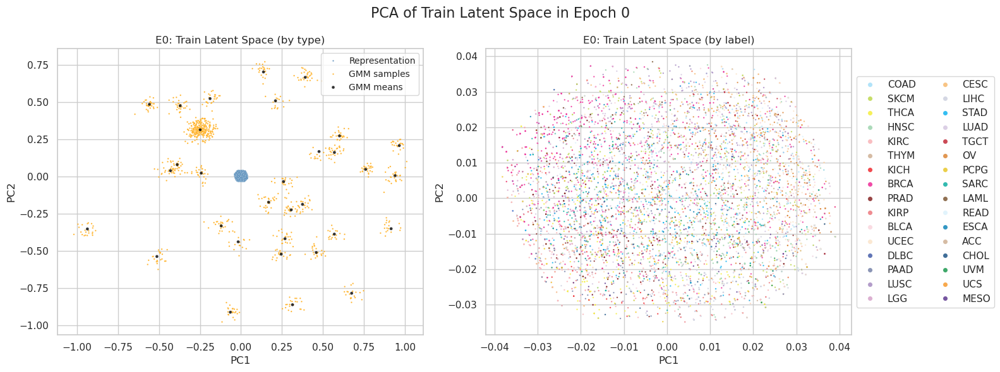

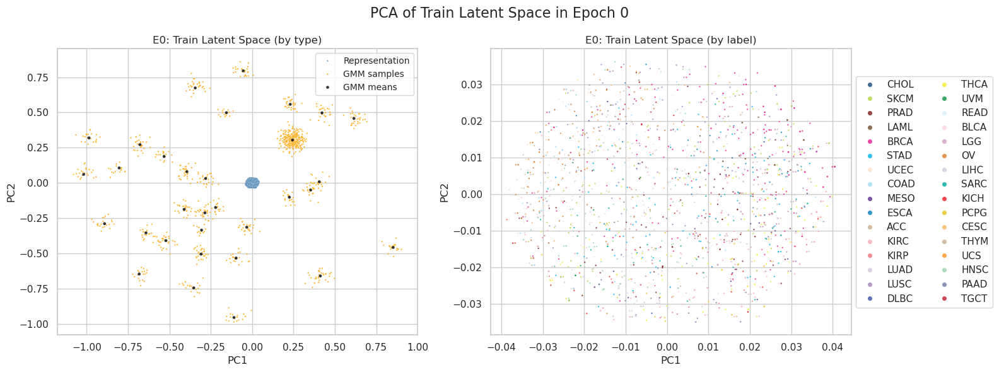

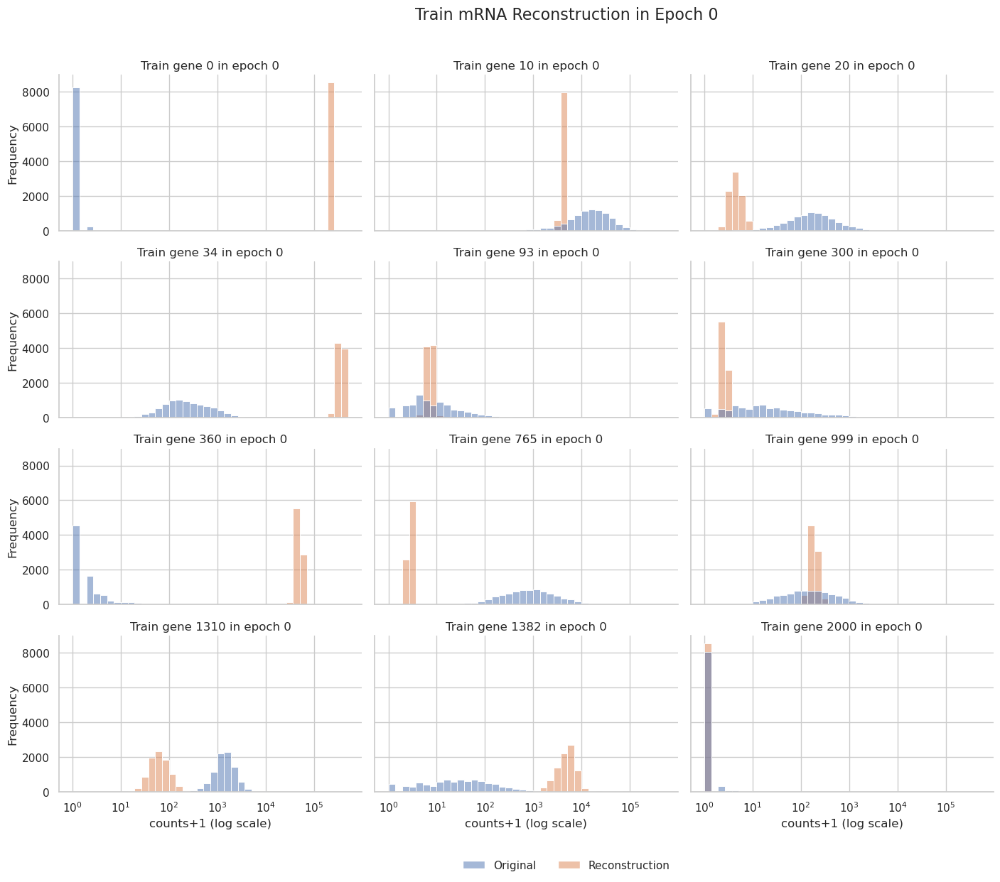

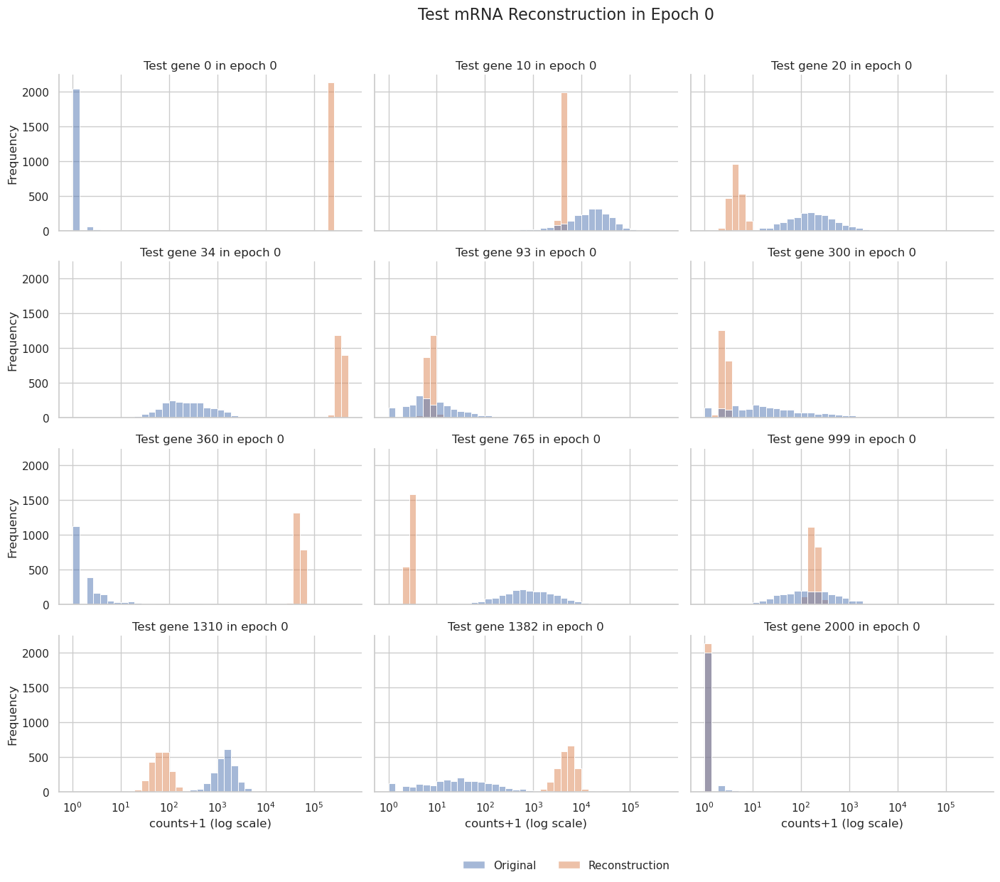

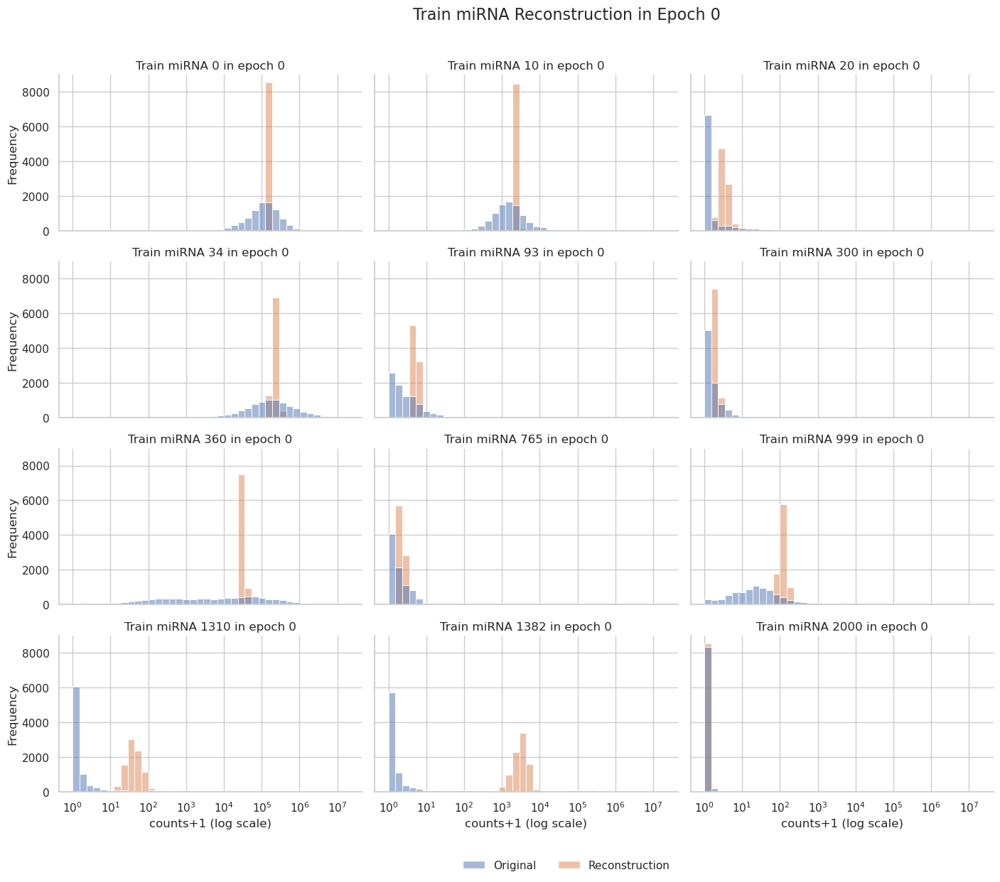

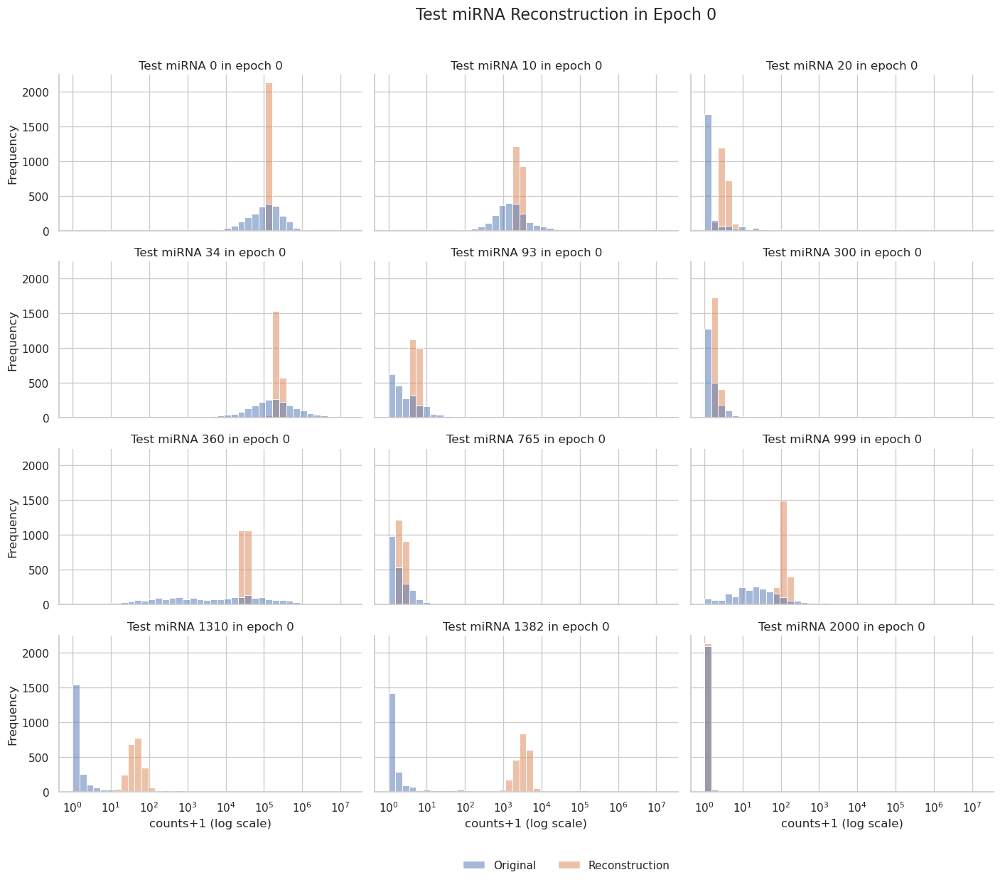

  3%|██▎                                                                                  | 11/401 [01:59<32:08,  4.95s/it]

10 train_recon: 5.75888095563303 train_gmm: 2.1693397749755774 train_mse: 113282.328125 train_mae: 55.571231842041016 train_r2: 0.7506049275398254 train_spearman: 0.4470442235469818 train_pearson: 0.8665101528167725 train_expl_var: 0.7506049275398254 train_msle: 0.9786304235458374
10 test_recon: 5.5980921469934755 test_gmm: 2.169619962526987 test_mse: 1957524.875 test_mae: 221.77684020996094 test_r2: 0.7744299173355103 test_spearman: 0.42069703340530396 test_pearson: 0.880041241645813 test_expl_var: 0.7744299173355103 test_msle: 2.175034761428833


  5%|████▍                                                                                | 21/401 [02:42<27:34,  4.35s/it]

20 train_recon: 5.683587231170009 train_gmm: 2.178688455752949 train_mse: 90041.671875 train_mae: 46.45463943481445 train_r2: 0.8017700910568237 train_spearman: 0.46478471159935 train_pearson: 0.8954299092292786 train_expl_var: 0.8017700910568237 train_msle: 0.5737162232398987
20 test_recon: 5.534241990503816 test_gmm: 2.179639303667484 test_mse: 1582786.625 test_mae: 188.5037078857422 test_r2: 0.8176118731498718 test_spearman: 0.4480826258659363 test_pearson: 0.9042326807975769 test_expl_var: 0.8176118731498718 test_msle: 1.4648280143737793


  8%|██████▌                                                                              | 31/401 [03:25<26:39,  4.32s/it]

30 train_recon: 5.654856699658349 train_gmm: 2.181316436206606 train_mse: 87319.03125 train_mae: 45.54984664916992 train_r2: 0.8077640533447266 train_spearman: 0.47859492897987366 train_pearson: 0.8987576961517334 train_expl_var: 0.8077640533447266 train_msle: 0.5336080193519592
30 test_recon: 5.51355062788619 test_gmm: 2.1824337704231924 test_mse: 1499828.25 test_mae: 184.0254364013672 test_r2: 0.8271713256835938 test_spearman: 0.46003568172454834 test_pearson: 0.90953528881073 test_expl_var: 0.8271713256835938 test_msle: 1.4248325824737549


 10%|████████▋                                                                            | 41/401 [04:08<25:52,  4.31s/it]

40 train_recon: 5.640891785467506 train_gmm: 2.182884312960097 train_mse: 87203.234375 train_mae: 45.4857292175293 train_r2: 0.8080189824104309 train_spearman: 0.4737989604473114 train_pearson: 0.8988989591598511 train_expl_var: 0.8080189824104309 train_msle: 0.48391005396842957
40 test_recon: 5.505117476262171 test_gmm: 2.1838754008022905 test_mse: 1545006.375 test_mae: 186.292236328125 test_r2: 0.8219653964042664 test_spearman: 0.453955739736557 test_pearson: 0.9066238403320312 test_expl_var: 0.8219653964042664 test_msle: 1.3446506261825562


 13%|██████████▊                                                                          | 51/401 [04:52<25:06,  4.30s/it]

50 train_recon: 5.633045469831442 train_gmm: 2.1836534738401077 train_mse: 85592.5546875 train_mae: 44.162925720214844 train_r2: 0.8115649223327637 train_spearman: 0.47639769315719604 train_pearson: 0.9008945822715759 train_expl_var: 0.8115649223327637 train_msle: 0.382862389087677
50 test_recon: 5.500455512676642 test_gmm: 2.183912596512734 test_mse: 1490240.125 test_mae: 181.1268768310547 test_r2: 0.8282762169837952 test_spearman: 0.45376208424568176 test_pearson: 0.9101008176803589 test_expl_var: 0.8282762169837952 test_msle: 1.0701314210891724


 15%|████████████▉                                                                        | 61/401 [05:35<24:33,  4.33s/it]

60 train_recon: 5.6280507290040385 train_gmm: 2.1840563237367 train_mse: 86345.7109375 train_mae: 44.6795539855957 train_r2: 0.8099068403244019 train_spearman: 0.4784068763256073 train_pearson: 0.8999525904655457 train_expl_var: 0.8099068403244019 train_msle: 0.37763136625289917
60 test_recon: 5.499113843199404 test_gmm: 2.184487519096714 test_mse: 1514857.0 test_mae: 183.24913024902344 test_r2: 0.8254395723342896 test_spearman: 0.4463042616844177 test_pearson: 0.9085370898246765 test_expl_var: 0.8254395723342896 test_msle: 1.0307313203811646


 18%|███████████████                                                                      | 71/401 [06:18<23:34,  4.29s/it]

70 train_recon: 5.624628015908154 train_gmm: 2.1842005728000418 train_mse: 87646.609375 train_mae: 45.44103240966797 train_r2: 0.8070428371429443 train_spearman: 0.4803539216518402 train_pearson: 0.8983556032180786 train_expl_var: 0.8070428967475891 train_msle: 0.4399707615375519
70 test_recon: 5.499069857144332 test_gmm: 2.1839896123024003 test_mse: 1535330.0 test_mae: 186.18365478515625 test_r2: 0.8230804204940796 test_spearman: 0.4520603120326996 test_pearson: 0.9072504043579102 test_expl_var: 0.8230804204940796 test_msle: 1.2313333749771118


 20%|█████████████████▏                                                                   | 81/401 [07:01<22:56,  4.30s/it]

80 train_recon: 5.622046953681461 train_gmm: 2.1839810320371043 train_mse: 86675.1015625 train_mae: 45.09849166870117 train_r2: 0.8091816902160645 train_spearman: 0.48159587383270264 train_pearson: 0.8995463252067566 train_expl_var: 0.8091816902160645 train_msle: 0.3930385112762451
80 test_recon: 5.500025632199478 test_gmm: 2.1840983034799475 test_mse: 1540949.5 test_mae: 184.55995178222656 test_r2: 0.8224328756332397 test_spearman: 0.4523394703865051 test_pearson: 0.9068808555603027 test_expl_var: 0.8224328756332397 test_msle: 1.1231411695480347


 23%|███████████████████▎                                                                 | 91/401 [07:44<22:28,  4.35s/it]

90 train_recon: 5.620350980840008 train_gmm: 2.184049299084014 train_mse: 88773.359375 train_mae: 45.706790924072266 train_r2: 0.8045623302459717 train_spearman: 0.4763405919075012 train_pearson: 0.8969786763191223 train_expl_var: 0.8045623302459717 train_msle: 0.3787690997123718
90 test_recon: 5.500347396090845 test_gmm: 2.18389154152792 test_mse: 1553501.375 test_mae: 184.8295135498047 test_r2: 0.8209865093231201 test_spearman: 0.4476621448993683 test_pearson: 0.9060847163200378 test_expl_var: 0.8209865093231201 test_msle: 1.0582621097564697


 25%|█████████████████████▏                                                              | 101/401 [08:27<21:30,  4.30s/it]

100 train_recon: 5.618943805146813 train_gmm: 2.183860180855579 train_mse: 88650.625 train_mae: 45.65602493286133 train_r2: 0.8048324584960938 train_spearman: 0.4748396873474121 train_pearson: 0.8971291184425354 train_expl_var: 0.8048325181007385 train_msle: 0.37108683586120605
100 test_recon: 5.502636140316358 test_gmm: 2.182986541676577 test_mse: 1528732.125 test_mae: 183.5796356201172 test_r2: 0.8238406777381897 test_spearman: 0.44283899664878845 test_pearson: 0.9076615571975708 test_expl_var: 0.8238406777381897 test_msle: 1.0591169595718384


 28%|███████████████████████▎                                                            | 111/401 [09:10<20:43,  4.29s/it]

110 train_recon: 5.6176198190301605 train_gmm: 2.1840249307567907 train_mse: 89452.859375 train_mae: 46.516292572021484 train_r2: 0.8030663728713989 train_spearman: 0.484732061624527 train_pearson: 0.8961522579193115 train_expl_var: 0.8030663728713989 train_msle: 0.4499855041503906
110 test_recon: 5.502734382159189 test_gmm: 2.1831486250365923 test_mse: 1532208.75 test_mae: 187.0786895751953 test_r2: 0.8234400749206543 test_spearman: 0.45076435804367065 test_pearson: 0.9075784087181091 test_expl_var: 0.8234400749206543 test_msle: 1.218725562095642


 30%|█████████████████████████▎                                                          | 121/401 [09:54<20:14,  4.34s/it]

120 train_recon: 5.616904332853219 train_gmm: 2.1839995876964786 train_mse: 88490.625 train_mae: 45.93537139892578 train_r2: 0.8051847219467163 train_spearman: 0.47910937666893005 train_pearson: 0.8973221182823181 train_expl_var: 0.8051847219467163 train_msle: 0.4210149943828583
120 test_recon: 5.504003642121198 test_gmm: 2.1827921325540656 test_mse: 1546843.375 test_mae: 187.32498168945312 test_r2: 0.8217536807060242 test_spearman: 0.4473968744277954 test_pearson: 0.9065744876861572 test_expl_var: 0.8217536807060242 test_msle: 1.209364414215088


 33%|███████████████████████████▍                                                        | 131/401 [10:37<19:22,  4.31s/it]

130 train_recon: 5.615703325551473 train_gmm: 2.1839518572181245 train_mse: 89752.3046875 train_mae: 46.65171432495117 train_r2: 0.8024070858955383 train_spearman: 0.47941771149635315 train_pearson: 0.8957844376564026 train_expl_var: 0.8024071455001831 train_msle: 0.4463205635547638
130 test_recon: 5.504200246937039 test_gmm: 2.1826780825755634 test_mse: 1547700.25 test_mae: 187.6237335205078 test_r2: 0.8216549754142761 test_spearman: 0.4456343948841095 test_pearson: 0.9065847992897034 test_expl_var: 0.8216549754142761 test_msle: 1.3056631088256836


 35%|█████████████████████████████▌                                                      | 141/401 [11:20<18:42,  4.32s/it]

140 train_recon: 5.615092096552368 train_gmm: 2.183895456331729 train_mse: 91327.1796875 train_mae: 47.188472747802734 train_r2: 0.7989399433135986 train_spearman: 0.48305344581604004 train_pearson: 0.893844723701477 train_expl_var: 0.7989399433135986 train_msle: 0.453655481338501
140 test_recon: 5.506386404432817 test_gmm: 2.182873379352221 test_mse: 1585135.75 test_mae: 191.5736846923828 test_r2: 0.8173412084579468 test_spearman: 0.4464356601238251 test_pearson: 0.9042047262191772 test_expl_var: 0.8173412084579468 test_msle: 1.2829066514968872


 38%|███████████████████████████████▋                                                    | 151/401 [12:03<17:58,  4.31s/it]

150 train_recon: 5.614362660971982 train_gmm: 2.1840134640653357 train_mse: 91527.078125 train_mae: 46.587806701660156 train_r2: 0.7984998822212219 train_spearman: 0.4788373112678528 train_pearson: 0.8935945630073547 train_expl_var: 0.7984998822212219 train_msle: 0.3556941747665405
150 test_recon: 5.506910466258503 test_gmm: 2.182668447025487 test_mse: 1581629.125 test_mae: 189.8960723876953 test_r2: 0.8177452683448792 test_spearman: 0.4409235119819641 test_pearson: 0.904331386089325 test_expl_var: 0.8177452683448792 test_msle: 1.0259541273117065


 40%|█████████████████████████████████▋                                                  | 161/401 [12:46<17:20,  4.34s/it]

160 train_recon: 5.6136166772601035 train_gmm: 2.184124027668013 train_mse: 91749.890625 train_mae: 47.282554626464844 train_r2: 0.7980093359947205 train_spearman: 0.4872021973133087 train_pearson: 0.8933146595954895 train_expl_var: 0.7980093955993652 train_msle: 0.4137873649597168
160 test_recon: 5.506592346805608 test_gmm: 2.182488930766979 test_mse: 1598474.75 test_mae: 193.08383178710938 test_r2: 0.815804123878479 test_spearman: 0.44995686411857605 test_pearson: 0.9033041000366211 test_expl_var: 0.815804123878479 test_msle: 1.177182912826538


 43%|███████████████████████████████████▊                                                | 171/401 [13:30<16:35,  4.33s/it]

170 train_recon: 5.61323602415904 train_gmm: 2.1841891311200663 train_mse: 92883.546875 train_mae: 47.130821228027344 train_r2: 0.7955135703086853 train_spearman: 0.4804952144622803 train_pearson: 0.8919227123260498 train_expl_var: 0.7955135703086853 train_msle: 0.3566647469997406
170 test_recon: 5.507023422784987 test_gmm: 2.182864012528359 test_mse: 1576732.5 test_mae: 191.53688049316406 test_r2: 0.818309485912323 test_spearman: 0.4421801269054413 test_pearson: 0.9046685099601746 test_expl_var: 0.818309485912323 test_msle: 1.0597727298736572


 45%|█████████████████████████████████████▉                                              | 181/401 [14:13<15:56,  4.35s/it]

180 train_recon: 5.61266899986632 train_gmm: 2.184321311072602 train_mse: 93181.9453125 train_mae: 47.559478759765625 train_r2: 0.794856607913971 train_spearman: 0.4832472801208496 train_pearson: 0.8915476202964783 train_expl_var: 0.7948566675186157 train_msle: 0.3895840048789978
180 test_recon: 5.508096757313472 test_gmm: 2.1830433215246265 test_mse: 1613380.375 test_mae: 194.44586181640625 test_r2: 0.8140864968299866 test_spearman: 0.445908784866333 test_pearson: 0.902392566204071 test_expl_var: 0.8140864968299866 test_msle: 1.1061280965805054


 48%|████████████████████████████████████████                                            | 191/401 [14:56<15:07,  4.32s/it]

190 train_recon: 5.612128575016464 train_gmm: 2.1844569040201764 train_mse: 92325.4375 train_mae: 47.29546356201172 train_r2: 0.7967422604560852 train_spearman: 0.47913658618927 train_pearson: 0.8926042318344116 train_expl_var: 0.7967422604560852 train_msle: 0.38537469506263733
190 test_recon: 5.510065001614718 test_gmm: 2.18239728083376 test_mse: 1573773.375 test_mae: 190.44483947753906 test_r2: 0.818650484085083 test_spearman: 0.4426874816417694 test_pearson: 0.9048888683319092 test_expl_var: 0.818650484085083 test_msle: 1.1151597499847412


 50%|█████████████████████████████████████████▉                                          | 200/401 [15:35<14:28,  4.32s/it]

200 train_recon: 5.612144643949876 train_gmm: 2.1845197035576556 train_mse: 92474.703125 train_mae: 47.864009857177734 train_r2: 0.7964136600494385 train_spearman: 0.48300135135650635 train_pearson: 0.8924375176429749 train_expl_var: 0.7964136600494385 train_msle: 0.465204656124115
200 test_recon: 5.5087276664913265 test_gmm: 2.182678265538093 test_mse: 1605571.375 test_mae: 194.52713012695312 test_r2: 0.8149863481521606 test_spearman: 0.4438546299934387 test_pearson: 0.9029032588005066 test_expl_var: 0.8149863481521606 test_msle: 1.3125803470611572


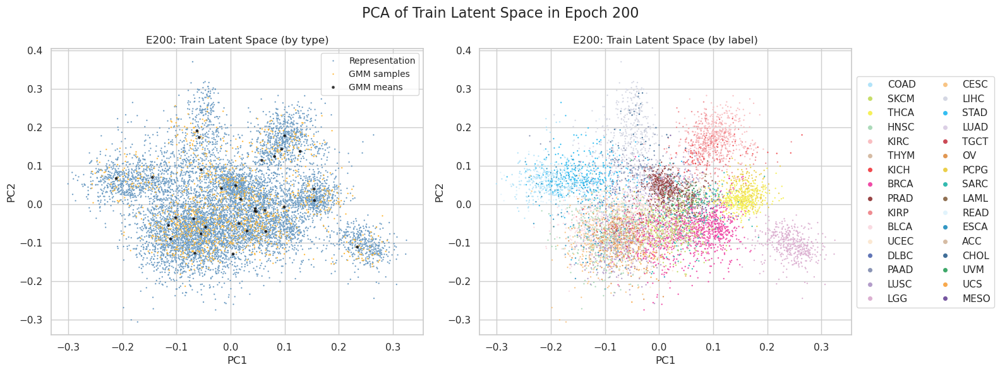

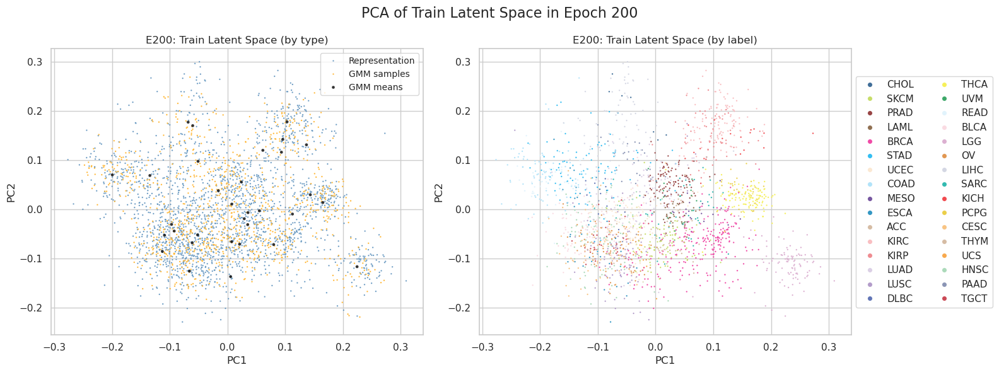

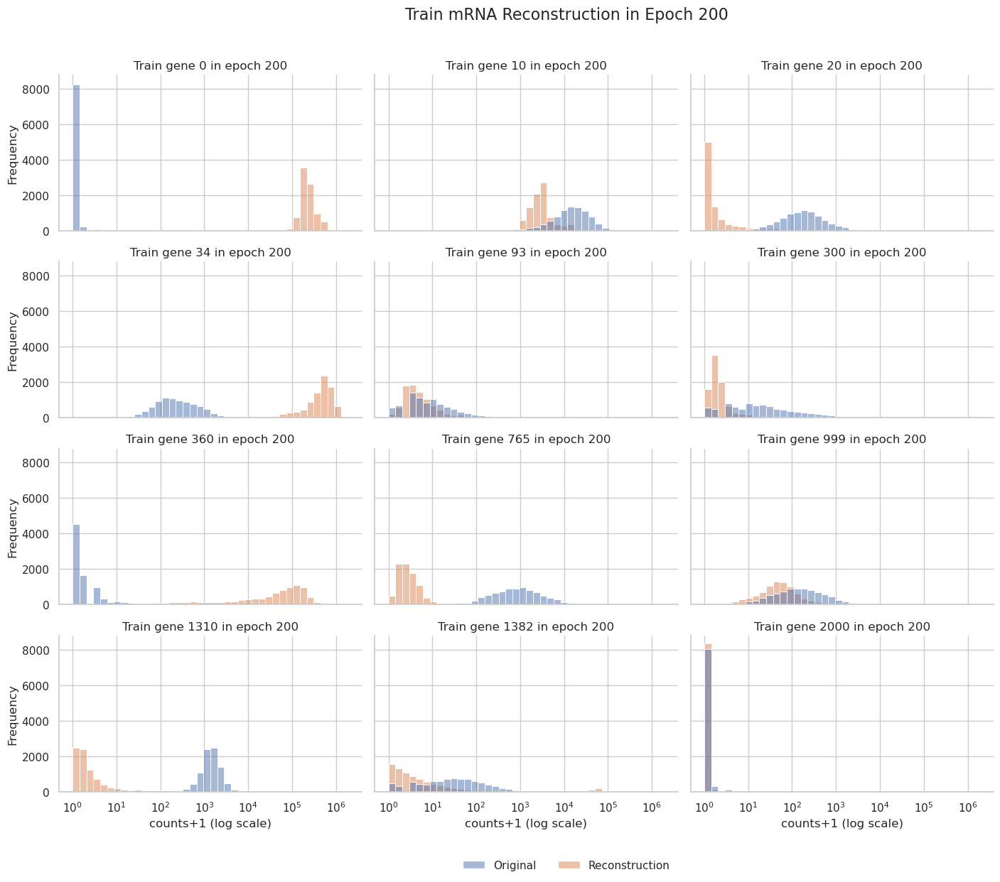

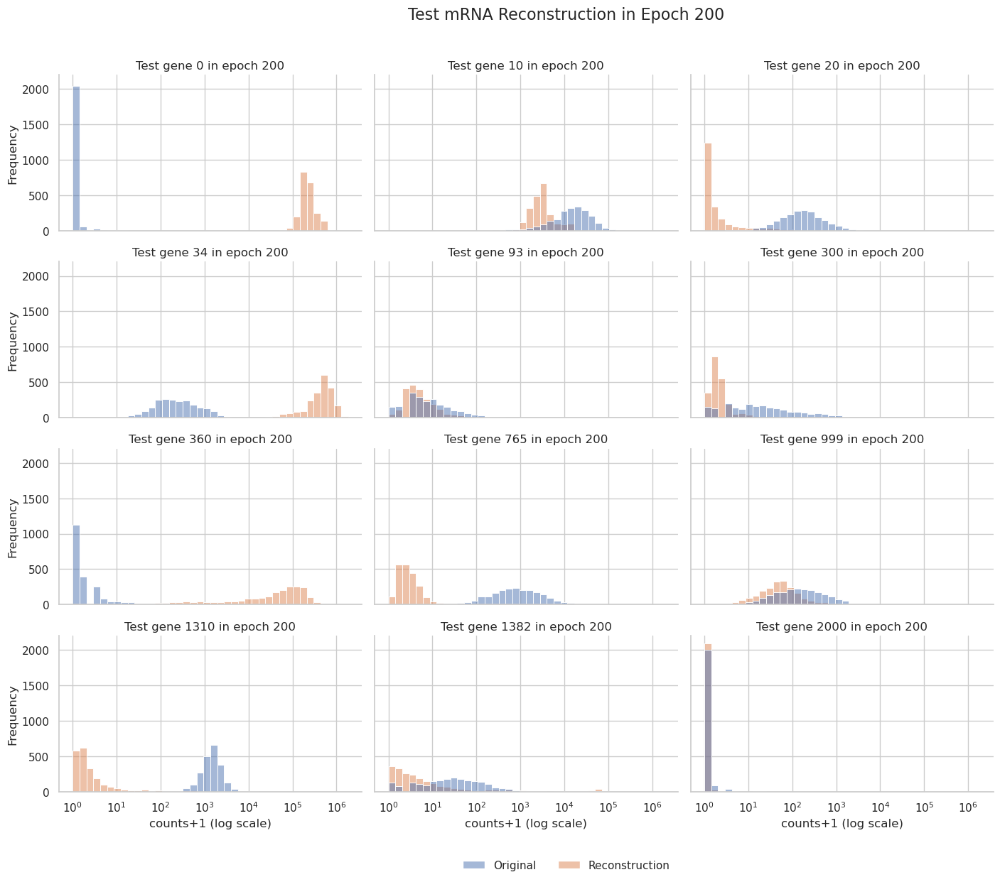

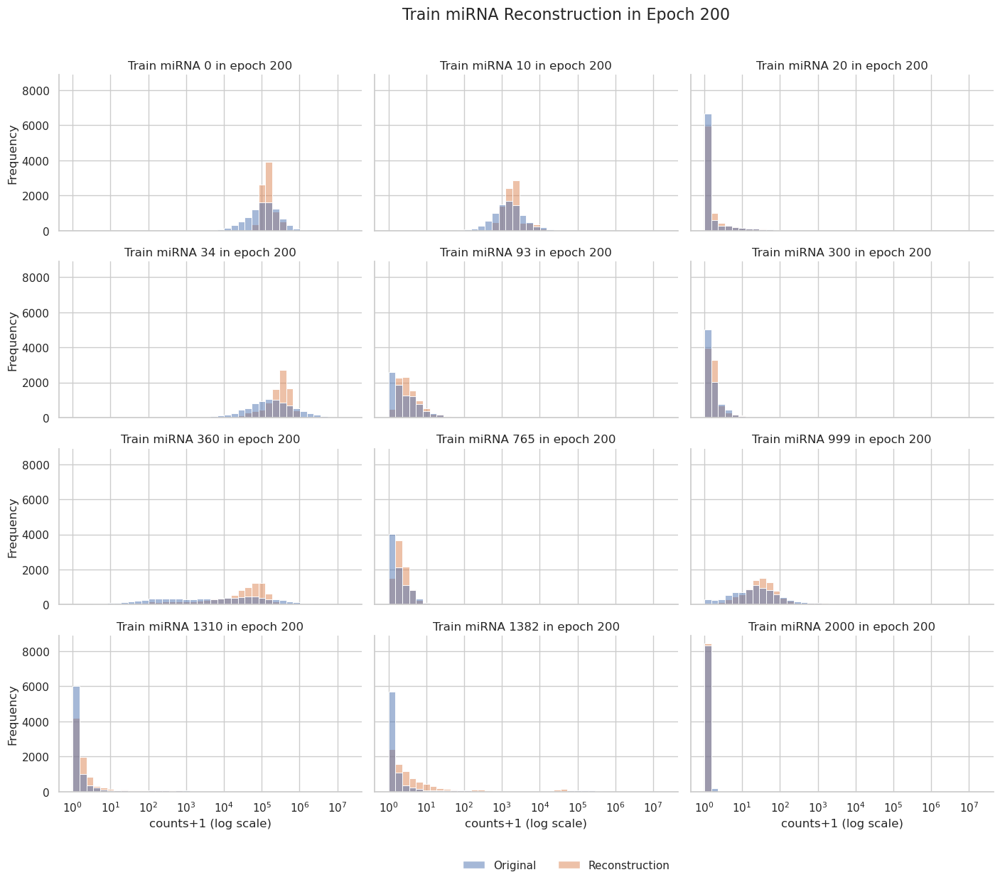

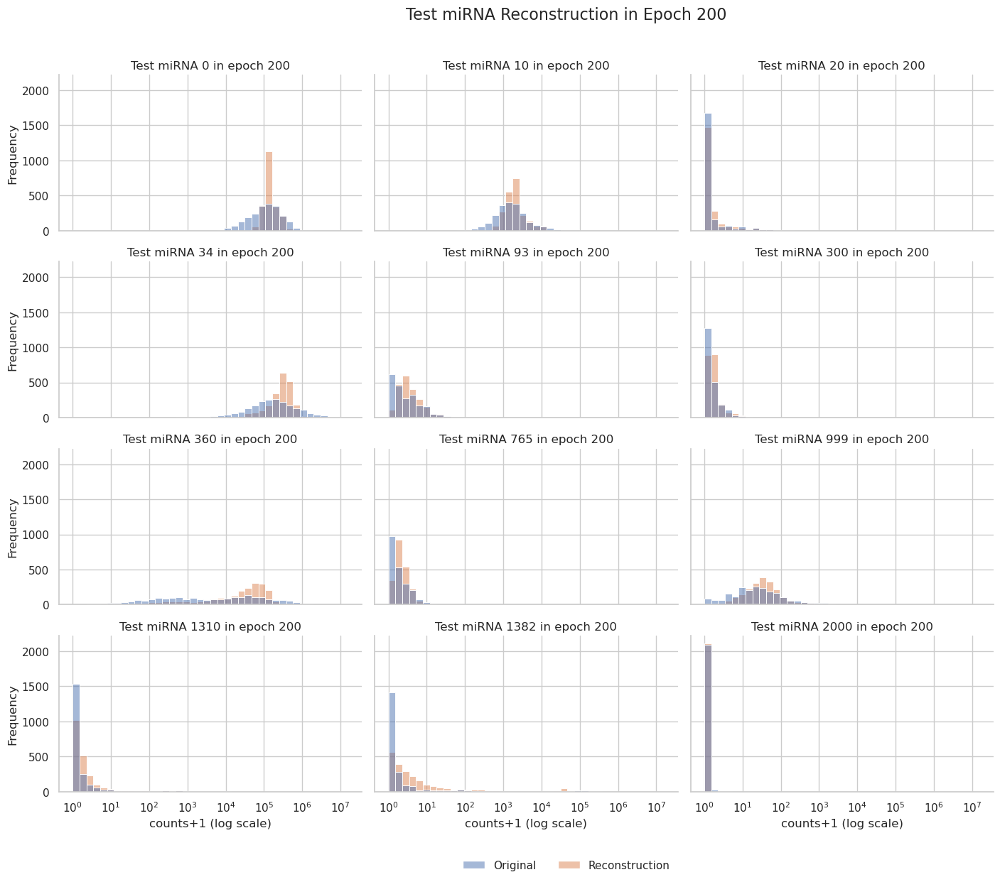

 53%|████████████████████████████████████████████▏                                       | 211/401 [17:31<15:41,  4.96s/it]

210 train_recon: 5.611369431788086 train_gmm: 2.184563567975885 train_mse: 92704.640625 train_mae: 47.58325958251953 train_r2: 0.7959074378013611 train_spearman: 0.4835965633392334 train_pearson: 0.8921365141868591 train_expl_var: 0.7959074378013611 train_msle: 0.3864797353744507
210 test_recon: 5.51031065362056 test_gmm: 2.1828135977751755 test_mse: 1597031.75 test_mae: 193.1496124267578 test_r2: 0.8159703612327576 test_spearman: 0.4433748424053192 test_pearson: 0.9034093022346497 test_expl_var: 0.8159703612327576 test_msle: 1.0906378030776978


 55%|██████████████████████████████████████████████▎                                     | 221/401 [18:15<13:16,  4.42s/it]

220 train_recon: 5.6111208003909665 train_gmm: 2.184740426291656 train_mse: 93234.0390625 train_mae: 47.78740310668945 train_r2: 0.7947419285774231 train_spearman: 0.482551634311676 train_pearson: 0.8914881944656372 train_expl_var: 0.7947419881820679 train_msle: 0.42396920919418335
220 test_recon: 5.5117566109165885 test_gmm: 2.1829052062559464 test_mse: 1609511.0 test_mae: 195.40277099609375 test_r2: 0.8145323395729065 test_spearman: 0.44144946336746216 test_pearson: 0.9027061462402344 test_expl_var: 0.8145323395729065 test_msle: 1.1632194519042969


 58%|████████████████████████████████████████████████▍                                   | 231/401 [18:59<12:28,  4.40s/it]

230 train_recon: 5.6106033559852895 train_gmm: 2.1849199443996237 train_mse: 93839.1640625 train_mae: 47.70014953613281 train_r2: 0.7934097051620483 train_spearman: 0.48149609565734863 train_pearson: 0.8907366394996643 train_expl_var: 0.7934097647666931 train_msle: 0.3388681709766388
230 test_recon: 5.51175433577581 test_gmm: 2.182492592876354 test_mse: 1587672.125 test_mae: 192.9133758544922 test_r2: 0.8170489072799683 test_spearman: 0.43709665536880493 test_pearson: 0.9040080308914185 test_expl_var: 0.8170489072799683 test_msle: 0.9565432071685791


 60%|██████████████████████████████████████████████████▍                                 | 241/401 [19:43<11:43,  4.40s/it]

240 train_recon: 5.610393964855107 train_gmm: 2.18533755035454 train_mse: 92246.59375 train_mae: 47.1756591796875 train_r2: 0.7969158291816711 train_spearman: 0.48192277550697327 train_pearson: 0.8927018046379089 train_expl_var: 0.7969158887863159 train_msle: 0.34434425830841064
240 test_recon: 5.511571639864595 test_gmm: 2.1832213440656103 test_mse: 1603190.5 test_mae: 192.8924102783203 test_r2: 0.815260648727417 test_spearman: 0.44103363156318665 test_pearson: 0.9030312299728394 test_expl_var: 0.815260648727417 test_msle: 1.0113462209701538


 63%|████████████████████████████████████████████████████▌                               | 251/401 [20:27<10:59,  4.40s/it]

250 train_recon: 5.60988750909331 train_gmm: 2.18518268927773 train_mse: 93147.3203125 train_mae: 47.591339111328125 train_r2: 0.7949328422546387 train_spearman: 0.4799959361553192 train_pearson: 0.8915902972221375 train_expl_var: 0.7949328422546387 train_msle: 0.3658592998981476
250 test_recon: 5.511797695113861 test_gmm: 2.1832277720538458 test_mse: 1613074.75 test_mae: 194.5589599609375 test_r2: 0.8141217231750488 test_spearman: 0.4337301552295685 test_pearson: 0.9023958444595337 test_expl_var: 0.8141217231750488 test_msle: 1.0734626054763794


 65%|██████████████████████████████████████████████████████▋                             | 261/401 [21:11<10:16,  4.40s/it]

260 train_recon: 5.609601527892009 train_gmm: 2.185762659753322 train_mse: 94472.1953125 train_mae: 48.10061264038086 train_r2: 0.7920160889625549 train_spearman: 0.4844578206539154 train_pearson: 0.889953076839447 train_expl_var: 0.7920161485671997 train_msle: 0.3622424602508545
260 test_recon: 5.5119683780710975 test_gmm: 2.1833120248691817 test_mse: 1682794.625 test_mae: 199.34994506835938 test_r2: 0.8060877323150635 test_spearman: 0.438926100730896 test_pearson: 0.897921621799469 test_expl_var: 0.8060877323150635 test_msle: 1.02658212184906


 68%|████████████████████████████████████████████████████████▊                           | 271/401 [21:55<09:35,  4.43s/it]

270 train_recon: 5.609381027001948 train_gmm: 2.185711417663238 train_mse: 94215.4765625 train_mae: 48.09005355834961 train_r2: 0.7925812602043152 train_spearman: 0.4789891541004181 train_pearson: 0.8902705311775208 train_expl_var: 0.79258131980896 train_msle: 0.35569679737091064
270 test_recon: 5.512349211358261 test_gmm: 2.183125142939476 test_mse: 1618038.875 test_mae: 195.64776611328125 test_r2: 0.8135496377944946 test_spearman: 0.4363773763179779 test_pearson: 0.9021126627922058 test_expl_var: 0.8135496377944946 test_msle: 1.05118727684021


 70%|██████████████████████████████████████████████████████████▊                         | 281/401 [22:39<08:49,  4.41s/it]

280 train_recon: 5.608882409551599 train_gmm: 2.185854419011057 train_mse: 93840.25 train_mae: 48.16391372680664 train_r2: 0.7934073209762573 train_spearman: 0.48581093549728394 train_pearson: 0.890741229057312 train_expl_var: 0.7934073805809021 train_msle: 0.415950208902359
280 test_recon: 5.512978377314824 test_gmm: 2.1833983345835772 test_mse: 1608594.875 test_mae: 194.35394287109375 test_r2: 0.8146378993988037 test_spearman: 0.4399077594280243 test_pearson: 0.9026928544044495 test_expl_var: 0.8146378993988037 test_msle: 1.1606682538986206


 73%|████████████████████████████████████████████████████████████▉                       | 291/401 [23:23<08:05,  4.41s/it]

290 train_recon: 5.60877056419318 train_gmm: 2.1859687786417172 train_mse: 94233.21875 train_mae: 48.28733444213867 train_r2: 0.7925422191619873 train_spearman: 0.48420581221580505 train_pearson: 0.8902499079704285 train_expl_var: 0.7925422191619873 train_msle: 0.37619295716285706
290 test_recon: 5.513337422969105 test_gmm: 2.1835238440198697 test_mse: 1635722.0 test_mae: 196.22227478027344 test_r2: 0.8115119934082031 test_spearman: 0.4403376579284668 test_pearson: 0.9010048508644104 test_expl_var: 0.8115119934082031 test_msle: 1.149015188217163


 75%|███████████████████████████████████████████████████████████████                     | 301/401 [24:07<07:20,  4.40s/it]

300 train_recon: 5.6084513774612 train_gmm: 2.1863368918808908 train_mse: 94630.2890625 train_mae: 48.570899963378906 train_r2: 0.7916680574417114 train_spearman: 0.48224860429763794 train_pearson: 0.889771044254303 train_expl_var: 0.7916680574417114 train_msle: 0.44529494643211365
300 test_recon: 5.513779105739063 test_gmm: 2.1832112153743415 test_mse: 1661252.625 test_mae: 199.90235900878906 test_r2: 0.8085700273513794 test_spearman: 0.43540531396865845 test_pearson: 0.8994669914245605 test_expl_var: 0.8085700273513794 test_msle: 1.2881232500076294


 78%|█████████████████████████████████████████████████████████████████▏                  | 311/401 [24:51<06:37,  4.42s/it]

310 train_recon: 5.6083483683047355 train_gmm: 2.1864841244564364 train_mse: 93997.75 train_mae: 47.960960388183594 train_r2: 0.7930606007575989 train_spearman: 0.4837709367275238 train_pearson: 0.8905396461486816 train_expl_var: 0.7930606007575989 train_msle: 0.35036173462867737
310 test_recon: 5.513079025961674 test_gmm: 2.1839253095497293 test_mse: 1624675.875 test_mae: 195.30592346191406 test_r2: 0.8127849102020264 test_spearman: 0.44139665365219116 test_pearson: 0.901681125164032 test_expl_var: 0.8127849102020264 test_msle: 1.0216073989868164


 80%|███████████████████████████████████████████████████████████████████▏                | 321/401 [25:35<05:51,  4.40s/it]

320 train_recon: 5.607949653122201 train_gmm: 2.1867166604695365 train_mse: 94488.65625 train_mae: 47.92328643798828 train_r2: 0.7919798493385315 train_spearman: 0.47714096307754517 train_pearson: 0.8899367451667786 train_expl_var: 0.7919799089431763 train_msle: 0.28851985931396484
320 test_recon: 5.513930444733144 test_gmm: 2.1837728088521846 test_mse: 1685704.25 test_mae: 199.37156677246094 test_r2: 0.8057524561882019 test_spearman: 0.43583357334136963 test_pearson: 0.8976991772651672 test_expl_var: 0.8057524561882019 test_msle: 0.8569145798683167


 83%|█████████████████████████████████████████████████████████████████████▎              | 331/401 [26:19<05:07,  4.40s/it]

330 train_recon: 5.6078001117258225 train_gmm: 2.186927042743275 train_mse: 94691.3828125 train_mae: 48.33890914916992 train_r2: 0.7915335297584534 train_spearman: 0.4819340705871582 train_pearson: 0.8896821141242981 train_expl_var: 0.7915335893630981 train_msle: 0.3553035259246826
330 test_recon: 5.514641863348725 test_gmm: 2.1835623733556244 test_mse: 1655002.5 test_mae: 198.46376037597656 test_r2: 0.8092902898788452 test_spearman: 0.44102388620376587 test_pearson: 0.8997726440429688 test_expl_var: 0.8092902898788452 test_msle: 1.0461400747299194


 85%|███████████████████████████████████████████████████████████████████████▍            | 341/401 [27:03<04:23,  4.40s/it]

340 train_recon: 5.60774624933506 train_gmm: 2.187266174823782 train_mse: 94110.1015625 train_mae: 48.26475143432617 train_r2: 0.7928133010864258 train_spearman: 0.4775533378124237 train_pearson: 0.8904041051864624 train_expl_var: 0.7928133010864258 train_msle: 0.3642645478248596
340 test_recon: 5.514933413159878 test_gmm: 2.1844300660037326 test_mse: 1679120.625 test_mae: 200.71238708496094 test_r2: 0.8065111041069031 test_spearman: 0.4325520098209381 test_pearson: 0.8981780409812927 test_expl_var: 0.8065111041069031 test_msle: 1.1184250116348267


 88%|█████████████████████████████████████████████████████████████████████████▌          | 351/401 [27:47<03:39,  4.39s/it]

350 train_recon: 5.607472539027445 train_gmm: 2.1871993627303685 train_mse: 94961.0859375 train_mae: 48.71499252319336 train_r2: 0.7909398078918457 train_spearman: 0.47843137383461 train_pearson: 0.8893563151359558 train_expl_var: 0.7909398078918457 train_msle: 0.4026130735874176
350 test_recon: 5.5151740250969095 test_gmm: 2.184352444150688 test_mse: 1708335.625 test_mae: 203.10520935058594 test_r2: 0.8031445741653442 test_spearman: 0.4344807267189026 test_pearson: 0.8963608145713806 test_expl_var: 0.8031445741653442 test_msle: 1.205552339553833


 90%|███████████████████████████████████████████████████████████████████████████▌        | 361/401 [28:31<02:56,  4.40s/it]

360 train_recon: 5.6070982510986775 train_gmm: 2.1875549880951075 train_mse: 94929.453125 train_mae: 48.475364685058594 train_r2: 0.7910094261169434 train_spearman: 0.480880469083786 train_pearson: 0.8893879055976868 train_expl_var: 0.7910094261169434 train_msle: 0.36042484641075134
360 test_recon: 5.515774098744059 test_gmm: 2.184713872333321 test_mse: 1708765.5 test_mae: 202.5572509765625 test_r2: 0.8030950427055359 test_spearman: 0.43538910150527954 test_pearson: 0.8963443636894226 test_expl_var: 0.8030950427055359 test_msle: 1.0233689546585083


 93%|█████████████████████████████████████████████████████████████████████████████▋      | 371/401 [29:15<02:12,  4.41s/it]

370 train_recon: 5.606953600418964 train_gmm: 2.187715493190932 train_mse: 93939.9921875 train_mae: 48.26811218261719 train_r2: 0.7931877374649048 train_spearman: 0.48432666063308716 train_pearson: 0.890613317489624 train_expl_var: 0.7931877970695496 train_msle: 0.34201788902282715
370 test_recon: 5.515099661699206 test_gmm: 2.1848195732170304 test_mse: 1669002.25 test_mae: 200.2473602294922 test_r2: 0.8076770305633545 test_spearman: 0.4364732503890991 test_pearson: 0.8988984823226929 test_expl_var: 0.8076770305633545 test_msle: 1.0134387016296387


 95%|███████████████████████████████████████████████████████████████████████████████▊    | 381/401 [29:59<01:28,  4.40s/it]

380 train_recon: 5.6067441289836095 train_gmm: 2.1881987021128784 train_mse: 95648.5390625 train_mae: 49.04525375366211 train_r2: 0.789426326751709 train_spearman: 0.48613879084587097 train_pearson: 0.8885043859481812 train_expl_var: 0.789426326751709 train_msle: 0.38546839356422424
380 test_recon: 5.515513942715747 test_gmm: 2.1845380281899516 test_mse: 1683682.125 test_mae: 200.8273162841797 test_r2: 0.8059854507446289 test_spearman: 0.4380505681037903 test_pearson: 0.8980062007904053 test_expl_var: 0.8059854507446289 test_msle: 1.1024272441864014


 98%|█████████████████████████████████████████████████████████████████████████████████▉  | 391/401 [30:43<00:44,  4.40s/it]

390 train_recon: 5.6067342553968 train_gmm: 2.188503437692088 train_mse: 96233.8203125 train_mae: 49.21640396118164 train_r2: 0.7881377935409546 train_spearman: 0.4802553355693817 train_pearson: 0.8877822160720825 train_expl_var: 0.7881378531455994 train_msle: 0.39734527468681335
390 test_recon: 5.516255417415655 test_gmm: 2.1853431819585225 test_mse: 1703765.875 test_mae: 203.72476196289062 test_r2: 0.8036711812019348 test_spearman: 0.4331892132759094 test_pearson: 0.8967012166976929 test_expl_var: 0.80367112159729 test_msle: 1.1719536781311035


100%|███████████████████████████████████████████████████████████████████████████████████▊| 400/401 [31:23<00:04,  4.39s/it]

400 train_recon: 5.606383485035334 train_gmm: 2.1886780878515215 train_mse: 95268.8984375 train_mae: 49.173397064208984 train_r2: 0.7902621030807495 train_spearman: 0.4886150062084198 train_pearson: 0.888998806476593 train_expl_var: 0.7902621626853943 train_msle: 0.42435380816459656
400 test_recon: 5.517574535613221 test_gmm: 2.185534114792978 test_mse: 1708997.625 test_mae: 203.8185577392578 test_r2: 0.8030682802200317 test_spearman: 0.43690431118011475 test_pearson: 0.8963863253593445 test_expl_var: 0.8030682802200317 test_msle: 1.181484341621399


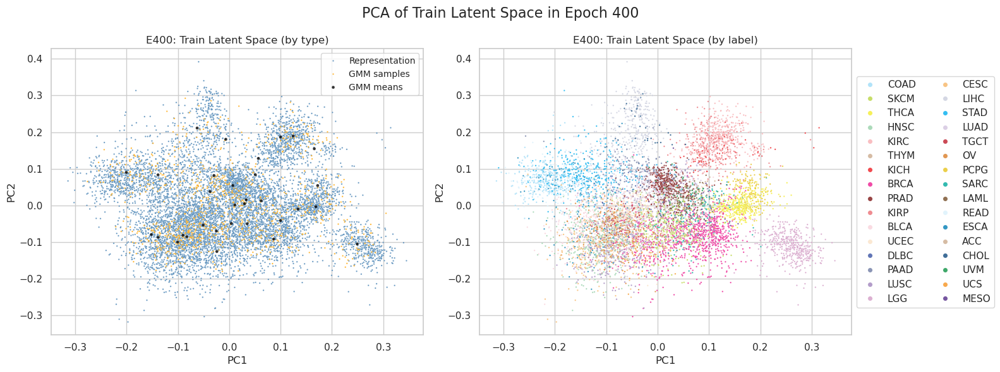

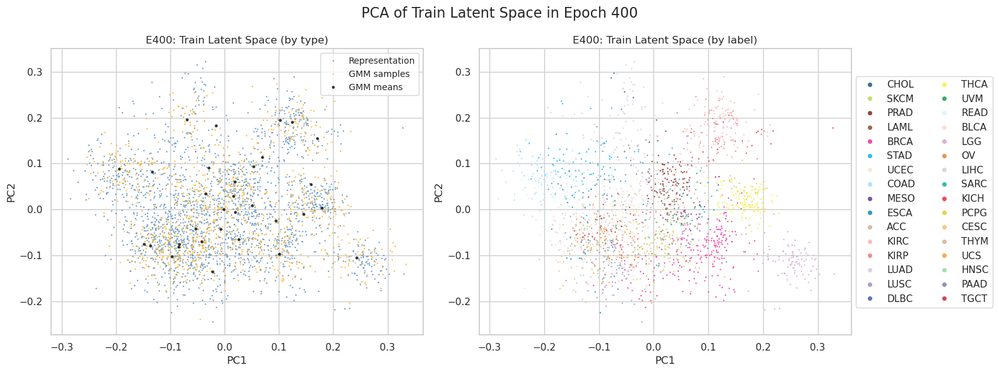

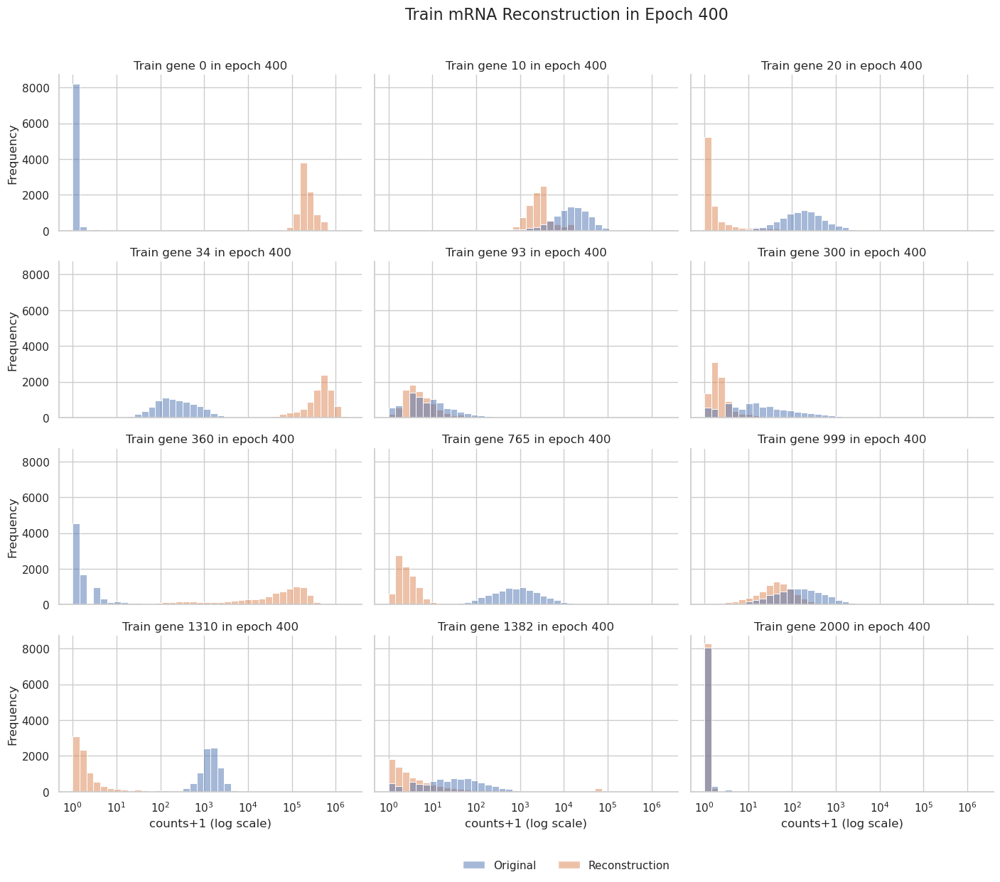

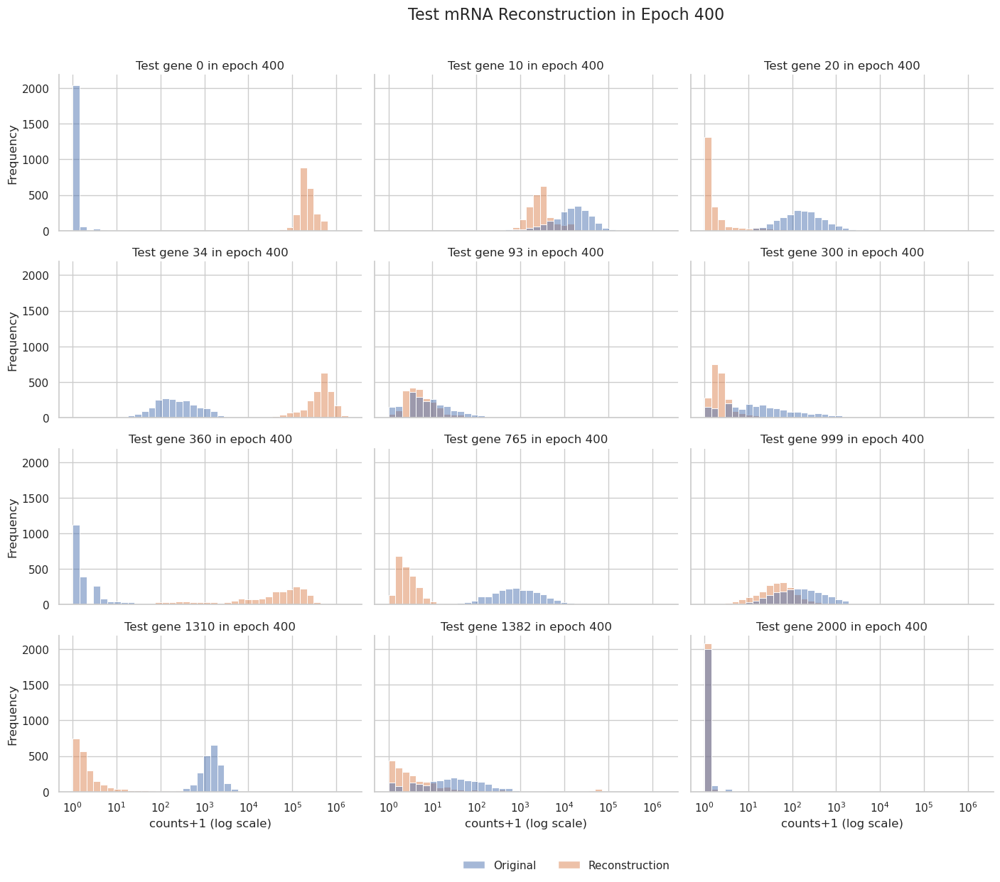

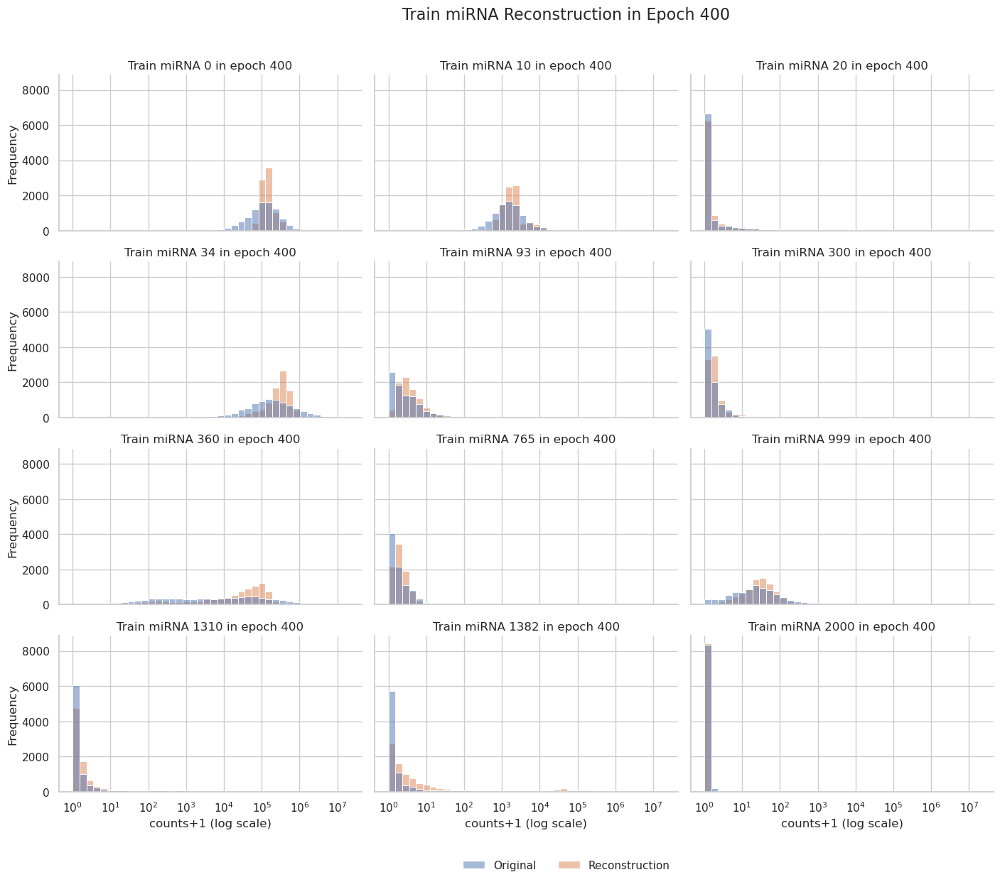

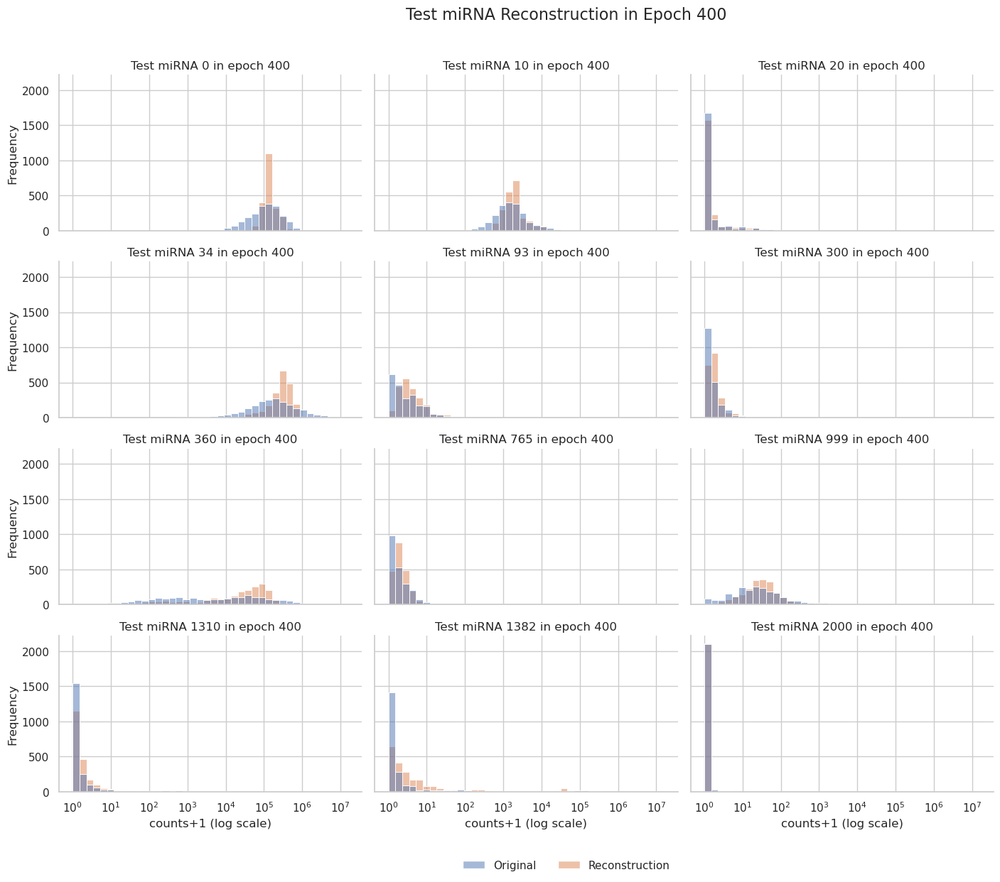

100%|████████████████████████████████████████████████████████████████████████████████████| 401/401 [32:34<00:00,  4.87s/it]

Fold 5 done...


In [22]:
dgd_cv, loss_cv = cross_validate(train_mrna, train_mirna, decoder, n_tissues, latent_dim, gmm_spec,
                                 device, num_workers, learning_rates, weight_decay, betas, sample_index, subset,
                                 nepochs, batch_size, is_plot, pr, plot, reduction_type, n_splits=n_splits, mode=2, wandb_log=False)

# Save Model

In [23]:
# Set results paths
loss_path = 'results/0405_loss_midgd.pickle'
dgd_path = 'results/0405_dgd_midgd.pickle'

torch.save(loss_cv, loss_path)
torch.save(dgd_cv, dgd_path)